In [1]:
library(mgcv)

Loading required package: nlme
This is mgcv 1.8-23. For overview type 'help("mgcv-package")'.


In [170]:
ROOT <- '/Users/dongmeichen/Documents/beetle'
DATA <- sprintf('%s/data', ROOT)
data <- read.csv(sprintf('%s/mpb10km_data_wo_costs.csv', DATA))
head(data)

lon,lat,etopo1,beetleAcres,host,forest,mStdAge,density,PctLarge,PctOld,⋯,minT,JanMin,TOctSep,Jan20,PcumOctSep,SprsFires,PctSprs,SprsAcre,SprsDays,OutDays
-124.2945,42.21193,387.5008,2.10,1,1,102.39621,51167.16,0.1931126,0.00000000,⋯,-1.701227,0.2686584,10.650637,0,3508.975,2,1.0000000,0.200000,0.0,3.5
-123.8987,40.71212,554.1549,0.80,0,1,55.00000,48183.45,0.3004344,0.11428571,⋯,-3.631704,-1.6740057,9.548764,0,3029.574,1,1.0000000,14.400000,0.0,11.0
-123.9778,41.15724,462.4003,0.46,1,1,24.51245,51675.95,0.2191781,0.06666667,⋯,-3.165836,-1.3108726,10.921748,0,2914.449,7,0.8750000,8.257143,3.0,6.0
-124.0749,41.69113,310.1873,0.70,1,1,64.69794,58227.45,0.2395833,0.07954546,⋯,-2.734460,-0.7594389,11.435045,0,3241.801,1,0.3333333,0.100000,0.0,1.0
-123.6292,39.83341,636.2545,0.70,1,1,78.60288,47511.05,0.3593750,0.50000000,⋯,-4.173242,-2.0681493,10.979370,0,2751.259,1,1.0000000,3597.000000,34.0,72.0
-123.8913,41.34770,354.7943,0.46,1,0,84.20680,52603.24,0.1860465,0.01282051,⋯,-3.712275,-1.7491565,11.032777,0,2947.334,6,1.0000000,1.433333,0.5,1.0


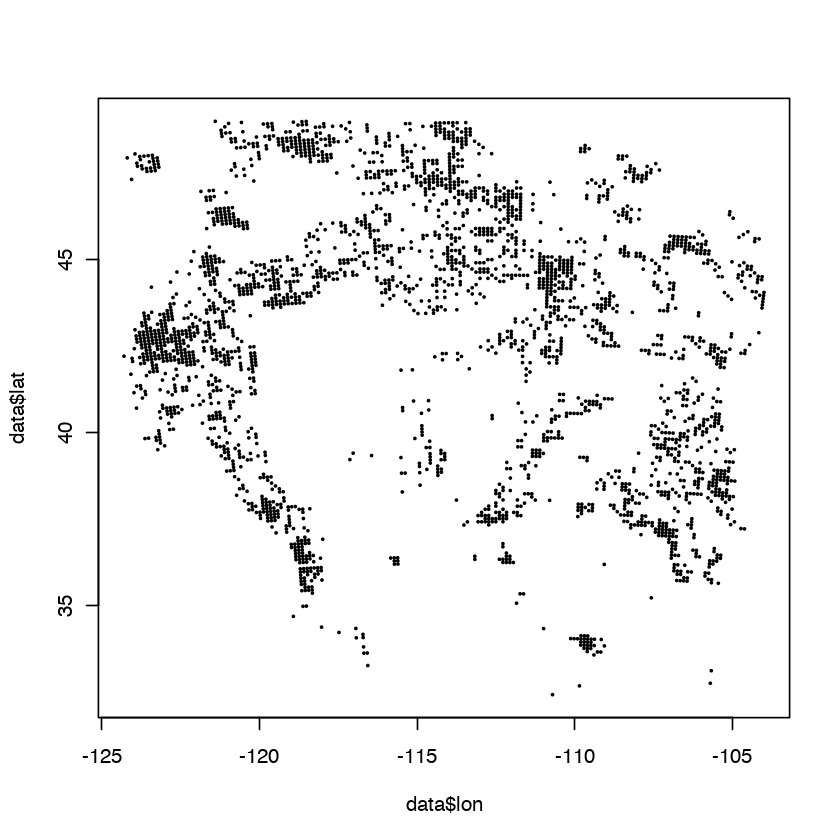

In [6]:
plot(data$lon, data$lat, pch=16, cex=0.3)

In [8]:
library(caret)

Loading required package: lattice
Loading required package: ggplot2


In [12]:
fit <- lm(
    log(beetleAcres) ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) + mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) + prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax 
    + Acs + I(Acs^2) + MarMin + ddAugJun + I(ddAugJun^2) + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) 
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,
    data=data)

In [15]:
data_ctrl <- trainControl(method = "cv", number = 5)

In [36]:
ptm <- proc.time()
model_caret <- train(beetleAcres^0.025 ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) + mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) + prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax 
    + Acs + I(Acs^2) + MarMin + ddAugJun + I(ddAugJun^2) + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) 
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,   # model to fit
    data = data,                        
    trControl = data_ctrl,              # folds
    method = "lmStepAIC",              # specifying regression model
    na.action = na.pass)
proc.time() - ptm

Start:  AIC=-13958.76
.outcome ~ lon + `I(lon^2)` + lat + `I(lat^2)` + etopo1 + `I(etopo1^2)` + 
    mStdAge + `I(mStdAge^2)` + density + `I(density^2)` + PctLarge + 
    PctOld + vcc + `log(vcc)` + mfri + `log(mfri)` + prs + `I(prs^2)` + 
    pms + pls + GAP1 + GAP2 + GAP3 + vpd + `I(vpd^2)` + cwd + 
    `I(cwd^2)` + maxAugT + `I(maxAugT^2)` + `I(summerP0^2)` + 
    summerP0 + Tmean + `I(Tmean^2)` + `exp(Tmean)` + mi + `I(mi^2)` + 
    Tvar + `I(Tvar^2)` + wd + `I(wd^2)` + AugTmean + `I(AugTmean^2)` + 
    OctTmin + `I(OctTmin^2)` + AugMaxT + `I(AugMaxT^2)` + AugTmax + 
    Acs + `I(Acs^2)` + MarMin + ddAugJun + `I(ddAugJun^2)` + 
    ddAugJul + `I(ddAugJul^2)` + JanTmin + PPT + `I(PPT^2)` + 
    summerP2 + `I(summerP2^2)` + TMarAug + `exp(TMarAug)` + Mar20 + 
    `log(Mar20 + 1)` + fallTmean + `exp(fallTmean)` + MarTmin + 
    maxT + `I(maxT^2)` + Tmin + winterMin + summerTmean + Pmean + 
    `I(Pmean^2)` + summerP1 + `I(summerP1^2)` + minT + JanMin + 
    `I(JanMin^2)` + TOctSep + `

In [37]:
model_caret

Linear Regression with Stepwise Selection 

2819 samples
  54 predictor

No pre-processing
Resampling: Cross-Validated (5 fold) 
Summary of sample sizes: 2255, 2256, 2255, 2255, 2255 
Resampling results:

  RMSE        Rsquared   MAE       
  0.04651868  0.4620153  0.03631076


In [25]:
?train

In [38]:
model_caret$finalModel


Call:
lm(formula = .outcome ~ `I(lon^2)` + lat + `I(lat^2)` + etopo1 + 
    mStdAge + `I(mStdAge^2)` + density + `I(density^2)` + PctOld + 
    prs + `I(prs^2)` + GAP1 + vpd + `I(vpd^2)` + `I(cwd^2)` + 
    `I(maxAugT^2)` + `I(summerP0^2)` + Tmean + `I(Tmean^2)` + 
    `exp(Tmean)` + mi + `I(mi^2)` + Tvar + `I(Tvar^2)` + wd + 
    `I(wd^2)` + AugTmean + `I(AugTmean^2)` + OctTmin + `I(OctTmin^2)` + 
    `I(AugMaxT^2)` + AugTmax + Acs + `I(Acs^2)` + `I(ddAugJul^2)` + 
    PPT + summerP2 + `I(summerP2^2)` + TMarAug + `exp(TMarAug)` + 
    Mar20 + `log(Mar20 + 1)` + fallTmean + `exp(fallTmean)` + 
    MarTmin + `I(maxT^2)` + Tmin + Pmean + `I(Pmean^2)` + minT + 
    JanMin + TOctSep + `exp(TOctSep)` + Jan20 + `I(Jan20^2)` + 
    PcumOctSep + `I(PcumOctSep^2)` + SprsFires + PctSprs + SprsAcre + 
    OutDays, data = dat)

Coefficients:
      (Intercept)         `I(lon^2)`                lat         `I(lat^2)`  
       -6.488e-01          2.051e-05          6.181e-02         -7.781e-04  
   

In [39]:
model_caret$resample

RMSE,Rsquared,MAE,Resample
0.04323077,0.5386916,0.03503817,Fold1
0.04831574,0.4117087,0.03716999,Fold2
0.04419508,0.4825621,0.03481559,Fold3
0.04762862,0.4469890,0.03648999,Fold4
0.04922317,0.4301252,0.03804003,Fold5


In [40]:
sd(model_caret$resample$Rsquared)

[1] 0.05018703

In [41]:
summary(model_caret$finalModel)


Call:
lm(formula = .outcome ~ `I(lon^2)` + lat + `I(lat^2)` + etopo1 + 
    mStdAge + `I(mStdAge^2)` + density + `I(density^2)` + PctOld + 
    prs + `I(prs^2)` + GAP1 + vpd + `I(vpd^2)` + `I(cwd^2)` + 
    `I(maxAugT^2)` + `I(summerP0^2)` + Tmean + `I(Tmean^2)` + 
    `exp(Tmean)` + mi + `I(mi^2)` + Tvar + `I(Tvar^2)` + wd + 
    `I(wd^2)` + AugTmean + `I(AugTmean^2)` + OctTmin + `I(OctTmin^2)` + 
    `I(AugMaxT^2)` + AugTmax + Acs + `I(Acs^2)` + `I(ddAugJul^2)` + 
    PPT + summerP2 + `I(summerP2^2)` + TMarAug + `exp(TMarAug)` + 
    Mar20 + `log(Mar20 + 1)` + fallTmean + `exp(fallTmean)` + 
    MarTmin + `I(maxT^2)` + Tmin + Pmean + `I(Pmean^2)` + minT + 
    JanMin + TOctSep + `exp(TOctSep)` + Jan20 + `I(Jan20^2)` + 
    PcumOctSep + `I(PcumOctSep^2)` + SprsFires + PctSprs + SprsAcre + 
    OutDays, data = dat)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.149153 -0.027829  0.002426  0.030008  0.226378 

Coefficients:
                    Estimate Std. Error t v

In [171]:
mod <- lm(
    beetleAcres^0.025~ I(lon^2) + lat + I(lat^2) + etopo1 + 
    mStdAge + I(mStdAge^2) + density + I(density^2) + PctOld + 
    prs + I(prs^2) + GAP1 + vpd + I(vpd^2) + I(cwd^2) + 
    I(maxAugT^2) + I(summerP0^2) + Tmean + I(Tmean^2) + 
    exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) + wd + 
    I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + 
    I(AugMaxT^2) + AugTmax + Acs + I(Acs^2) + I(ddAugJul^2) + 
    PPT + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + 
    Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean) + 
    MarTmin + I(maxT^2) + Tmin + Pmean + I(Pmean^2) + minT + 
    JanMin + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + 
    PcumOctSep + I(PcumOctSep^2) + SprsFires + PctSprs + SprsAcre + 
    OutDays, data=data)
summary(mod)


Call:
lm(formula = beetleAcres^0.025 ~ I(lon^2) + lat + I(lat^2) + 
    etopo1 + mStdAge + I(mStdAge^2) + density + I(density^2) + 
    PctOld + prs + I(prs^2) + GAP1 + vpd + I(vpd^2) + I(cwd^2) + 
    I(maxAugT^2) + I(summerP0^2) + Tmean + I(Tmean^2) + exp(Tmean) + 
    mi + I(mi^2) + Tvar + I(Tvar^2) + wd + I(wd^2) + AugTmean + 
    I(AugTmean^2) + OctTmin + I(OctTmin^2) + I(AugMaxT^2) + AugTmax + 
    Acs + I(Acs^2) + I(ddAugJul^2) + PPT + summerP2 + I(summerP2^2) + 
    TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + 
    exp(fallTmean) + MarTmin + I(maxT^2) + Tmin + Pmean + I(Pmean^2) + 
    minT + JanMin + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + 
    PcumOctSep + I(PcumOctSep^2) + SprsFires + PctSprs + SprsAcre + 
    OutDays, data = data)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.149153 -0.027829  0.002426  0.030008  0.226378 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -6.488e-01  2.942e-

In [172]:
cof.vars <- rownames(summary(mod)$coefficients)
cof.vars

[1] "(Intercept)"     "I(lon^2)"        "lat"             "I(lat^2)"       
 [5] "etopo1"          "mStdAge"         "I(mStdAge^2)"    "density"        
 [9] "I(density^2)"    "PctOld"          "prs"             "I(prs^2)"       
[13] "GAP1"            "vpd"             "I(vpd^2)"        "I(cwd^2)"       
[17] "I(maxAugT^2)"    "I(summerP0^2)"   "Tmean"           "I(Tmean^2)"     
[21] "exp(Tmean)"      "mi"              "I(mi^2)"         "Tvar"           
[25] "I(Tvar^2)"       "wd"              "I(wd^2)"         "AugTmean"       
[29] "I(AugTmean^2)"   "OctTmin"         "I(OctTmin^2)"    "I(AugMaxT^2)"   
[33] "AugTmax"         "Acs"             "I(Acs^2)"        "I(ddAugJul^2)"  
[37] "PPT"             "summerP2"        "I(summerP2^2)"   "TMarAug"        
[41] "exp(TMarAug)"    "Mar20"           "log(Mar20 + 1)"  "fallTmean"      
[45] "exp(fallTmean)"  "MarTmin"         "I(maxT^2)"       "Tmin"           
[49] "Pmean"           "I(Pmean^2)"      "minT"            "JanMin"         
[53] "TOctSep"         "exp(TOctSep)"    "Jan20"           "I(Jan20^2)"     
[57] "PcumOctSep"      "I(PcumOctSep^2)" "SprsFires"       "PctSprs"        
[61] "SprsAcre"        "OutDays"

In [173]:
vars <- cof.vars[!(cof.vars %in% grep('(exp|I|log)', cof.vars, value=T))]
vars

[1] "lat"        "etopo1"     "mStdAge"    "density"    "PctOld"    
 [6] "prs"        "GAP1"       "vpd"        "Tmean"      "mi"        
[11] "Tvar"       "wd"         "AugTmean"   "OctTmin"    "AugTmax"   
[16] "Acs"        "PPT"        "summerP2"   "TMarAug"    "Mar20"     
[21] "fallTmean"  "MarTmin"    "Tmin"       "Pmean"      "minT"      
[26] "JanMin"     "TOctSep"    "Jan20"      "PcumOctSep" "SprsFires" 
[31] "PctSprs"    "SprsAcre"   "OutDays"

In [174]:
exps <- grep('exp', cof.vars, value=TRUE)
exps
exp_terms <- gsub("[()]", "", gsub('exp', "", exps))
exp_terms

[1] "exp(Tmean)"     "exp(TMarAug)"   "exp(fallTmean)" "exp(TOctSep)"

[1] "Tmean"     "TMarAug"   "fallTmean" "TOctSep"

In [175]:
sqs <- grep('I()', cof.vars, value=TRUE)[-1]
sqs

[1] "I(lon^2)"        "I(lat^2)"        "I(mStdAge^2)"    "I(density^2)"   
 [5] "I(prs^2)"        "I(vpd^2)"        "I(cwd^2)"        "I(maxAugT^2)"   
 [9] "I(summerP0^2)"   "I(Tmean^2)"      "I(mi^2)"         "I(Tvar^2)"      
[13] "I(wd^2)"         "I(AugTmean^2)"   "I(OctTmin^2)"    "I(AugMaxT^2)"   
[17] "I(Acs^2)"        "I(ddAugJul^2)"   "I(summerP2^2)"   "I(maxT^2)"      
[21] "I(Pmean^2)"      "I(Jan20^2)"      "I(PcumOctSep^2)"

In [176]:
sq_terms <- gsub('I\\(', '',gsub('\\^2)', '', sqs))
sq_terms

[1] "lon"        "lat"        "mStdAge"    "density"    "prs"       
 [6] "vpd"        "cwd"        "maxAugT"    "summerP0"   "Tmean"     
[11] "mi"         "Tvar"       "wd"         "AugTmean"   "OctTmin"   
[16] "AugMaxT"    "Acs"        "ddAugJul"   "summerP2"   "maxT"      
[21] "Pmean"      "Jan20"      "PcumOctSep"

In [177]:
logs <- grep('log', cof.vars, value=TRUE)
logs
logp1_terms <- gsub("[[:blank:]]", "", gsub("log\\(", "", gsub('\\+ 1)', "", logs)))
logp1_terms

[1] "log(Mar20 + 1)"

[1] "Mar20"

In [178]:
for (v in c(vars, sqs, exps, logs)){
    cat(sprintf('%s + ', v))   
}

lat + etopo1 + mStdAge + density + PctOld + prs + GAP1 + vpd + Tmean + mi + Tvar + wd + AugTmean + OctTmin + AugTmax + Acs + PPT + summerP2 + TMarAug + Mar20 + fallTmean + MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + Jan20 + PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + I(lon^2) + I(lat^2) + I(mStdAge^2) + I(density^2) + I(prs^2) + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + I(Tmean^2) + I(mi^2) + I(Tvar^2) + I(wd^2) + I(AugTmean^2) + I(OctTmin^2) + I(AugMaxT^2) + I(Acs^2) + I(ddAugJul^2) + I(summerP2^2) + I(maxT^2) + I(Pmean^2) + I(Jan20^2) + I(PcumOctSep^2) + exp(Tmean) + exp(TMarAug) + exp(fallTmean) + exp(TOctSep) + log(Mar20 + 1) + 

In [179]:
mod <- lm(
    beetleAcres^0.025~ lat + etopo1 + mStdAge + density + PctOld + prs + GAP1 + vpd + 
    Tmean + mi + Tvar + wd + AugTmean + OctTmin + AugTmax + Acs + PPT + summerP2 + 
    TMarAug + Mar20 + fallTmean + MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + 
    Jan20 + PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + I(lon^2) + I(lat^2) + 
    I(mStdAge^2) + I(density^2) + I(prs^2) + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + 
    I(summerP0^2) + I(Tmean^2) + I(mi^2) + I(Tvar^2) + I(wd^2) + I(AugTmean^2) + 
    I(OctTmin^2) + I(AugMaxT^2) + I(Acs^2) + I(ddAugJul^2) + I(summerP2^2) + I(maxT^2) + 
    I(Pmean^2) + I(Jan20^2) + I(PcumOctSep^2) + exp(Tmean) + exp(TMarAug) + exp(fallTmean) + 
    exp(TOctSep) + log(Mar20 + 1), data=data)
summary(mod)


Call:
lm(formula = beetleAcres^0.025 ~ lat + etopo1 + mStdAge + density + 
    PctOld + prs + GAP1 + vpd + Tmean + mi + Tvar + wd + AugTmean + 
    OctTmin + AugTmax + Acs + PPT + summerP2 + TMarAug + Mar20 + 
    fallTmean + MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + 
    Jan20 + PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + 
    I(lon^2) + I(lat^2) + I(mStdAge^2) + I(density^2) + I(prs^2) + 
    I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + I(Tmean^2) + 
    I(mi^2) + I(Tvar^2) + I(wd^2) + I(AugTmean^2) + I(OctTmin^2) + 
    I(AugMaxT^2) + I(Acs^2) + I(ddAugJul^2) + I(summerP2^2) + 
    I(maxT^2) + I(Pmean^2) + I(Jan20^2) + I(PcumOctSep^2) + exp(Tmean) + 
    exp(TMarAug) + exp(fallTmean) + exp(TOctSep) + log(Mar20 + 
    1), data = data)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.149153 -0.027829  0.002426  0.030008  0.226378 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -6.488e-01  2.942e-

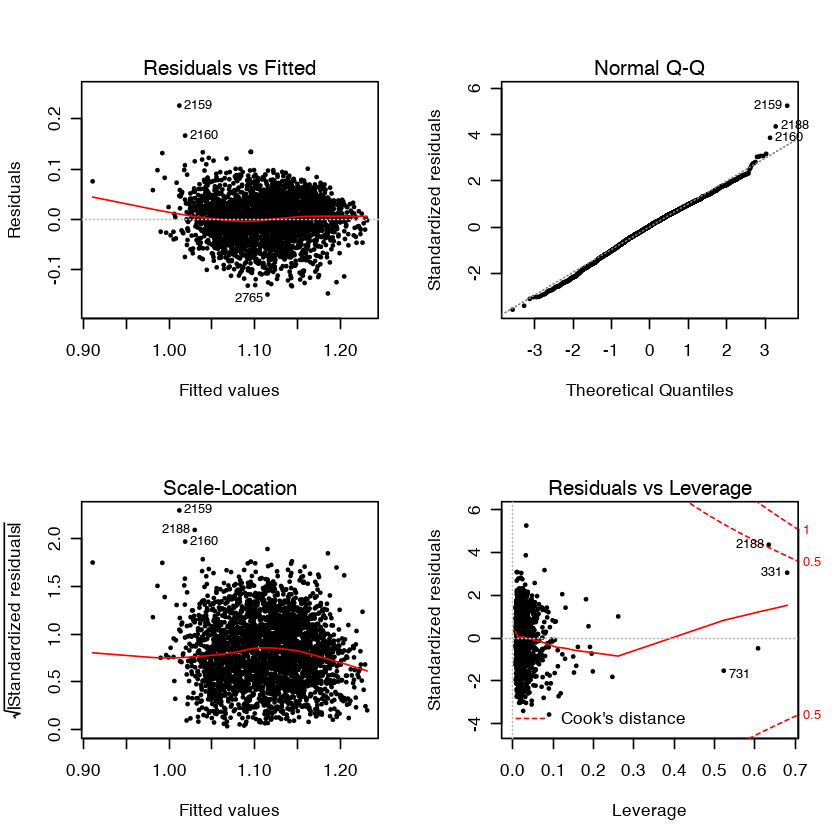

In [180]:
par(mfrow=c(2, 2))
plot(mod, cex=0.5, pch=16)

In [182]:
data1 = data[-2188,]
mod1 <- lm(
    beetleAcres^0.025~ lat + etopo1 + mStdAge + density + PctOld + prs + GAP1 + vpd + 
    Tmean + mi + Tvar + wd + AugTmean + OctTmin + AugTmax + Acs + PPT + summerP2 + 
    TMarAug + Mar20 + fallTmean + MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + 
    Jan20 + PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + I(lon^2) + I(lat^2) + 
    I(mStdAge^2) + I(density^2) + I(prs^2) + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + 
    I(summerP0^2) + I(Tmean^2) + I(mi^2) + I(Tvar^2) + I(wd^2) + I(AugTmean^2) + 
    I(OctTmin^2) + I(AugMaxT^2) + I(Acs^2) + I(ddAugJul^2) + I(summerP2^2) + I(maxT^2) + 
    I(Pmean^2) + I(Jan20^2) + I(PcumOctSep^2) + exp(Tmean) + exp(TMarAug) + exp(fallTmean) + 
    exp(TOctSep) + log(Mar20 + 1), data=data1)
summary(mod1)


Call:
lm(formula = beetleAcres^0.025 ~ lat + etopo1 + mStdAge + density + 
    PctOld + prs + GAP1 + vpd + Tmean + mi + Tvar + wd + AugTmean + 
    OctTmin + AugTmax + Acs + PPT + summerP2 + TMarAug + Mar20 + 
    fallTmean + MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + 
    Jan20 + PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + 
    I(lon^2) + I(lat^2) + I(mStdAge^2) + I(density^2) + I(prs^2) + 
    I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + I(Tmean^2) + 
    I(mi^2) + I(Tvar^2) + I(wd^2) + I(AugTmean^2) + I(OctTmin^2) + 
    I(AugMaxT^2) + I(Acs^2) + I(ddAugJul^2) + I(summerP2^2) + 
    I(maxT^2) + I(Pmean^2) + I(Jan20^2) + I(PcumOctSep^2) + exp(Tmean) + 
    exp(TMarAug) + exp(fallTmean) + exp(TOctSep) + log(Mar20 + 
    1), data = data1)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.146656 -0.028013  0.002349  0.029948  0.225732 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -6.378e-01  2.933e

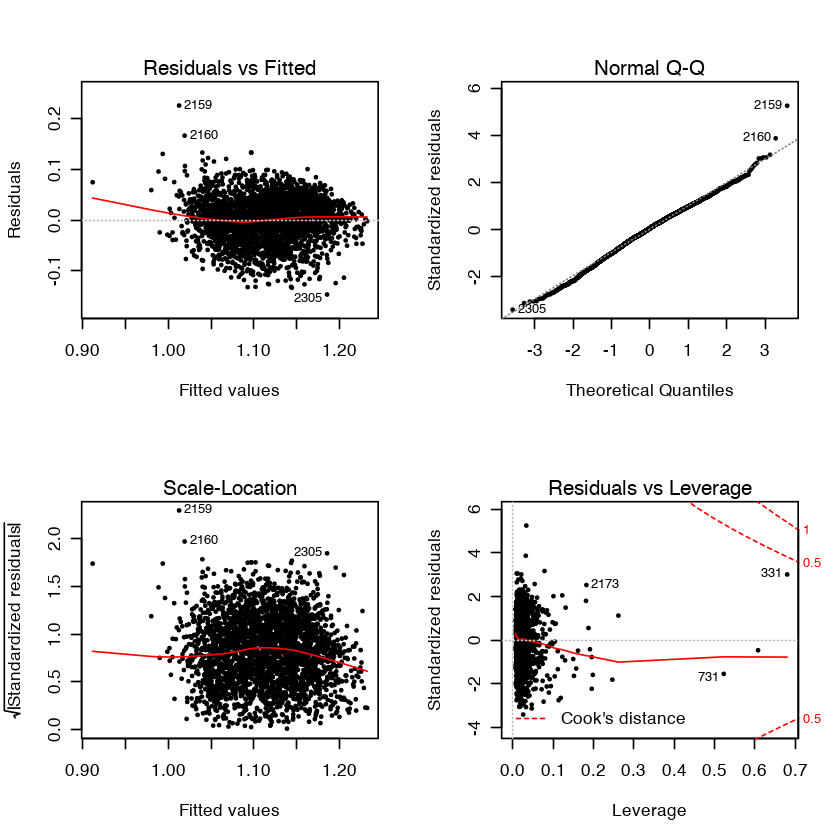

In [184]:
par(mfrow=c(2, 2))
plot(mod1, cex=0.5, pch=16)

In [185]:
as.data.frame(summary(mod1)$coefficients[,c(1,4)])

,Estimate,Pr(>|t|)
(Intercept),-6.378401e-01,2.971533e-02
lat,6.232580e-02,5.172150e-07
etopo1,4.777234e-05,3.331115e-14
mStdAge,5.844013e-05,1.223872e-01
density,1.376833e-06,6.197994e-26
PctOld,7.080125e-03,2.873855e-02
prs,1.527121e-03,1.694951e-02
GAP1,-9.250384e-03,4.987114e-03
vpd,-1.230843e-06,2.778789e-04
Tmean,2.406484e+00,1.673555e-05


In [186]:
raw <- as.data.frame(summary(mod1)$coefficients[,c(1,4)])

In [187]:
names(raw)[2] <- 'p1'

In [188]:
raw$s1 <- ifelse(raw$p1 < 0.001, "***", 
                 ifelse(raw$p1 < 0.01, "**",
                ifelse(raw$p1 < 0.05, "*", 
                ifelse(raw$p1 < 0.1, ".", 
                ""))))

In [189]:
head(raw)

,Estimate,p1,s1
(Intercept),-6.378401e-01,2.971533e-02,*
lat,6.232580e-02,5.172150e-07,***
etopo1,4.777234e-05,3.331115e-14,***
mStdAge,5.844013e-05,1.223872e-01,
density,1.376833e-06,6.197994e-26,***
PctOld,7.080125e-03,2.873855e-02,*


In [190]:
data2 <- data1
for(var in sq_terms){
    varnm <- paste0(var, '_sq')
    data2[,varnm] <- (data2[,var])^2
    cat(sprintf('Calculated %s in a squared term...\n', var))
}

for(var in exp_terms){
    varnm <- paste0(var, '_exp')
    data2[,varnm] <- exp(data2[,var])
    cat(sprintf('Calculated %s in a exponential term...\n', var))
}

for(var in logp1_terms){
    varnm <- paste0(var, '_logp1')
    data2[,varnm] <- log(data2[,var]+1)
    cat(sprintf('Calculated %s in a logarithm term...\n', var))
}

Calculated lon in a squared term...
Calculated lat in a squared term...
Calculated mStdAge in a squared term...
Calculated density in a squared term...
Calculated prs in a squared term...
Calculated vpd in a squared term...
Calculated cwd in a squared term...
Calculated maxAugT in a squared term...
Calculated summerP0 in a squared term...
Calculated Tmean in a squared term...
Calculated mi in a squared term...
Calculated Tvar in a squared term...
Calculated wd in a squared term...
Calculated AugTmean in a squared term...
Calculated OctTmin in a squared term...
Calculated AugMaxT in a squared term...
Calculated Acs in a squared term...
Calculated ddAugJul in a squared term...
Calculated summerP2 in a squared term...
Calculated maxT in a squared term...
Calculated Pmean in a squared term...
Calculated Jan20 in a squared term...
Calculated PcumOctSep in a squared term...
Calculated Tmean in a exponential term...
Calculated TMarAug in a exponential term...
Calculated fallTmean in a exponen

In [191]:
selected.vars <- c(vars, paste0(sq_terms, '_sq'), paste0(exp_terms, '_exp'), paste0(logp1_terms, '_logp1'))
predictors <- data2[ , (names(data2) %in% selected.vars)]
predictors <- scale(predictors)
df <- data.frame(beetleAcres=data2[,'beetleAcres'], predictors)
df$beetleAcres <- (df$beetleAcres)^0.025

In [192]:
mod2 <- lm(beetleAcres ~ ., data=df)

In [193]:
summary(mod2)


Call:
lm(formula = beetleAcres ~ ., data = df)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.146656 -0.028013  0.002349  0.029948  0.225732 

Coefficients:
                Estimate Std. Error  t value Pr(>|t|)    
(Intercept)    1.1135257  0.0008232 1352.736  < 2e-16 ***
lat            0.2330413  0.0463140    5.032 5.17e-07 ***
etopo1         0.0323991  0.0042489    7.625 3.33e-14 ***
mStdAge        0.0030902  0.0019997    1.545 0.122387    
density        0.0235482  0.0022134   10.639  < 2e-16 ***
PctOld         0.0020990  0.0009593    2.188 0.028739 *  
prs            0.0112658  0.0047152    2.389 0.016950 *  
GAP1          -0.0031425  0.0011183   -2.810 0.004987 ** 
vpd           -0.0596823  0.0163972   -3.640 0.000278 ***
Tmean          6.6617837  1.5448877    4.312 1.67e-05 ***
mi             0.2003474  0.0359983    5.565 2.87e-08 ***
Tvar           0.1552166  0.0396725    3.912 9.36e-05 ***
wd            -0.1682543  0.0295720   -5.690 1.41e-08 ***
AugTmean   

In [194]:
sort(abs(mod2$coefficients))

OutDays        PctOld      SprsAcre    mStdAge_sq       mStdAge 
  0.001752994   0.002099042   0.002682056   0.002770002   0.003090162 
         GAP1       PctSprs     SprsFires           prs        prs_sq 
  0.003142485   0.005729846   0.007461251   0.011265824   0.012488182 
   density_sq    OctTmin_sq           Acs    maxAugT_sq        cwd_sq 
  0.013270377   0.014866325   0.015927984   0.017314522   0.020673198 
        Jan20        Acs_sq       density   ddAugJul_sq        lon_sq 
  0.020985513   0.022456630   0.023548244   0.023897371   0.026730482 
     Jan20_sq         wd_sq   TMarAug_exp        etopo1       MarTmin 
  0.030465714   0.030931221   0.032017856   0.032399124   0.034896371 
     summerP2        vpd_sq       AugTmax fallTmean_exp         Mar20 
  0.036884588   0.042757368   0.043024154   0.043693248   0.050869079 
  Mar20_logp1      Tmean_sq        JanMin   AugTmean_sq    AugMaxT_sq 
  0.051761228   0.052445877   0.053546877   0.056007517   0.057409284 
        mi_sq           vpd          minT       maxT_sq       Tvar_sq 
  0.059329719   0.059682337   0.069078863   0.071349069   0.093225022 
      OctTmin          Tmin      AugTmean          Tvar            wd 
  0.100789368   0.104422285   0.123342444   0.155216577   0.168254250 
  summerP0_sq       TMarAug            mi   summerP2_sq           lat 
  0.191079097   0.199946892   0.200347370   0.216166494   0.233041321 
       lat_sq     fallTmean           PPT   (Intercept)   TOctSep_exp 
  0.247660202   0.264318126   0.298660481   1.113525666   2.339336220 
    Tmean_exp         Pmean    PcumOctSep      Pmean_sq PcumOctSep_sq 
  2.413522486   3.455371056   3.820143328   3.964468439   4.020162667 
      TOctSep         Tmean 
  6.157132914   6.661783705

In [197]:
scaled <- as.data.frame(summary(mod2)$coefficients[,c(1,4)])
scaled

,Estimate,Pr(>|t|)
(Intercept),1.113525666,0.000000e+00
lat,0.233041321,5.172150e-07
etopo1,0.032399124,3.331115e-14
mStdAge,0.003090162,1.223872e-01
density,0.023548244,6.197994e-26
PctOld,0.002099042,2.873855e-02
prs,0.011265824,1.694951e-02
GAP1,-0.003142485,4.987114e-03
vpd,-0.059682337,2.778789e-04
Tmean,6.661783705,1.673555e-05


In [198]:
names(scaled)[2] <- 'p2'
scaled$s2 <- ifelse(scaled$p2 < 0.001, "***", 
                 ifelse(scaled$p2 < 0.01, "**",
                ifelse(scaled$p2 < 0.05, "*", 
                ifelse(scaled$p2 < 0.1, ".", 
                ""))))

In [201]:
v <- data.frame(variable=rownames(scaled))

In [202]:
model1.table <- cbind(v, raw, scaled)
head(model1.table)

,variable,Estimate,p1,s1,Estimate,p2,s2
(Intercept),(Intercept),-6.378401e-01,2.971533e-02,*,1.113525666,0.000000e+00,***
lat,lat,6.232580e-02,5.172150e-07,***,0.233041321,5.172150e-07,***
etopo1,etopo1,4.777234e-05,3.331115e-14,***,0.032399124,3.331115e-14,***
mStdAge,mStdAge,5.844013e-05,1.223872e-01,,0.003090162,1.223872e-01,
density,density,1.376833e-06,6.197994e-26,***,0.023548244,6.197994e-26,***
PctOld,PctOld,7.080125e-03,2.873855e-02,*,0.002099042,2.873855e-02,*


In [ ]:
write.csv(model1.table, sprintf('%s/model1_table.csv', DATA), row.names=TRUE)

In [67]:
med.df <- data.frame(t(apply(data1, 2, median)))
n.steps <- 100
med.df <- med.df[rep(1, n.steps),]

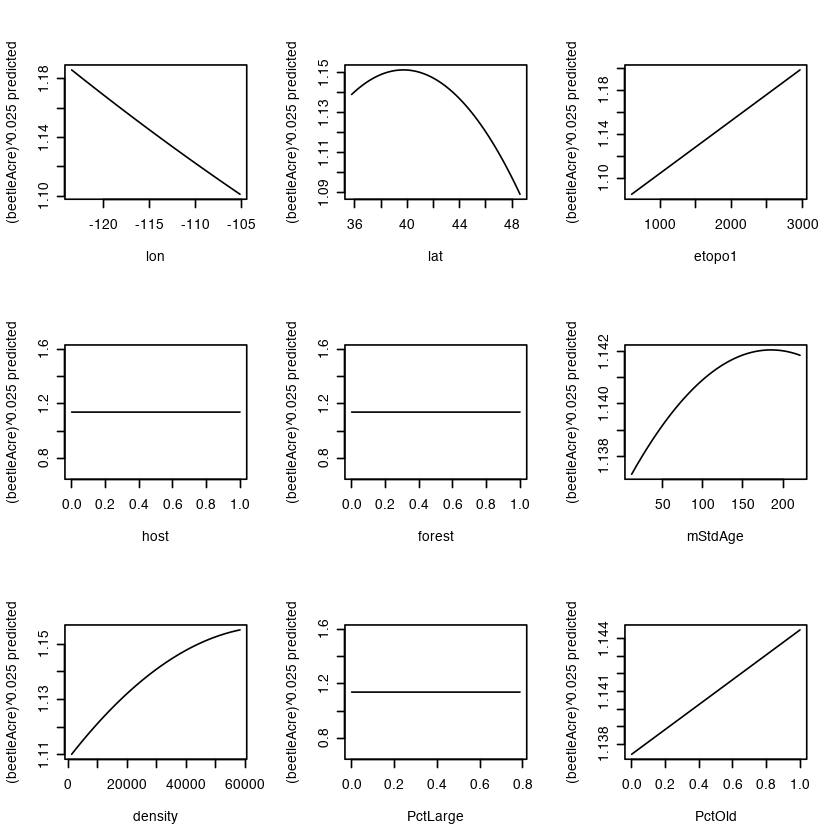

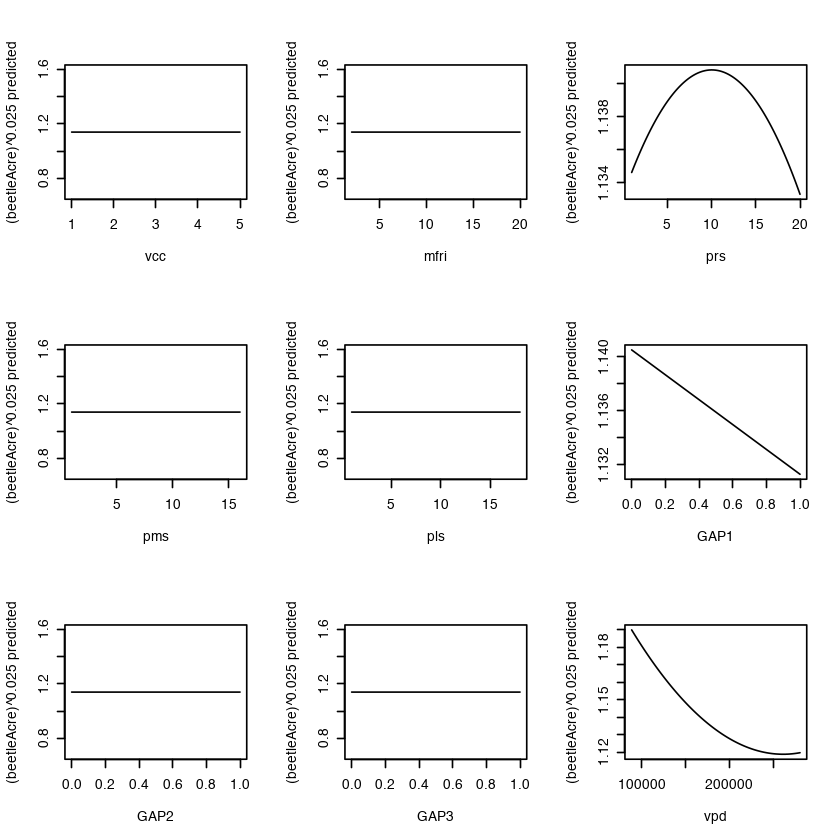

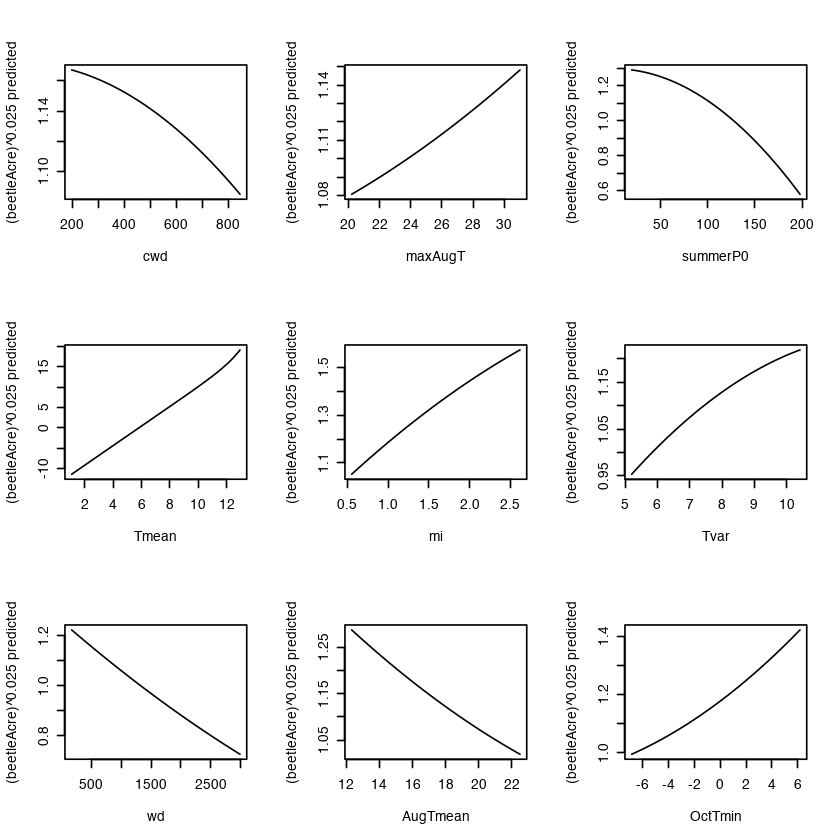

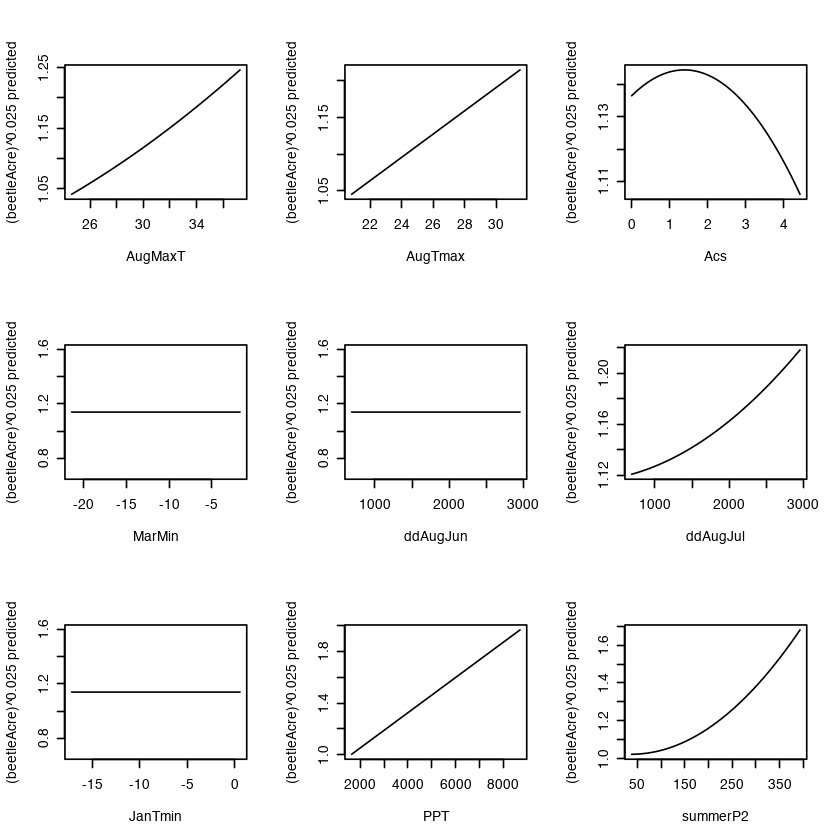

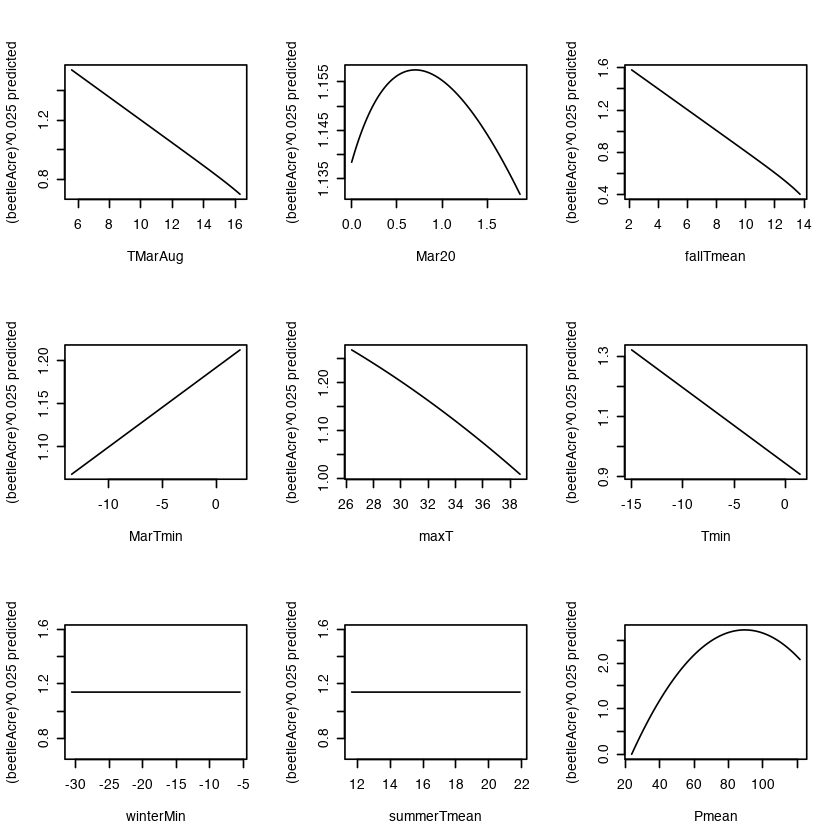

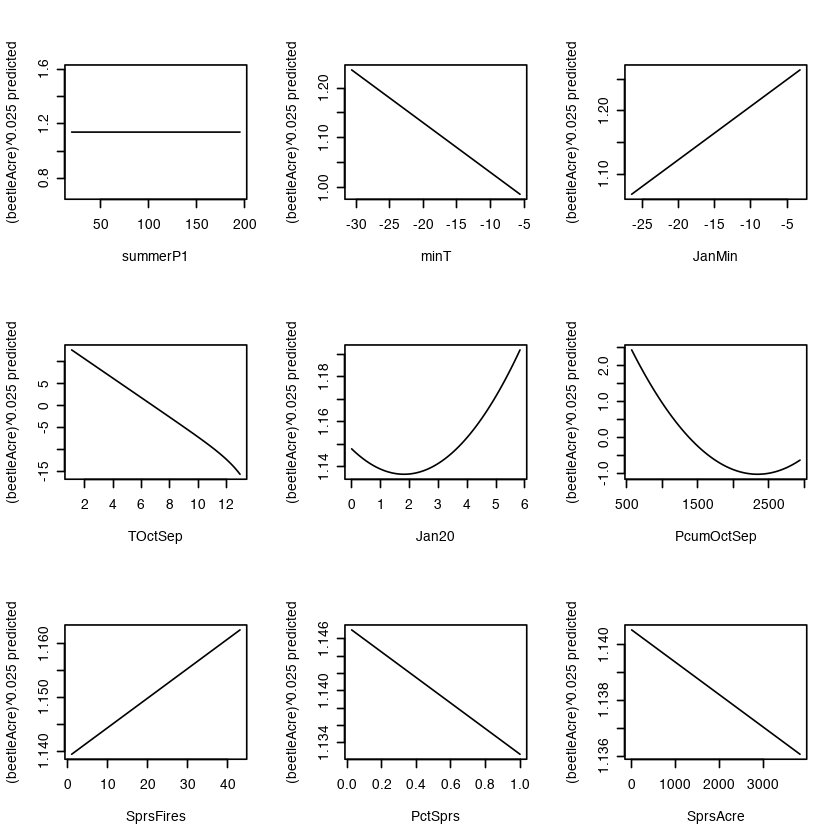

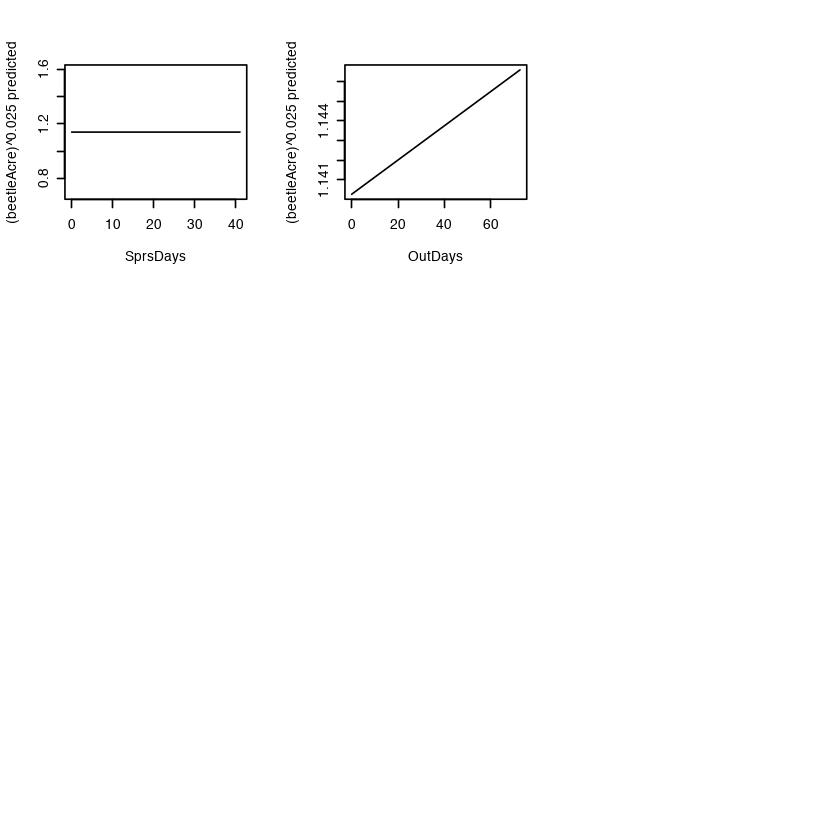

In [195]:
par(mfrow=c(3, 3))
for (field in names(med.df)) {
  if (!(field %in% c('preds', 'beetleAcres'))) {
    test.df <- med.df
    xmin <- quantile(data[, field], probs=0.025)
    xmax <- quantile(data[, field], probs=0.975)
    test.df[, field] <- seq(xmin, xmax, length=100)
    preds <- predict(mod1, newdata=test.df)
    plot(preds ~ test.df[, field], 
         type='l', 
         xlab=field, 
         ylab='(beetleAcre)^0.025 predicted')
  }
}

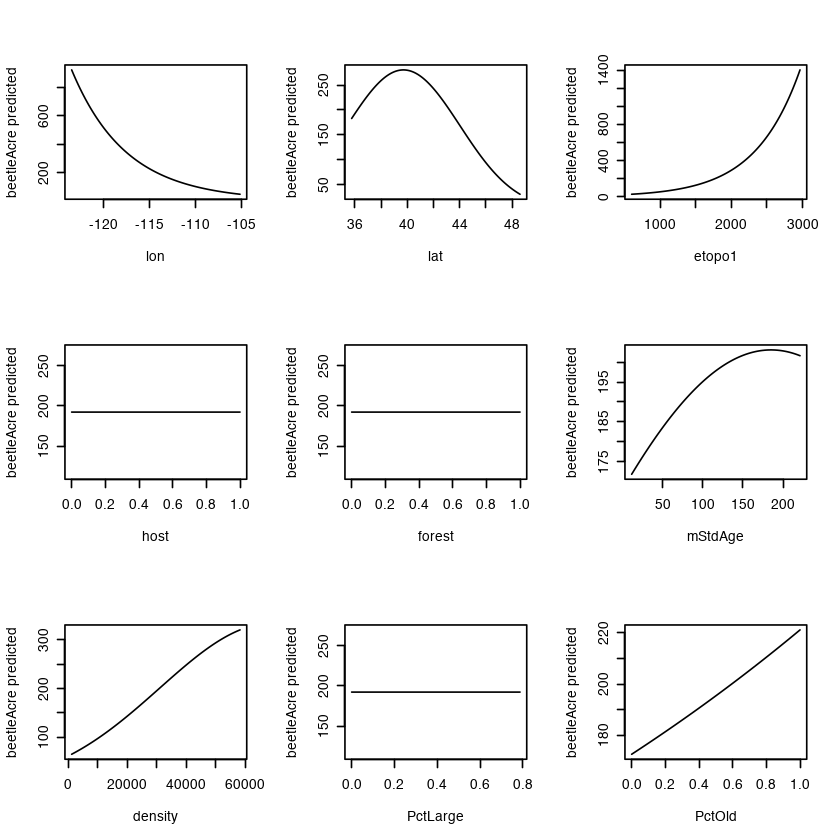

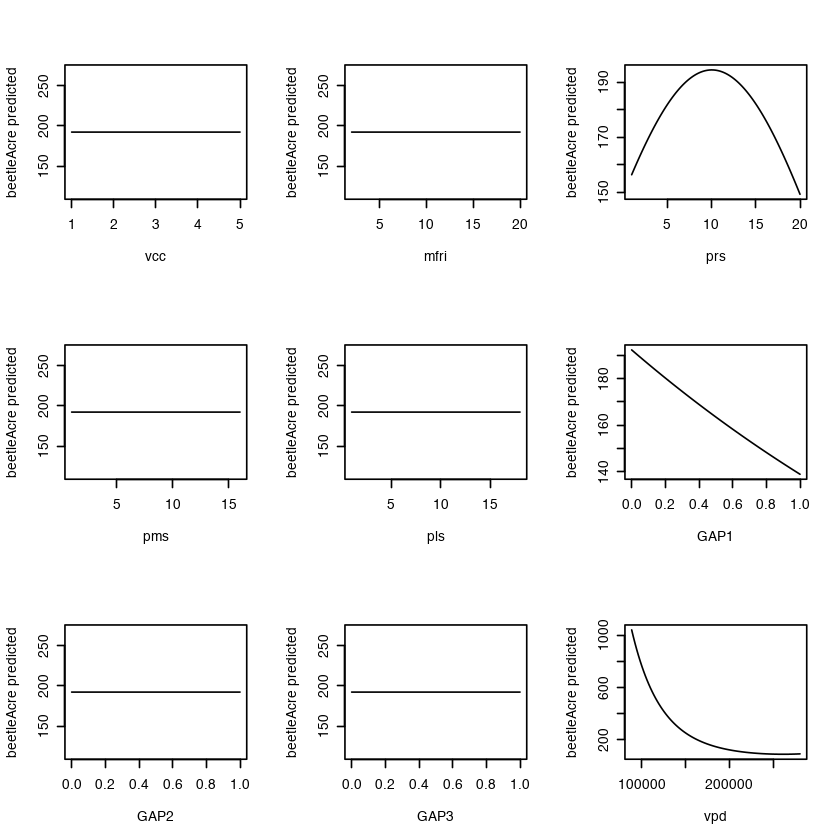

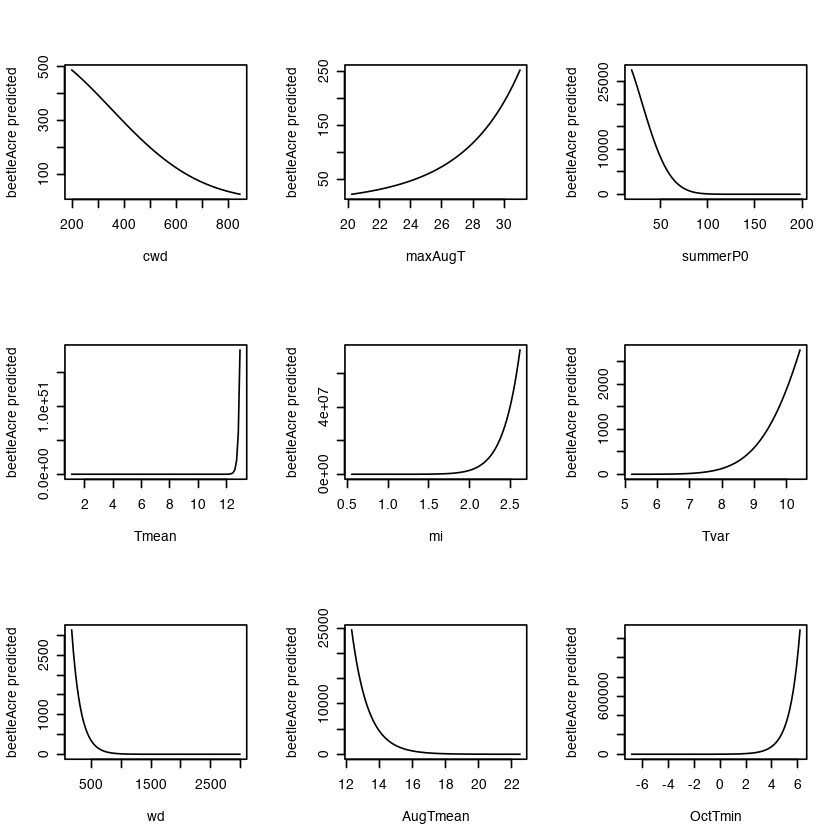

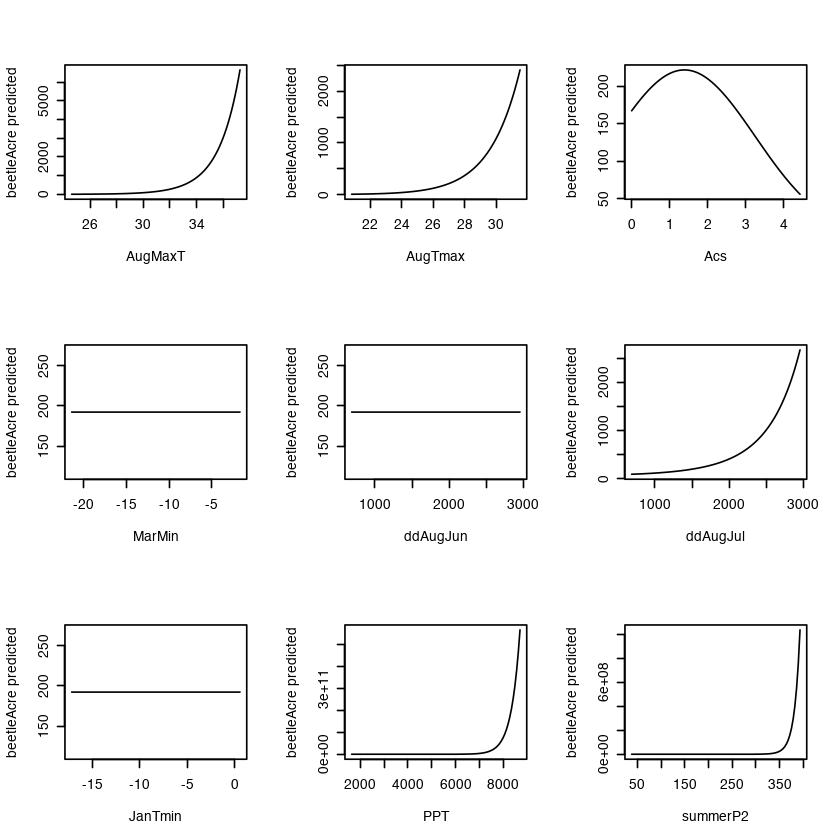

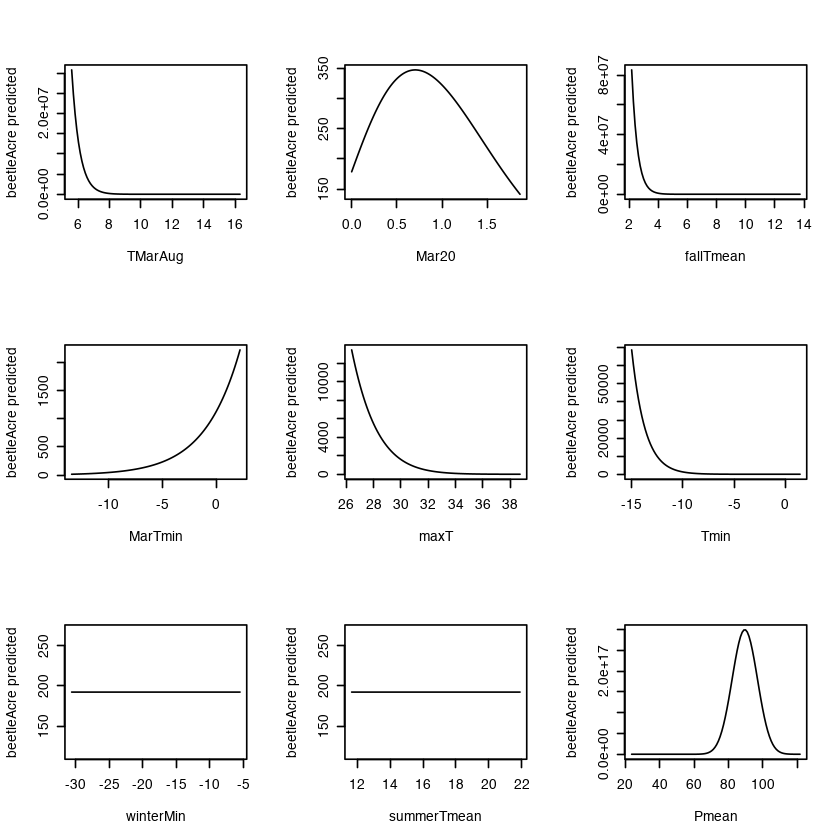

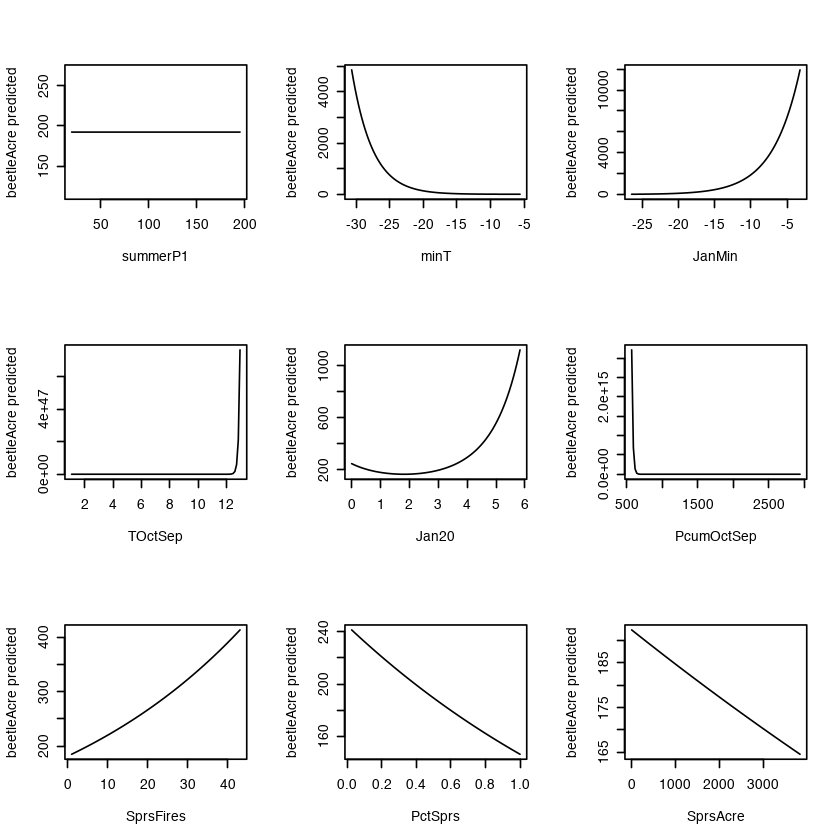

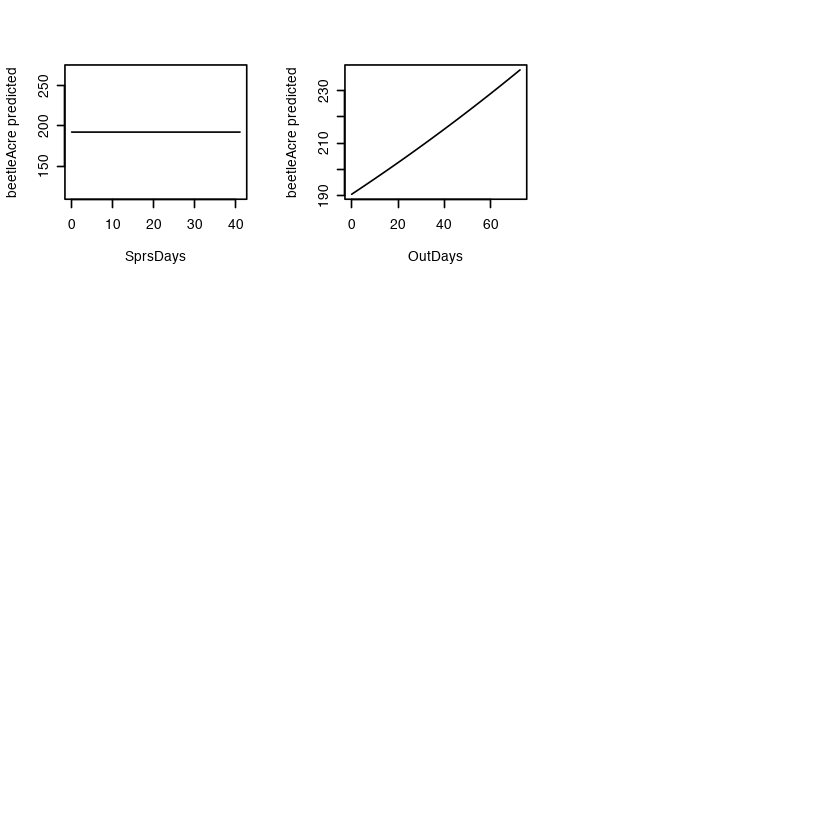

In [196]:
m <- data.frame(matrix(, nrow = 100, ncol = 6))
colnames(m) <- c('SprsFires', 'SprsFires.y', 'PctSprs', 'PctSprs.y', 'SprsAcre', 'SprsAcre.y')
par(mfrow=c(3, 3))
for (field in names(med.df)) {
  if (!(field %in% c('preds', 'beetleAcres'))) {
    test.df <- med.df
    xmin <- quantile(data[, field], probs=0.025)
    xmax <- quantile(data[, field], probs=0.975)
    test.df[, field] <- seq(xmin, xmax, length=100)
    preds <- (predict(mod1, newdata=test.df))^(1/0.025)
    i <- 1
    if(field %in% c('SprsFires', 'PctSprs', 'SprsAcre')){
        m[,field] <- test.df[, field]
        m[,paste0(field,'.y')] <- preds
        i <- i + 1
    }
    plot(preds ~ test.df[, field], 
         type='l', 
         xlab=field, 
         ylab='beetleAcre predicted')
  }
}
write.csv(m, sprintf('%s/plot_2D_firedata.csv', DATA), row.names=FALSE)

In [3]:
cor.test(data$SprsFires, log(data$beetleAcres))


	Pearson's product-moment correlation

data:  data$SprsFires and log(data$beetleAcres)
t = -4.9734, df = 2817, p-value = 6.974e-07
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.12976620 -0.05657264
sample estimates:
        cor 
-0.09329547 


In [4]:
cor.test(data$PctSprs, log(data$beetleAcres))


	Pearson's product-moment correlation

data:  data$PctSprs and log(data$beetleAcres)
t = -11.569, df = 2817, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.2479484 -0.1774579
sample estimates:
       cor 
-0.2129802 


In [5]:
cor.test(data$SprsAcre, log(data$beetleAcres))


	Pearson's product-moment correlation

data:  data$SprsAcre and log(data$beetleAcres)
t = -0.40545, df = 2817, p-value = 0.6852
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.04454398  0.02928707
sample estimates:
         cor 
-0.007638868 


In [6]:
cor.test(data$SprsDays, log(data$beetleAcres))


	Pearson's product-moment correlation

data:  data$SprsDays and log(data$beetleAcres)
t = 4.0643, df = 2817, p-value = 4.949e-05
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.03954654 0.11295203
sample estimates:
       cor 
0.07635274 


In [7]:
cor.test(data$OutDays, log(data$beetleAcres))


	Pearson's product-moment correlation

data:  data$OutDays and log(data$beetleAcres)
t = 0.95775, df = 2817, p-value = 0.3383
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.01888818  0.05492317
sample estimates:
       cor 
0.01804208 


In [3]:
# GAM iteration
ptm <- proc.time()
mod <- gam(
    log(beetleAcres) ~ te(lon) + te(lat) + te(etopo1) + host + forest + te(mStdAge) + 
    te(density) + te(PctLarge) + te(PctOld) + te(vcc) + te(mfri) + te(prs) + te(pms) + 
    te(pls) + GAP1 + GAP2 + GAP3 + te(vpd) + te(cwd) + te(maxAugT) + te(summerP0) + 
    te(Tmean) + te(mi) + te(Tvar) + te(wd) + te(AugTmean) + te(OctTmin) + te(AugMaxT) + 
    te(AugTmax) + te(Acs) + te(MarMin) + te(ddAugJun) + te(ddAugJul) + te(JanTmin) + 
    te(PPT) + te(summerP2) + te(TMarAug) + te(Mar20) + te(fallTmean) + te(MarTmin) + 
    te(maxT) + te(Tmin) + te(winterMin) + te(summerTmean) + te(Pmean) + te(summerP1) + 
    te(minT) + te(JanMin) + te(TOctSep) + te(Jan20) + te(PcumOctSep) + 
    te(SprsFires) + te(PctSprs) + te(SprsAcre) + te(SprsDays) + te(OutDays),
    data=data) # GCV = 2.2692
proc.time() - ptm

   user  system elapsed 
 29.346   0.580  31.067 

In [4]:
summary(mod)


Family: gaussian 
Link function: identity 

Formula:
log(beetleAcres) ~ te(lon) + te(lat) + te(etopo1) + host + forest + 
    te(mStdAge) + te(density) + te(PctLarge) + te(PctOld) + te(vcc) + 
    te(mfri) + te(prs) + te(pms) + te(pls) + GAP1 + GAP2 + GAP3 + 
    te(vpd) + te(cwd) + te(maxAugT) + te(summerP0) + te(Tmean) + 
    te(mi) + te(Tvar) + te(wd) + te(AugTmean) + te(OctTmin) + 
    te(AugMaxT) + te(AugTmax) + te(Acs) + te(MarMin) + te(ddAugJun) + 
    te(ddAugJul) + te(JanTmin) + te(PPT) + te(summerP2) + te(TMarAug) + 
    te(Mar20) + te(fallTmean) + te(MarTmin) + te(maxT) + te(Tmin) + 
    te(winterMin) + te(summerTmean) + te(Pmean) + te(summerP1) + 
    te(minT) + te(JanMin) + te(TOctSep) + te(Jan20) + te(PcumOctSep) + 
    te(SprsFires) + te(PctSprs) + te(SprsAcre) + te(SprsDays) + 
    te(OutDays)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.81562    0.13737  27.775  < 2e-16 ***
host         0.43714    0.12934   3.380 0.0007

In [7]:
names(summary(mod))

[1] "p.coeff"       "se"            "p.t"           "p.pv"         
 [5] "residual.df"   "m"             "chi.sq"        "s.pv"         
 [9] "scale"         "r.sq"          "family"        "formula"      
[13] "n"             "dev.expl"      "edf"           "dispersion"   
[17] "pTerms.pv"     "pTerms.chi.sq" "pTerms.df"     "cov.unscaled" 
[21] "cov.scaled"    "p.table"       "pTerms.table"  "s.table"      
[25] "method"        "sp.criterion"  "rank"          "np"

In [14]:
gam.table <- rbind(summary(mod)$p.table, summary(mod)$s.table)

In [15]:
head(gam.table)

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),3.8156249,0.13737449,27.775352,1.780435e-149
host,0.4371443,0.12934074,3.379788,7.357769e-04
forest,0.1559347,0.06467712,2.410971,1.597686e-02
GAP1,-0.2194183,0.12199484,-1.798587,7.219626e-02
GAP2,0.1711340,0.13630658,1.255508,2.094037e-01
GAP3,-0.1039220,0.07225409,-1.438285,1.504697e-01


In [41]:
rownames(gam.table[-1,][order(gam.table[-1,][,4], decreasing = TRUE),])[1]

[1] "te(AugTmean)"

In [42]:
# GAM iteration: AugTmean, ddAugJun, prs, mStdAge
ptm <- proc.time()
mod <- gam(
    log(beetleAcres) ~ te(lon) + te(lat) + te(etopo1) + host + forest +
    te(density) + te(PctLarge) + te(PctOld) + te(vcc) + te(mfri) + te(pms) + 
    te(pls) + GAP1 + GAP2 + GAP3 + te(vpd) + te(cwd) + te(maxAugT) + te(summerP0) + 
    te(Tmean) + te(mi) + te(Tvar) + te(wd) + te(OctTmin) + te(AugMaxT) + 
    te(AugTmax) + te(Acs) + te(MarMin) + te(ddAugJul) + te(JanTmin) + 
    te(PPT) + te(summerP2) + te(TMarAug) + te(Mar20) + te(fallTmean) + te(MarTmin) + 
    te(maxT) + te(Tmin) + te(winterMin) + te(summerTmean) + te(Pmean) + te(summerP1) + 
    te(minT) + te(JanMin) + te(TOctSep) + te(Jan20) + te(PcumOctSep) + 
    te(SprsFires) + te(PctSprs) + te(SprsAcre) + te(SprsDays) + te(OutDays),
    data=data) # GCV = 2.2625
proc.time() - ptm

   user  system elapsed 
 27.750   0.696  32.061 

In [43]:
summary(mod)


Family: gaussian 
Link function: identity 

Formula:
log(beetleAcres) ~ te(lon) + te(lat) + te(etopo1) + host + forest + 
    te(density) + te(PctLarge) + te(PctOld) + te(vcc) + te(mfri) + 
    te(pms) + te(pls) + GAP1 + GAP2 + GAP3 + te(vpd) + te(cwd) + 
    te(maxAugT) + te(summerP0) + te(Tmean) + te(mi) + te(Tvar) + 
    te(wd) + te(OctTmin) + te(AugMaxT) + te(AugTmax) + te(Acs) + 
    te(MarMin) + te(ddAugJul) + te(JanTmin) + te(PPT) + te(summerP2) + 
    te(TMarAug) + te(Mar20) + te(fallTmean) + te(MarTmin) + te(maxT) + 
    te(Tmin) + te(winterMin) + te(summerTmean) + te(Pmean) + 
    te(summerP1) + te(minT) + te(JanMin) + te(TOctSep) + te(Jan20) + 
    te(PcumOctSep) + te(SprsFires) + te(PctSprs) + te(SprsAcre) + 
    te(SprsDays) + te(OutDays)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.81104    0.13665  27.890  < 2e-16 ***
host         0.44022    0.12886   3.416 0.000644 ***
forest       0.15854    0.06448   2.459 0.014012 *  

In [44]:
rownames(summary(mod)$s.table)

[1] "te(lon)"         "te(lat)"         "te(etopo1)"      "te(density)"    
 [5] "te(PctLarge)"    "te(PctOld)"      "te(vcc)"         "te(mfri)"       
 [9] "te(pms)"         "te(pls)"         "te(vpd)"         "te(cwd)"        
[13] "te(maxAugT)"     "te(summerP0)"    "te(Tmean)"       "te(mi)"         
[17] "te(Tvar)"        "te(wd)"          "te(OctTmin)"     "te(AugMaxT)"    
[21] "te(AugTmax)"     "te(Acs)"         "te(MarMin)"      "te(ddAugJul)"   
[25] "te(JanTmin)"     "te(PPT)"         "te(summerP2)"    "te(TMarAug)"    
[29] "te(Mar20)"       "te(fallTmean)"   "te(MarTmin)"     "te(maxT)"       
[33] "te(Tmin)"        "te(winterMin)"   "te(summerTmean)" "te(Pmean)"      
[37] "te(summerP1)"    "te(minT)"        "te(JanMin)"      "te(TOctSep)"    
[41] "te(Jan20)"       "te(PcumOctSep)"  "te(SprsFires)"   "te(PctSprs)"    
[45] "te(SprsAcre)"    "te(SprsDays)"    "te(OutDays)"

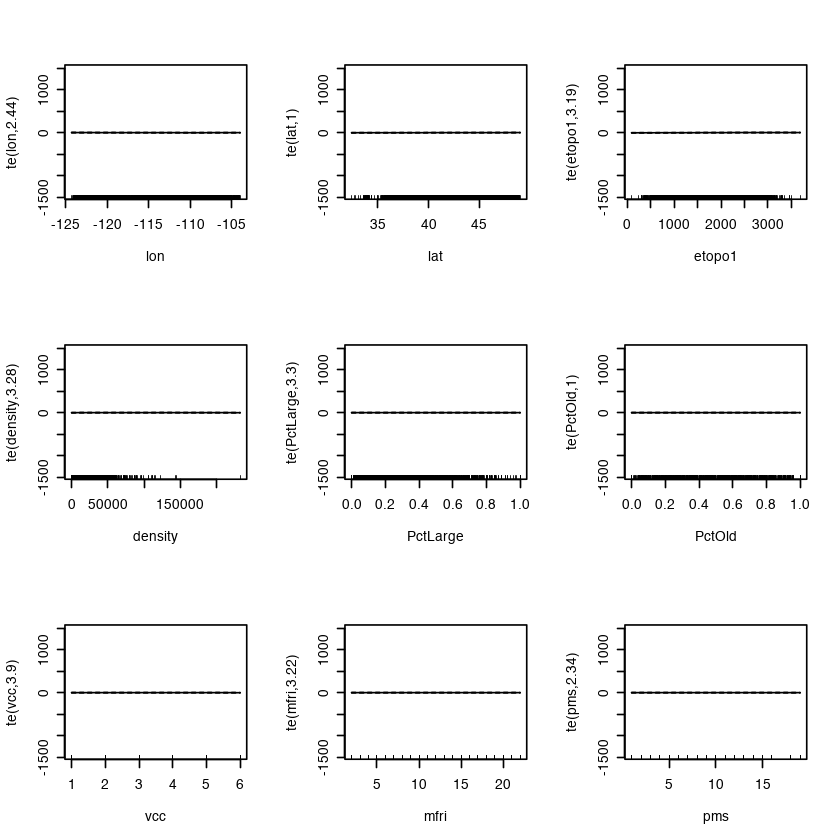

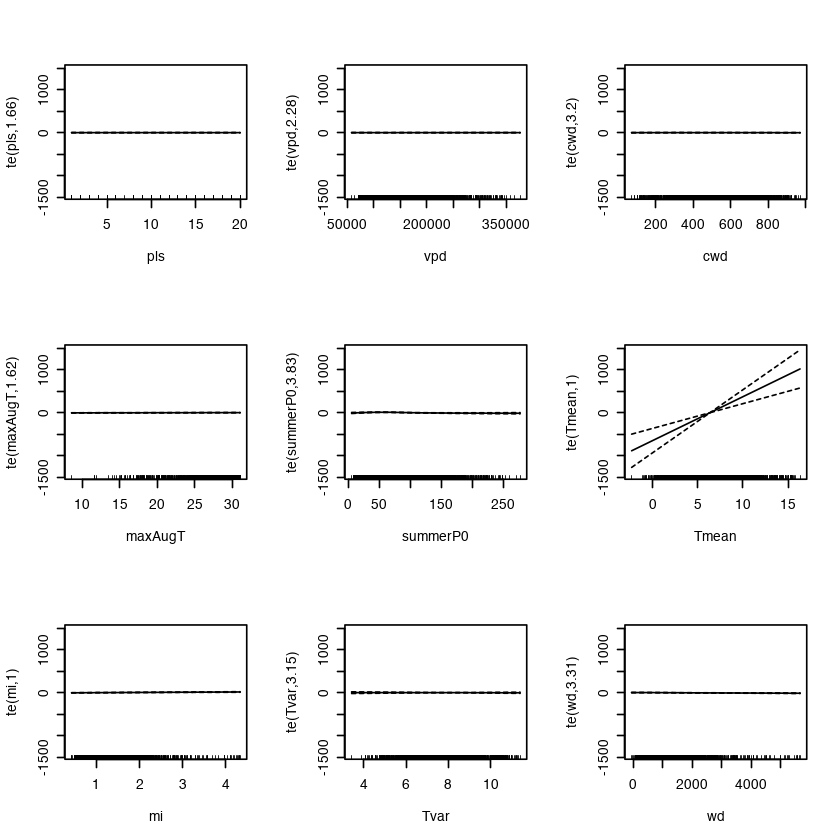

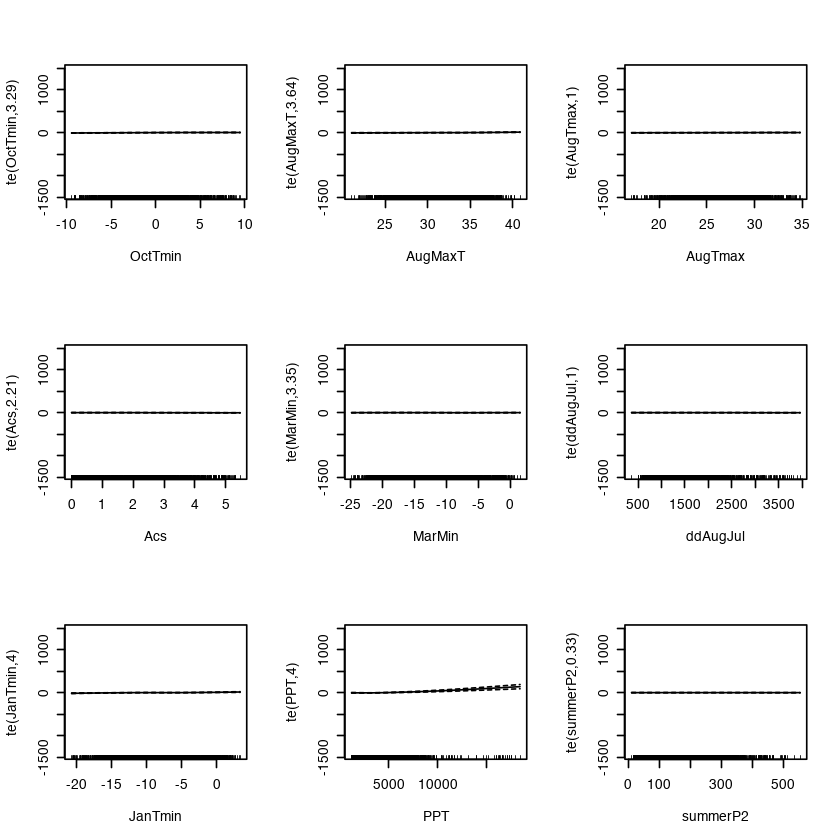

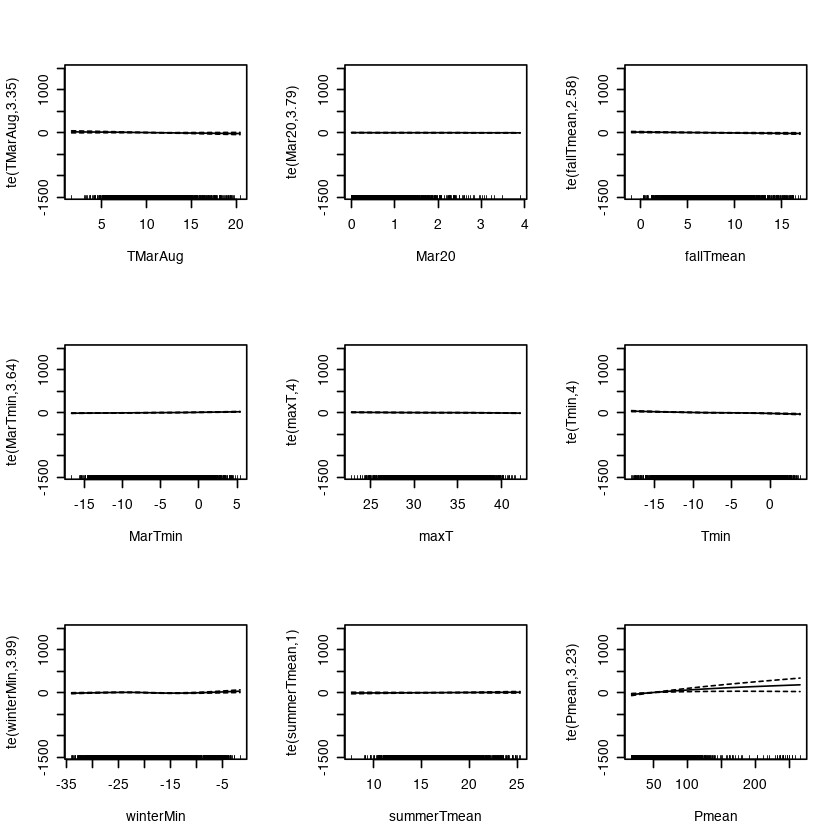

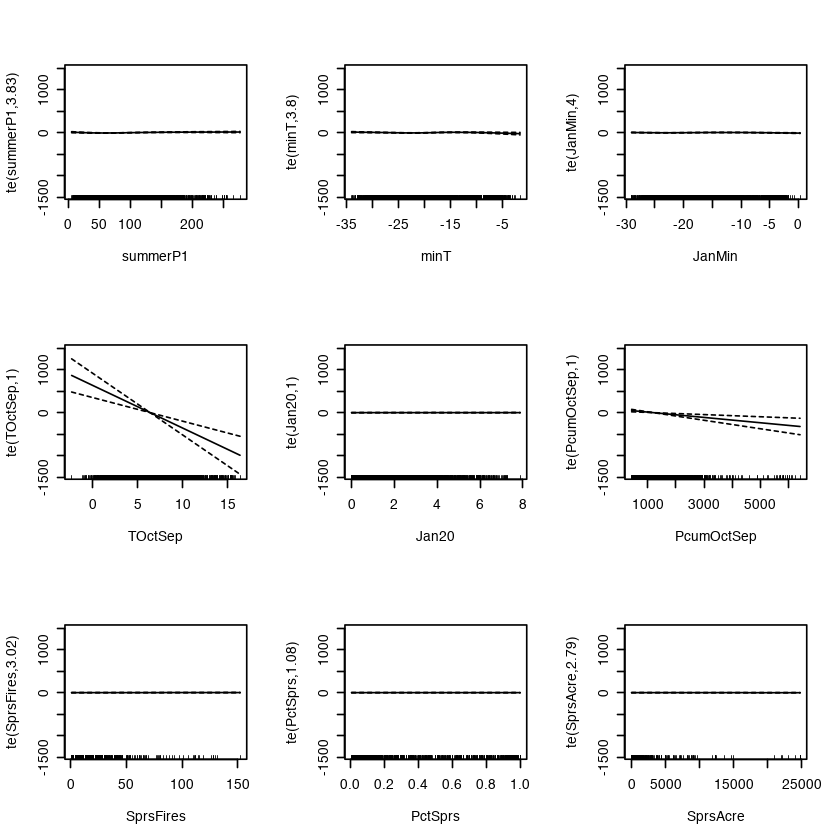

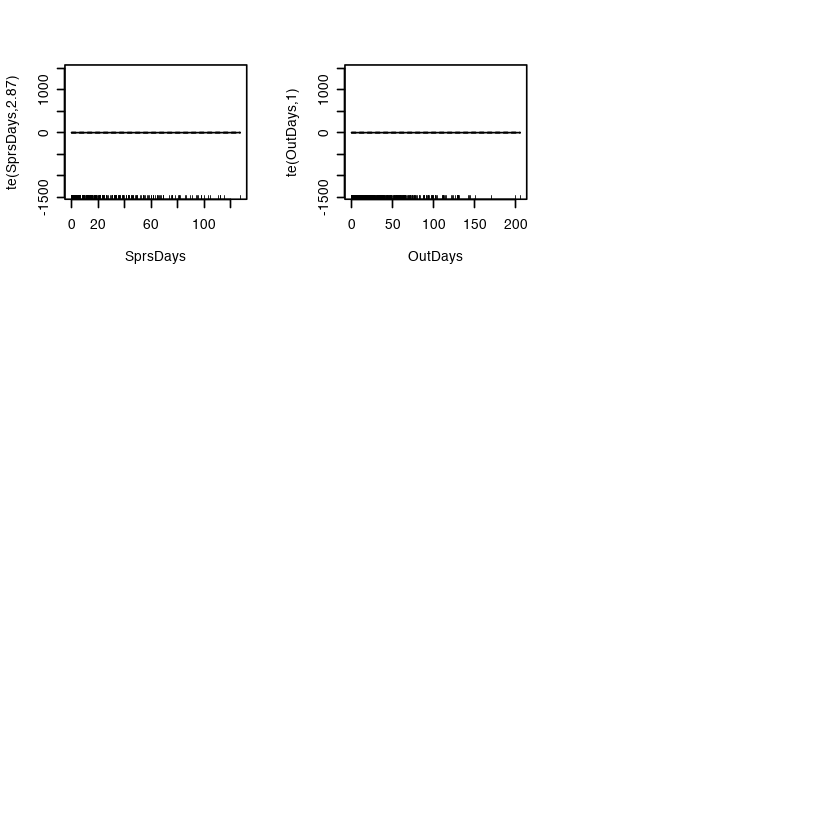

In [47]:
par(mfrow=c(3, 3))
plot(mod)

In [45]:
smoothed <- c(
  'lon', 'lat', 'etopo1', 'density', 'PctLarge', 'PctOld', 'vcc', 'mfri',
  'pms', 'pls', 'vpd', 'cwd', 'maxAugT', 'summerP0', 'Tmean', 'mi', 
  'Tvar', 'wd', 'OctTmin', 'AugMaxT', 'AugTmax', 'Acs', 'MarMin',
  'ddAugJul', 'JanTmin', 'PPT', 'summerP2', 'TMarAug', 'Mar20', 'fallTmean', 
  'MarTmin', 'maxT', 'Tmin', 'winterMin', 'summerTmean', 'Pmean', 'summerP1', 'minT', 
  'JanMin', 'TOctSep', 'Jan20', 'PcumOctSep', 'SprsFires', 'PctSprs', 'SprsAcre', 
  'SprsDays', 'OutDays')

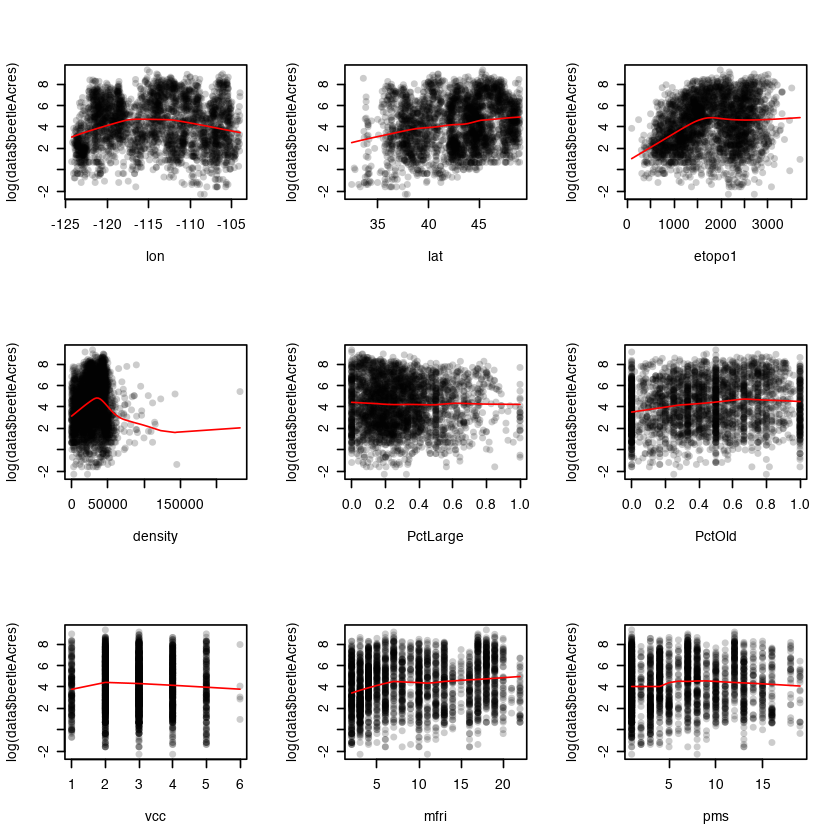

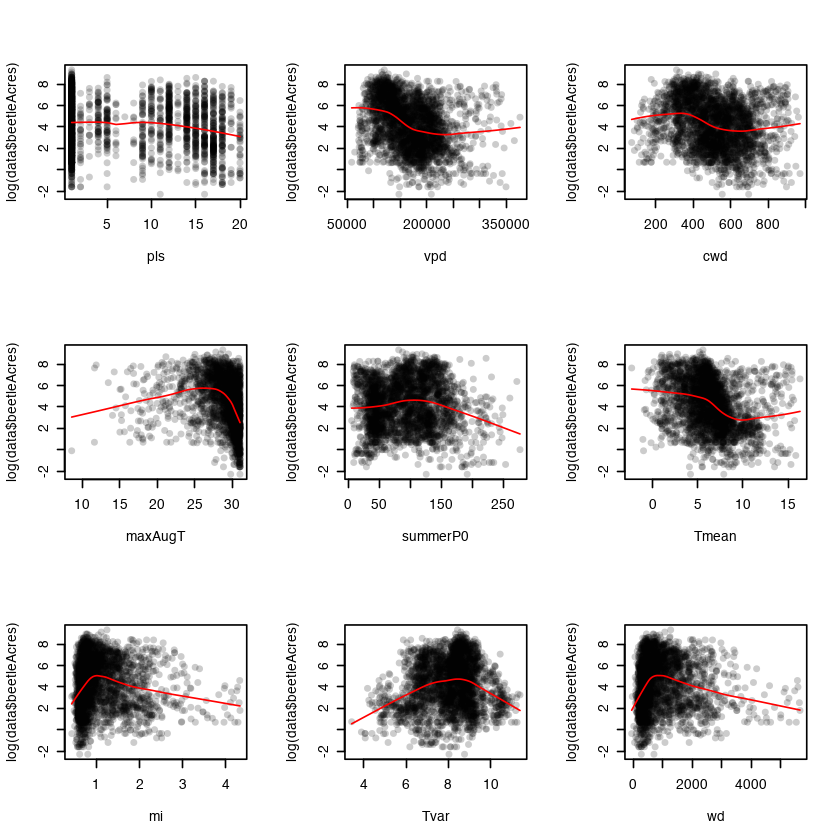

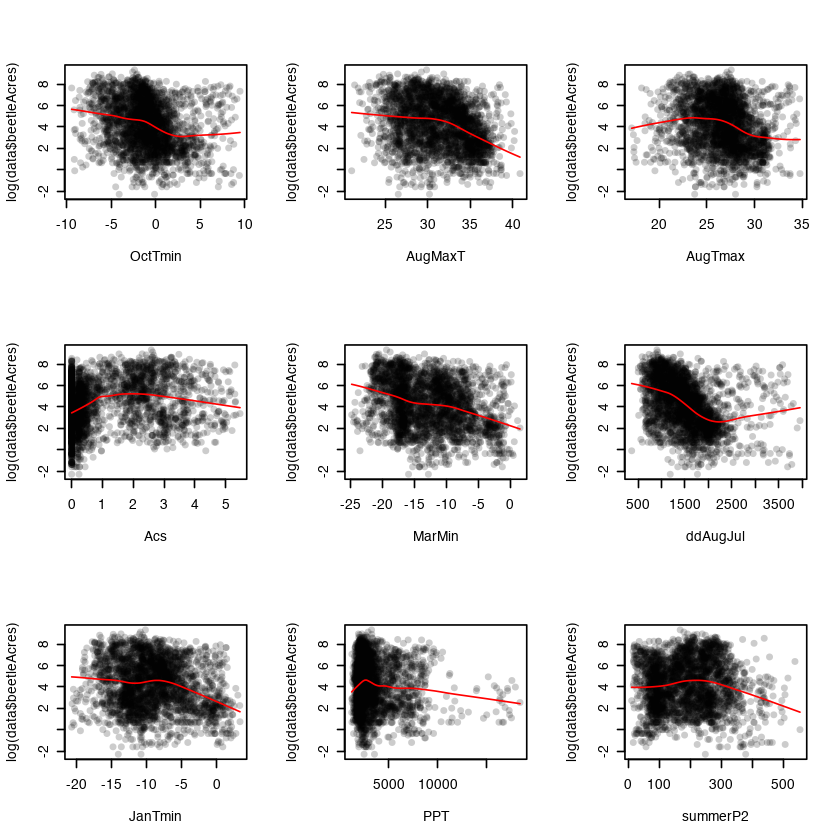

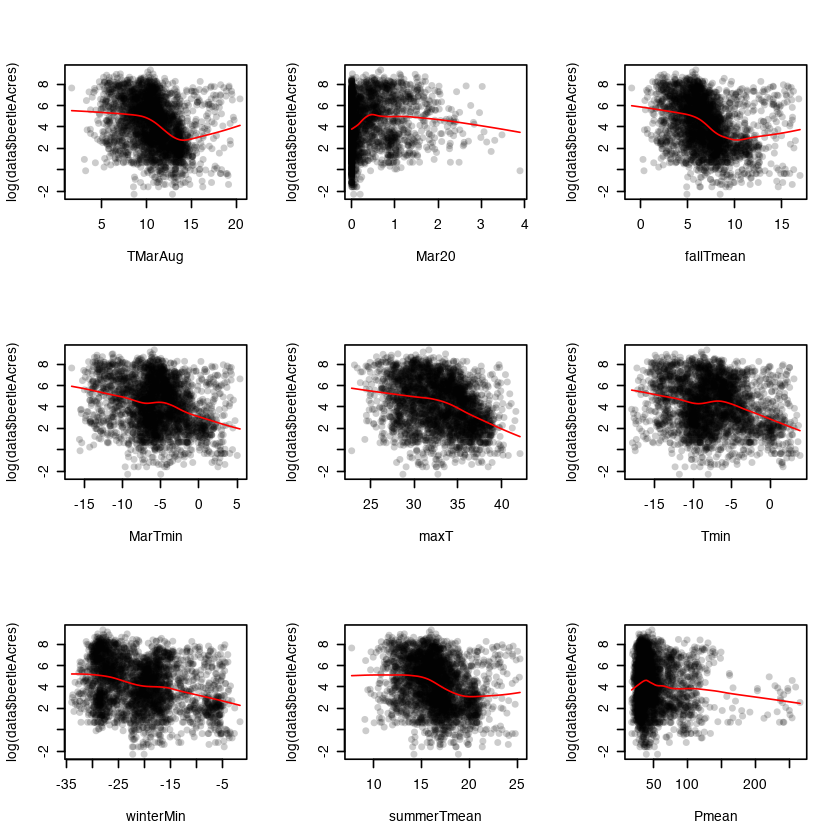

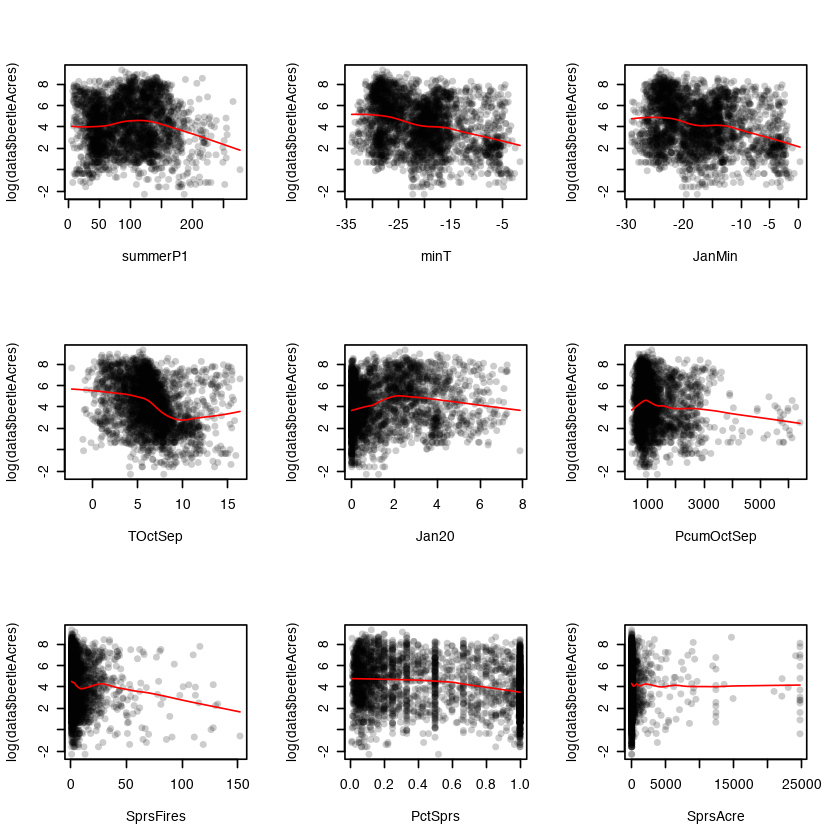

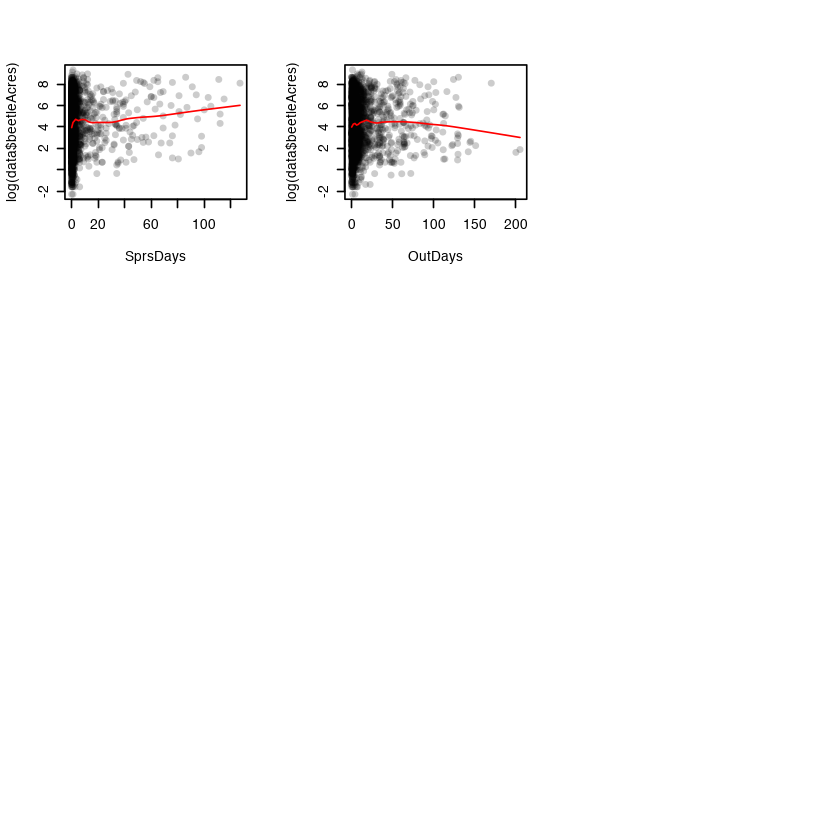

In [46]:
par(mfrow=c(3, 3))
for (field in smoothed) {
  plot(log(data$beetleAcres) ~ data[, field], 
       pch=16, 
       col=rgb(0, 0, 0, 0.2),
       xlab=field)
  lines(lowess(log(data$beetleAcres) ~ data[, field]), col=2)
}

In [54]:
bstar = NULL # Rows of bstar will be bootstrap vectors of regression coefficients.
n = dim(data)[1] 
B = 1000
ptm <- proc.time()
for(draw in 1:B){
  # Randomly sample from the rows, with replacement
  Dstar = data[sample(1:n,size=n,replace=T),]
  model <- lm(
    log(beetleAcres) ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) #+ mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) #+ prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax # + AugTmean + I(AugTmean^2)
    + Acs + I(Acs^2) + MarMin + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) # + ddAugJun + I(ddAugJun^2)
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,
    data=Dstar)
  bstar = rbind( bstar,coef(model) )
  # print(draw)
} # Next draw
proc.time() - ptm

   user  system elapsed 
 54.672   2.663  63.773 

In [55]:
bstar <- as.data.frame(bstar)

In [56]:
head(bstar)

(Intercept),lon,I(lon^2),lat,I(lat^2),etopo1,I(etopo1^2),density,I(density^2),PctLarge,⋯,exp(TOctSep),Jan20,I(Jan20^2),PcumOctSep,I(PcumOctSep^2),SprsFires,PctSprs,SprsAcre,SprsDays,OutDays
56.55133,1.7975215,0.008614637,0.6707289,-0.01095277,0.002360429,-2.417535e-07,3.890536e-05,-2.171880e-10,-0.20253109,⋯,-0.0001856702,-0.04737827,0.09806205,-0.20808331,4.123239e-05,0.02147340,-0.5602743,-3.372776e-05,-4.693504e-04,0.001982330
128.66830,3.1145253,0.014157620,1.2308356,-0.01502537,0.003029733,-3.330303e-07,4.521443e-05,-2.955995e-10,-0.08690418,⋯,-0.0001509857,-0.21180220,0.07923738,-0.18153771,4.092870e-05,0.02296317,-0.6296155,-2.686611e-05,5.000879e-03,0.001575552
-64.36918,0.5566498,0.002961626,3.3453785,-0.04141386,0.001878200,-1.814688e-08,3.213002e-05,-9.581207e-11,-0.39886772,⋯,-0.0001790305,-0.39492750,0.11440910,-0.16877107,3.850853e-05,0.02314970,-0.5293277,-4.068187e-05,2.141415e-03,0.003087364
43.99474,1.8636021,0.008915687,1.8653282,-0.02359766,0.001881612,-6.730385e-10,4.787836e-05,-3.681277e-10,0.13446170,⋯,-0.0001260940,-1.12294243,0.19502097,-0.15372001,3.393794e-05,0.01596780,-0.5935721,-3.308715e-05,4.506085e-03,0.002132399
88.09149,2.6861315,0.012496889,1.4374798,-0.02239382,0.002021227,-1.624514e-07,3.370525e-05,-1.598396e-10,-0.09976044,⋯,-0.0002094429,-0.63893525,0.13241543,-0.09821438,1.918095e-05,0.01709645,-0.7960253,-1.677984e-05,-4.597257e-06,0.001907542
56.45053,2.1727845,0.010324905,1.8749264,-0.02447736,0.001708771,5.322680e-08,4.145580e-05,-2.464304e-10,-0.13860591,⋯,-0.0003081155,-0.36232156,0.08182867,-0.19843676,3.919458e-05,0.01779267,-0.6093740,-5.097097e-05,4.062670e-03,0.001923503


In [57]:
dim(bstar)
names(bstar)

[1] 1000   82

[1] "(Intercept)"     "lon"             "I(lon^2)"        "lat"            
 [5] "I(lat^2)"        "etopo1"          "I(etopo1^2)"     "density"        
 [9] "I(density^2)"    "PctLarge"        "PctOld"          "vcc"            
[13] "log(vcc)"        "mfri"            "log(mfri)"       "pms"            
[17] "pls"             "GAP1"            "GAP2"            "GAP3"           
[21] "vpd"             "I(vpd^2)"        "cwd"             "I(cwd^2)"       
[25] "maxAugT"         "I(maxAugT^2)"    "I(summerP0^2)"   "summerP0"       
[29] "Tmean"           "I(Tmean^2)"      "exp(Tmean)"      "mi"             
[33] "I(mi^2)"         "Tvar"            "I(Tvar^2)"       "wd"             
[37] "I(wd^2)"         "OctTmin"         "I(OctTmin^2)"    "AugMaxT"        
[41] "I(AugMaxT^2)"    "AugTmax"         "Acs"             "I(Acs^2)"       
[45] "MarMin"          "ddAugJul"        "I(ddAugJul^2)"   "JanTmin"        
[49] "PPT"             "I(PPT^2)"        "summerP2"        "I(summerP2^2)"  
[53] "TMarAug"         "exp(TMarAug)"    "Mar20"           "log(Mar20 + 1)" 
[57] "fallTmean"       "exp(fallTmean)"  "MarTmin"         "maxT"           
[61] "I(maxT^2)"       "Tmin"            "winterMin"       "summerTmean"    
[65] "Pmean"           "I(Pmean^2)"      "summerP1"        "I(summerP1^2)"  
[69] "minT"            "JanMin"          "I(JanMin^2)"     "TOctSep"        
[73] "exp(TOctSep)"    "Jan20"           "I(Jan20^2)"      "PcumOctSep"     
[77] "I(PcumOctSep^2)" "SprsFires"       "PctSprs"         "SprsAcre"       
[81] "SprsDays"        "OutDays"

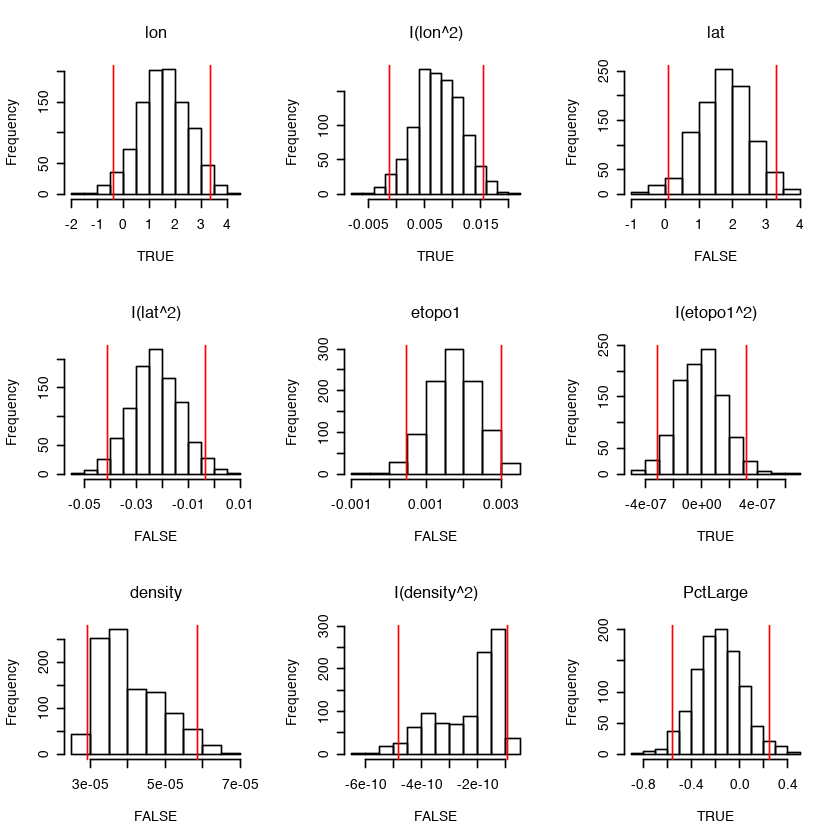

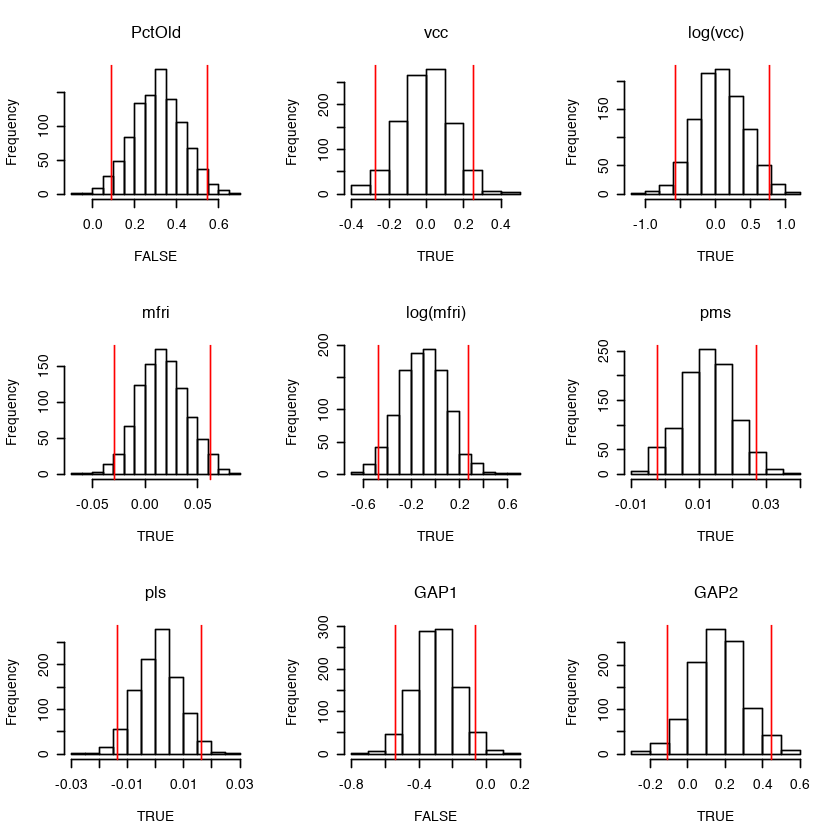

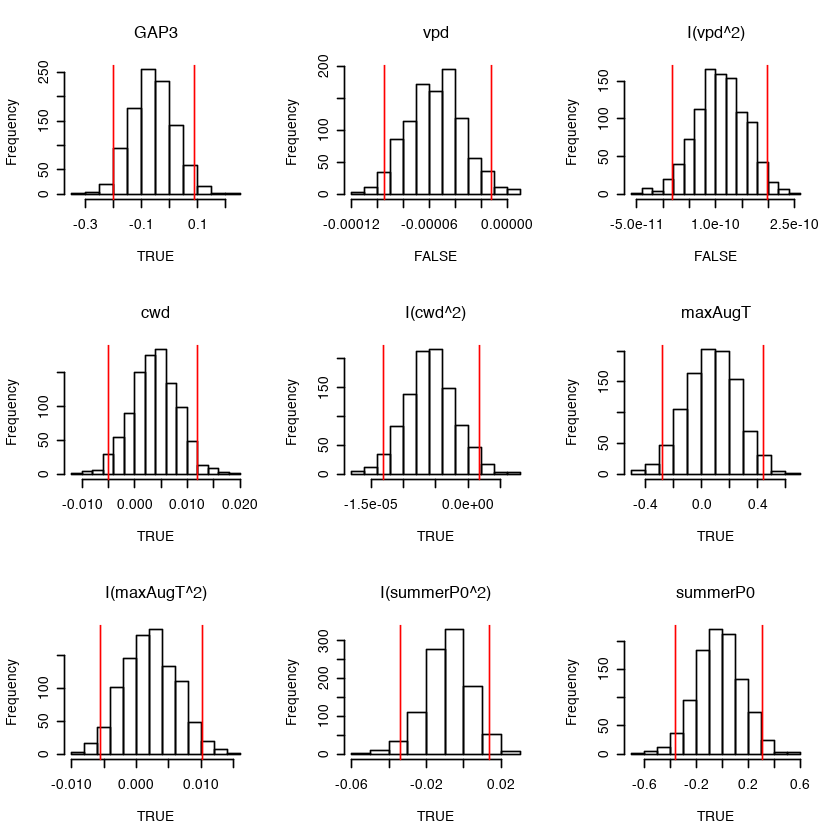

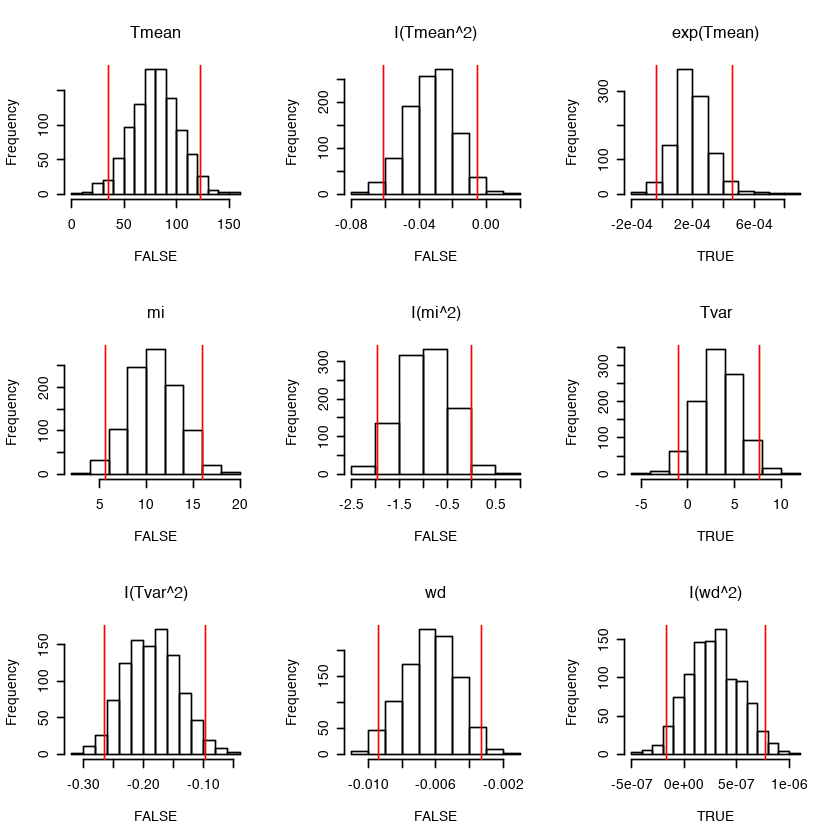

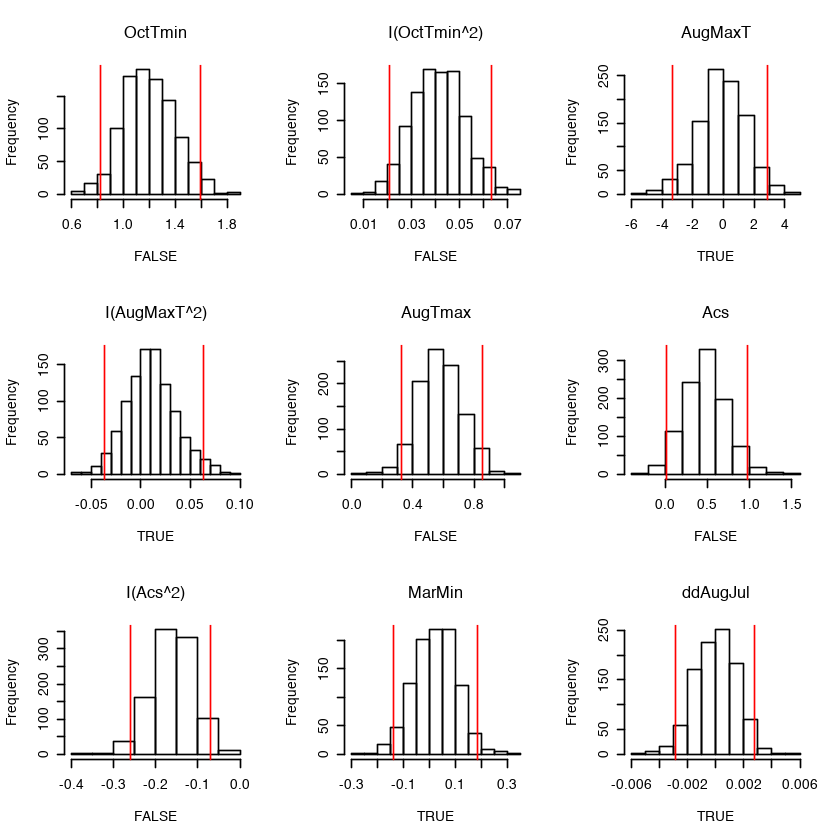

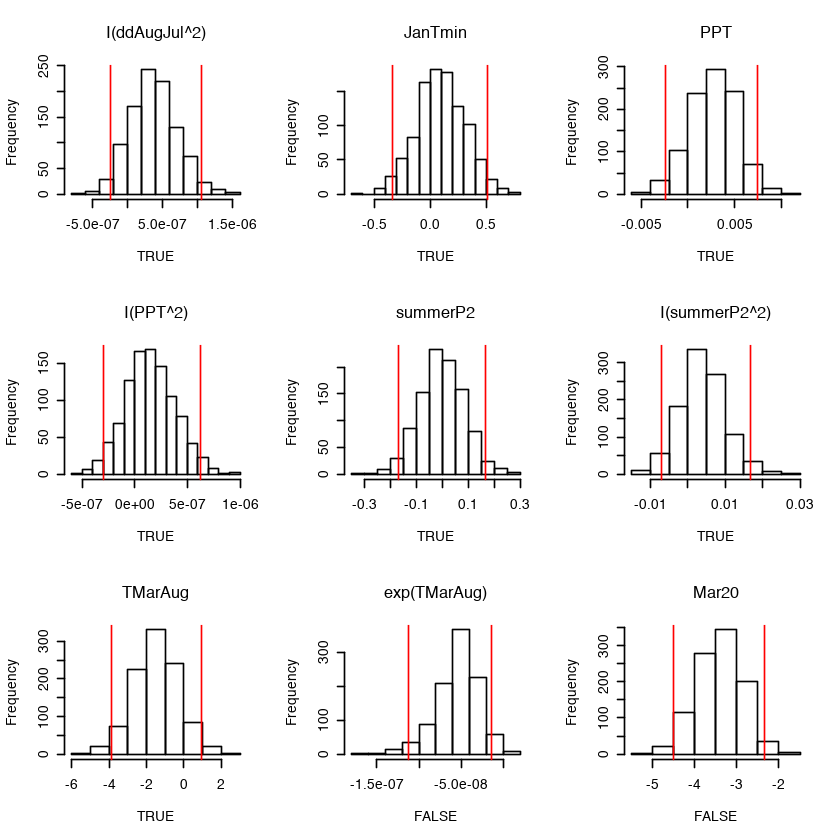

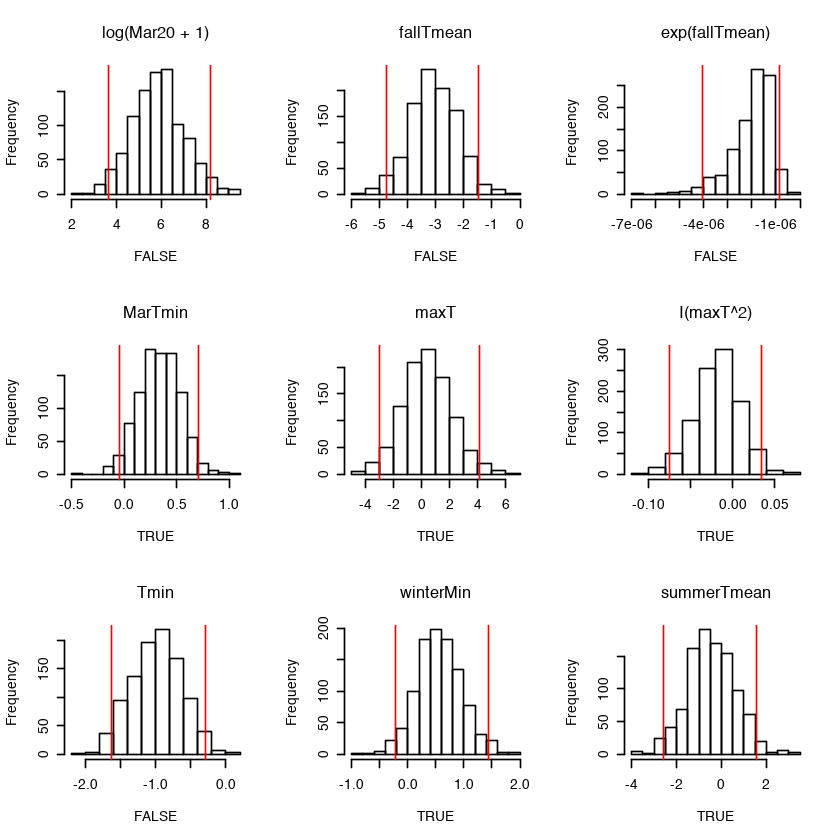

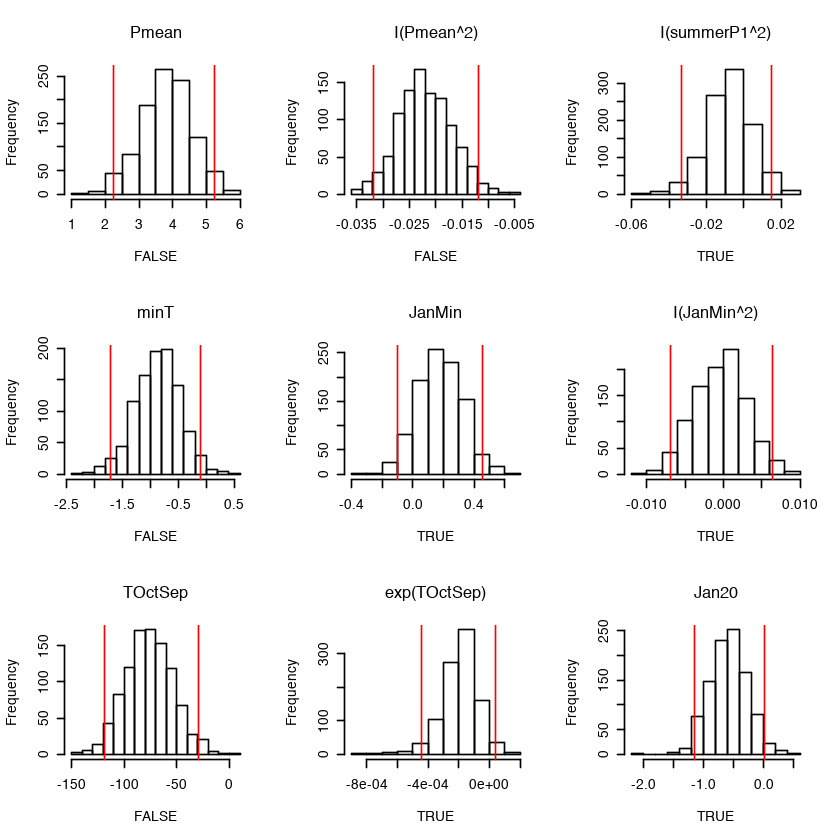

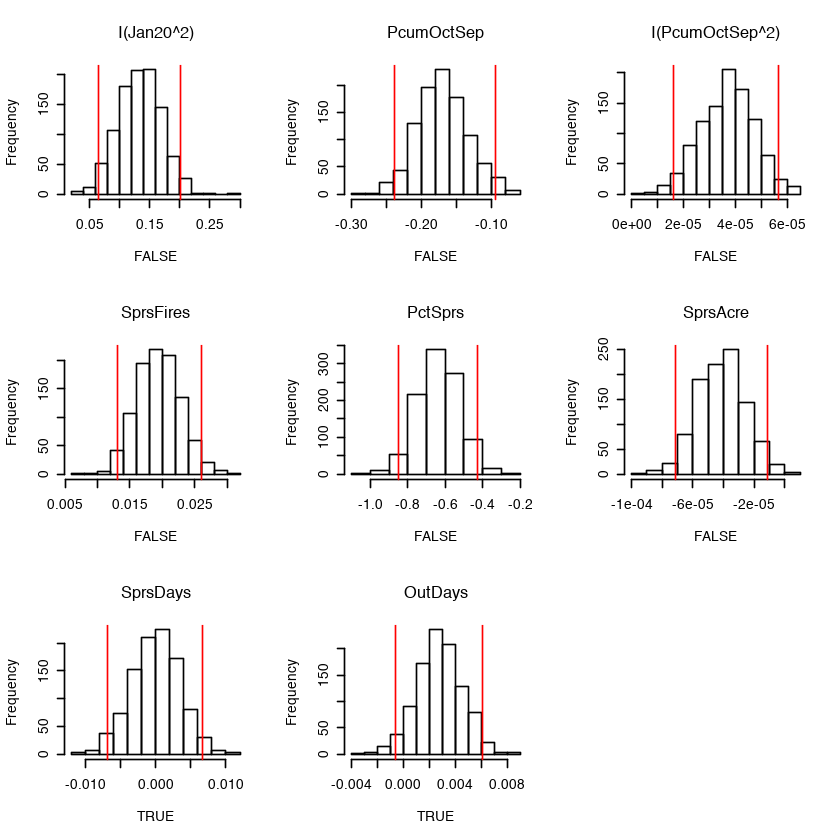

In [58]:
par(mfrow=c(3, 3))
removable <- c()
for (field in names(bstar)) {
    if(!(field %in% c('(Intercept)', 'summerP1'))){
        qs <- quantile(bstar[,field], prob=c(0.025, 0.975))
        remove <- 0 >= qs[1] & 0 <= qs[2]
        hist(bstar[,field], main=field, xlab=remove)
        abline(v=qs,col="red")
        if(remove){removable <- c(removable, field)}
    }
}

In [59]:
removable

[1] "lon"           "I(lon^2)"      "I(etopo1^2)"   "PctLarge"     
 [5] "vcc"           "log(vcc)"      "mfri"          "log(mfri)"    
 [9] "pms"           "pls"           "GAP2"          "GAP3"         
[13] "cwd"           "I(cwd^2)"      "maxAugT"       "I(maxAugT^2)" 
[17] "I(summerP0^2)" "summerP0"      "exp(Tmean)"    "Tvar"         
[21] "I(wd^2)"       "AugMaxT"       "I(AugMaxT^2)"  "MarMin"       
[25] "ddAugJul"      "I(ddAugJul^2)" "JanTmin"       "PPT"          
[29] "I(PPT^2)"      "summerP2"      "I(summerP2^2)" "TMarAug"      
[33] "MarTmin"       "maxT"          "I(maxT^2)"     "winterMin"    
[37] "summerTmean"   "I(summerP1^2)" "JanMin"        "I(JanMin^2)"  
[41] "exp(TOctSep)"  "Jan20"         "SprsDays"      "OutDays"

In [60]:
mod <- lm(
    log(beetleAcres) ~ lat + I(lat^2) + etopo1
    + density + I(density^2) + PctOld 
    + GAP1 + vpd + I(vpd^2) 
    + Tmean + I(Tmean^2) + mi + I(mi^2) + I(Tvar^2) 
    + wd + I(wd^2) + OctTmin + I(OctTmin^2) + AugTmax 
    + Acs + I(Acs^2) 
    + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + Tmin + Pmean + I(Pmean^2) + summerP1
    + minT + TOctSep + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre,
    data=data)

In [61]:
summary(mod)


Call:
lm(formula = log(beetleAcres) ~ lat + I(lat^2) + etopo1 + density + 
    I(density^2) + PctOld + GAP1 + vpd + I(vpd^2) + Tmean + I(Tmean^2) + 
    mi + I(mi^2) + I(Tvar^2) + wd + I(wd^2) + OctTmin + I(OctTmin^2) + 
    AugTmax + Acs + I(Acs^2) + exp(TMarAug) + Mar20 + log(Mar20 + 
    1) + fallTmean + exp(fallTmean) + Tmin + Pmean + I(Pmean^2) + 
    summerP1 + minT + TOctSep + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + 
    SprsFires + PctSprs + SprsAcre, data = data)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9236 -1.0888  0.0561  1.1693  7.9830 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -4.827e+01  8.376e+00  -5.762 9.20e-09 ***
lat              1.966e+00  3.783e-01   5.196 2.18e-07 ***
I(lat^2)        -2.255e-02  4.572e-03  -4.932 8.64e-07 ***
etopo1           1.764e-03  2.147e-04   8.217 3.17e-16 ***
density          3.589e-05  3.821e-06   9.393  < 2e-16 ***
I(density^2)    -1.795e-10  3.618e-11  -4.962 7.39e-07 

In [62]:
mod.r <- step(mod, trace=0)

In [63]:
summary(mod.r)


Call:
lm(formula = log(beetleAcres) ~ lat + I(lat^2) + etopo1 + density + 
    I(density^2) + PctOld + GAP1 + vpd + I(vpd^2) + Tmean + I(Tmean^2) + 
    mi + I(mi^2) + I(Tvar^2) + wd + I(wd^2) + OctTmin + I(OctTmin^2) + 
    AugTmax + I(Acs^2) + exp(TMarAug) + Mar20 + log(Mar20 + 1) + 
    fallTmean + exp(fallTmean) + Tmin + Pmean + I(Pmean^2) + 
    summerP1 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + SprsFires + 
    PctSprs + SprsAcre, data = data)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9623 -1.0797  0.0557  1.1688  7.9863 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -4.764e+01  8.341e+00  -5.712 1.24e-08 ***
lat              1.939e+00  3.769e-01   5.144 2.88e-07 ***
I(lat^2)        -2.228e-02  4.563e-03  -4.884 1.10e-06 ***
etopo1           1.778e-03  2.076e-04   8.563  < 2e-16 ***
density          3.536e-05  3.797e-06   9.311  < 2e-16 ***
I(density^2)    -1.773e-10  3.606e-11  -4.917 9.29e-07 ***
PctOld           2.

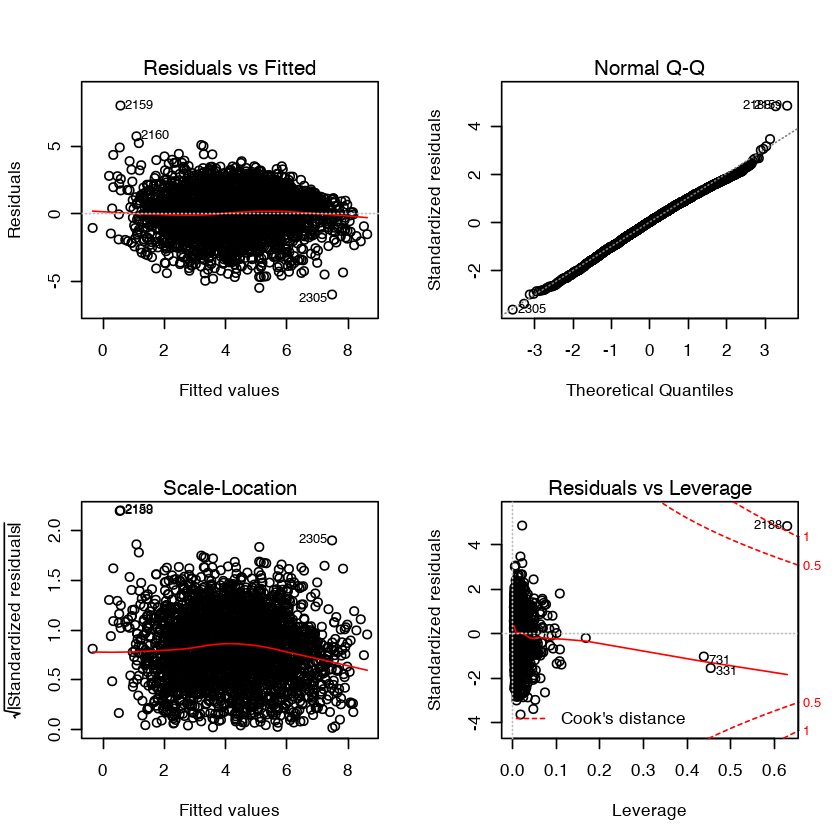

In [64]:
par(mfrow=c(2, 2))
plot(mod.r)

In [65]:
mod2 <- update(mod, . ~ ., data=data[-2188, ])
mod2.r <- step(mod2, trace=0)

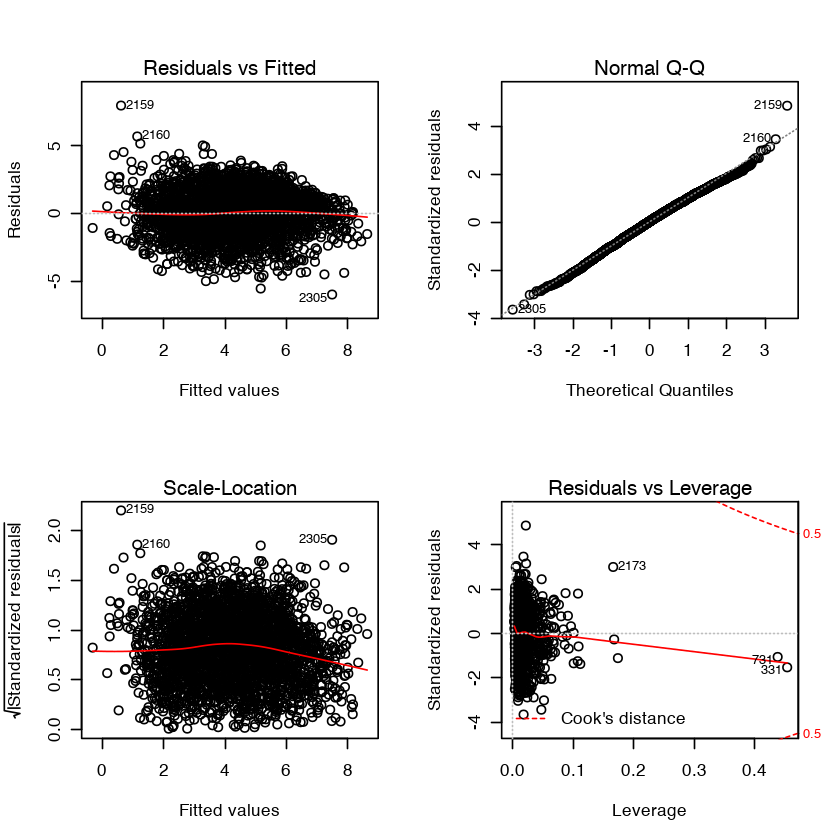

In [66]:
par(mfrow=c(2, 2))
plot(mod2.r)

In [67]:
summary(mod2.r)


Call:
lm(formula = log(beetleAcres) ~ lat + I(lat^2) + etopo1 + density + 
    I(density^2) + PctOld + GAP1 + vpd + I(vpd^2) + Tmean + I(Tmean^2) + 
    mi + I(mi^2) + I(Tvar^2) + wd + I(wd^2) + OctTmin + I(OctTmin^2) + 
    AugTmax + I(Acs^2) + exp(TMarAug) + Mar20 + log(Mar20 + 1) + 
    fallTmean + exp(fallTmean) + Tmin + Pmean + I(Pmean^2) + 
    summerP1 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + SprsFires + 
    PctSprs + SprsAcre, data = data[-2188, ])

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9721 -1.0732  0.0608  1.1694  7.9447 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -4.771e+01  8.307e+00  -5.743 1.03e-08 ***
lat              1.950e+00  3.754e-01   5.194 2.20e-07 ***
I(lat^2)        -2.249e-02  4.544e-03  -4.949 7.91e-07 ***
etopo1           1.771e-03  2.068e-04   8.562  < 2e-16 ***
density          4.949e-05  4.771e-06  10.373  < 2e-16 ***
I(density^2)    -3.890e-10  5.647e-11  -6.890 6.89e-12 ***
PctOld    

In [3]:
mod <- lm(
    log(beetleAcres) ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) + mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) + prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax 
    + Acs + I(Acs^2) + MarMin + ddAugJun + I(ddAugJun^2) + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) 
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,
    data=data)

In [4]:
mod.r <- step(mod, trace=0)

In [5]:
summary(mod.r)


Call:
lm(formula = log(beetleAcres) ~ I(lon^2) + lat + I(lat^2) + etopo1 + 
    mStdAge + I(mStdAge^2) + density + I(density^2) + PctOld + 
    prs + I(prs^2) + GAP1 + vpd + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + 
    I(summerP0^2) + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + 
    Tvar + I(Tvar^2) + wd + I(wd^2) + AugTmean + I(AugTmean^2) + 
    OctTmin + I(OctTmin^2) + I(AugMaxT^2) + AugTmax + I(Acs^2) + 
    I(ddAugJul^2) + PPT + summerP2 + I(summerP2^2) + TMarAug + 
    exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean) + 
    MarTmin + I(maxT^2) + Tmin + Pmean + I(Pmean^2) + minT + 
    JanMin + TOctSep + exp(TOctSep) + I(Jan20^2) + PcumOctSep + 
    I(PcumOctSep^2) + SprsFires + PctSprs + SprsAcre + OutDays, 
    data = data)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.5235 -0.9997  0.1086  1.1022  8.1463 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -6.123e+01  1.054e+01  -5.811 6.94e-09 ***
I(lon^2)   

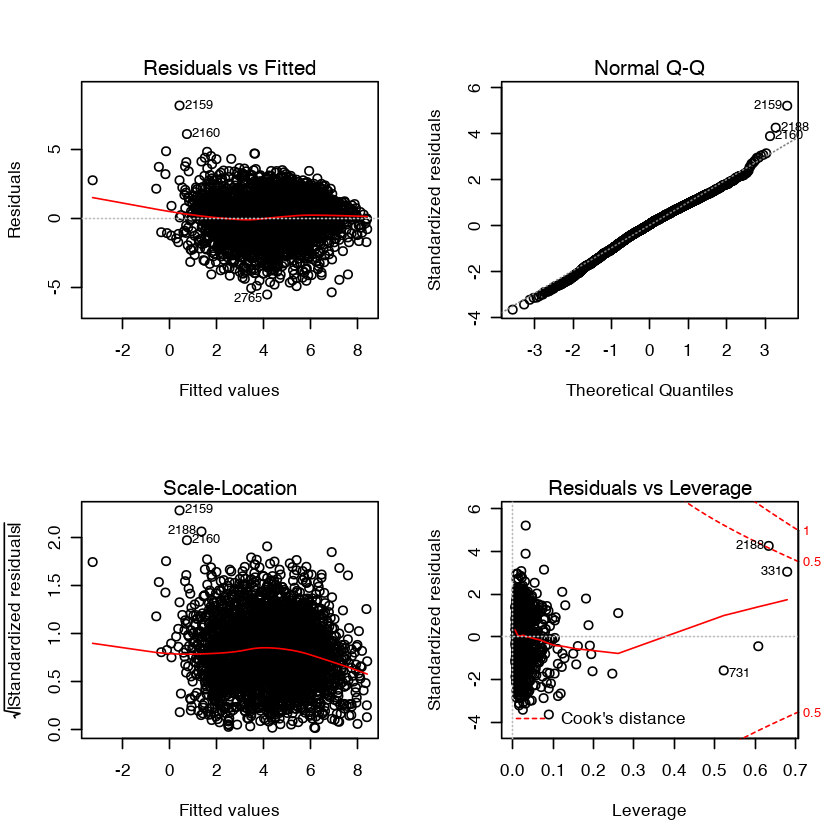

In [6]:
par(mfrow=c(2, 2))
plot(mod.r)

In [7]:
data[2188, ]

,lon,lat,etopo1,beetleAcres,host,forest,mStdAge,density,PctLarge,PctOld,⋯,minT,JanMin,TOctSep,Jan20,PcumOctSep,SprsFires,PctSprs,SprsAcre,SprsDays,OutDays
2188,-108.4801,47.99143,1141.424,230.2056,1,1,51,232346.7,0.08679834,0.2384615,⋯,-29.75507,-26.47876,5.810339,5.996357,765.0241,11,0.9166667,0.4636364,0,1


In [8]:
mod2 <- update(mod, . ~ ., data=data[-2188, ])
mod2.r <- step(mod2, trace=0)

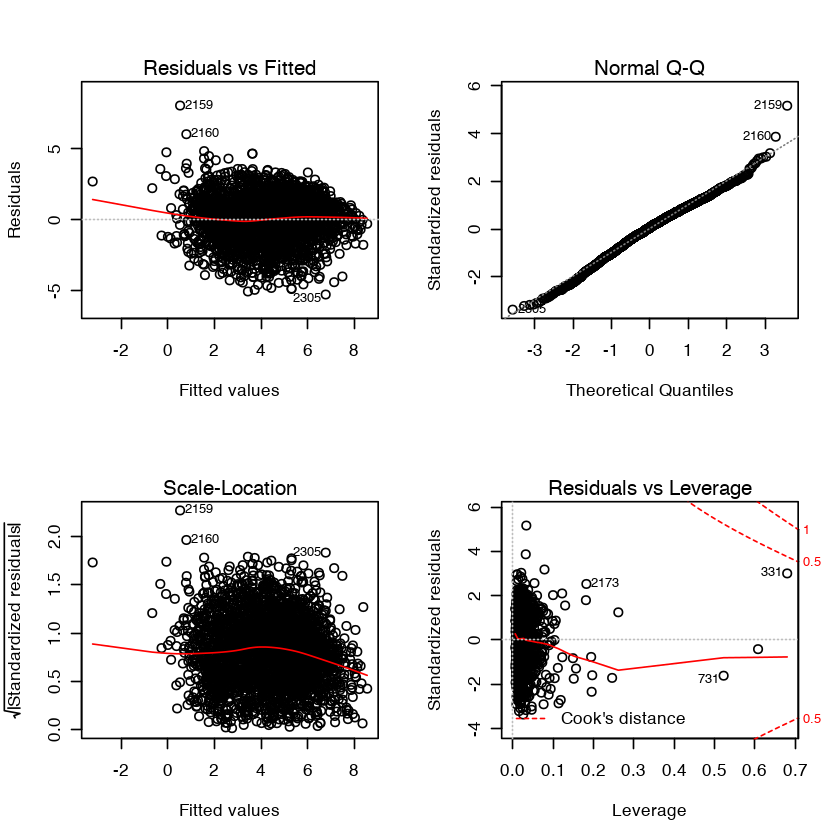

In [9]:
par(mfrow=c(2, 2))
plot(mod2.r)

In [10]:
data <- data[-2188, ]

In [69]:
data$preds <- mod2.r$fitted

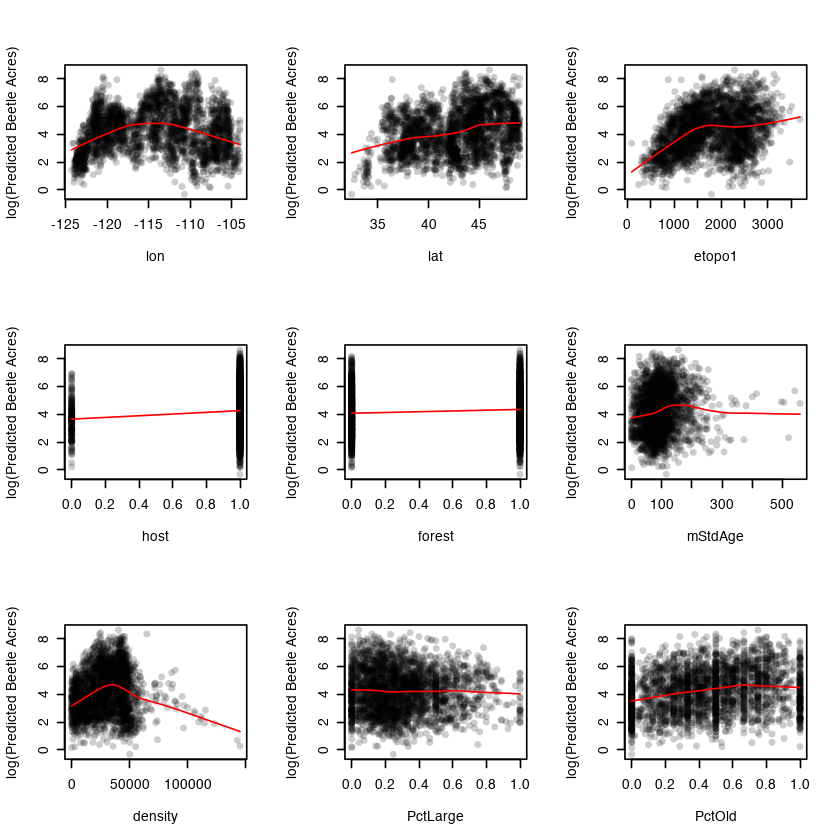

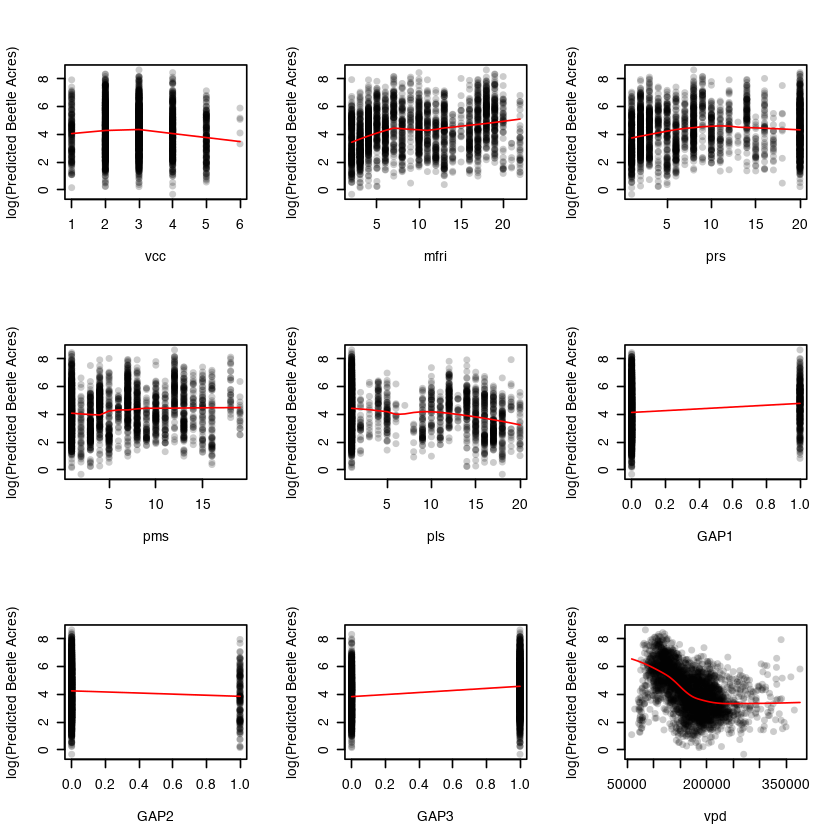

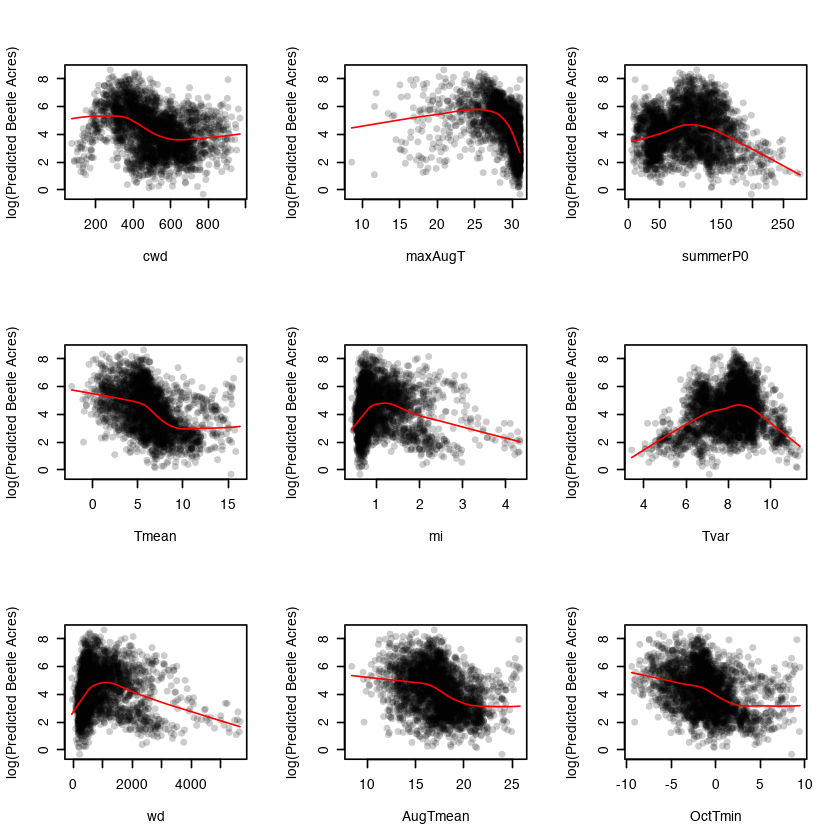

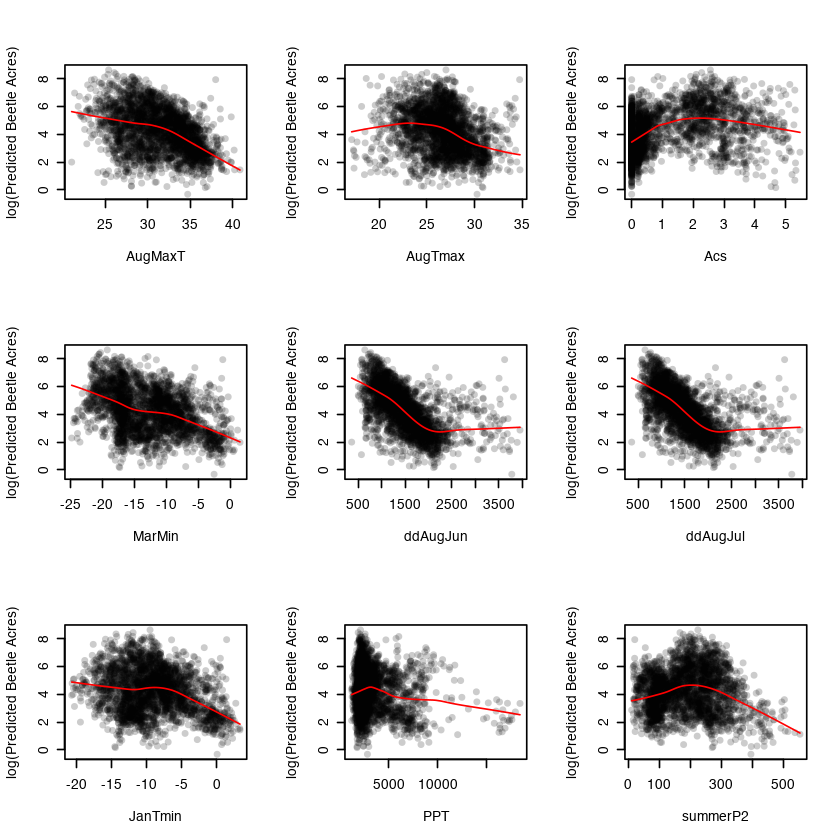

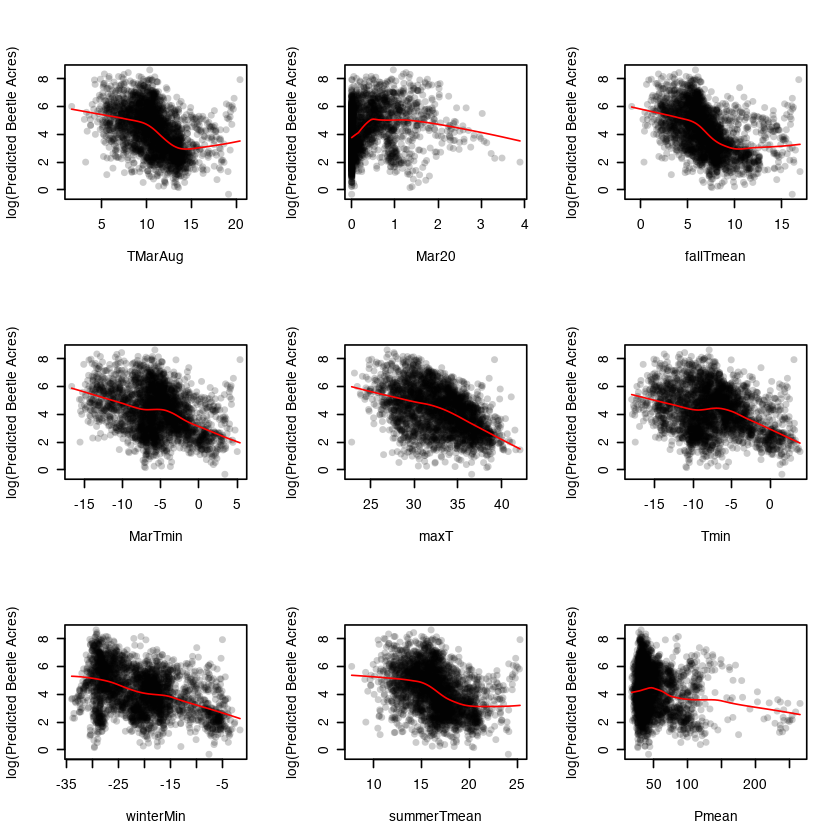

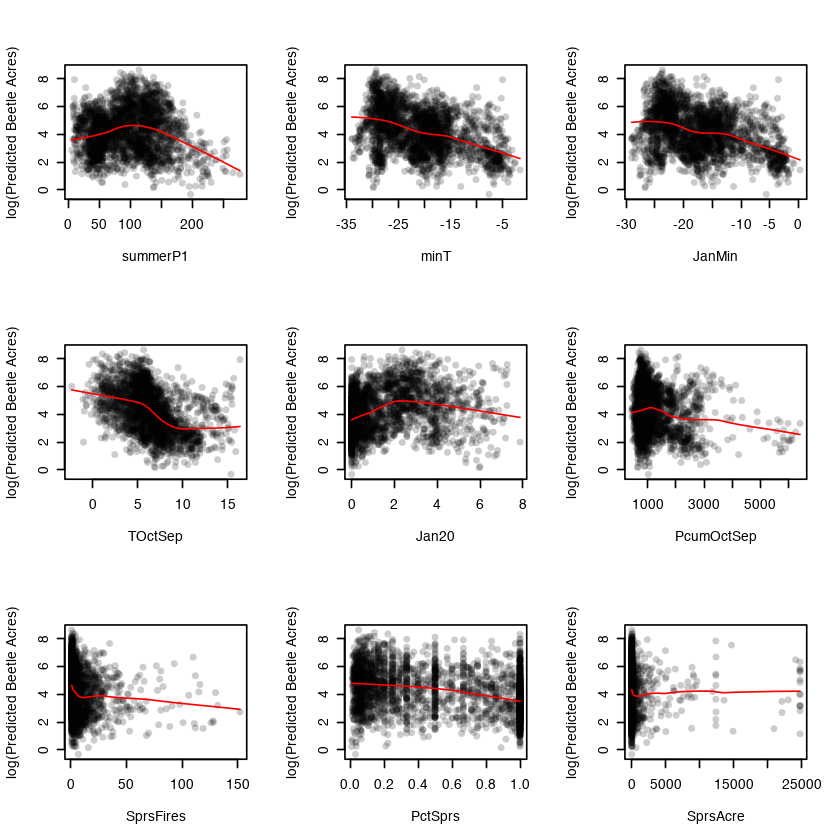

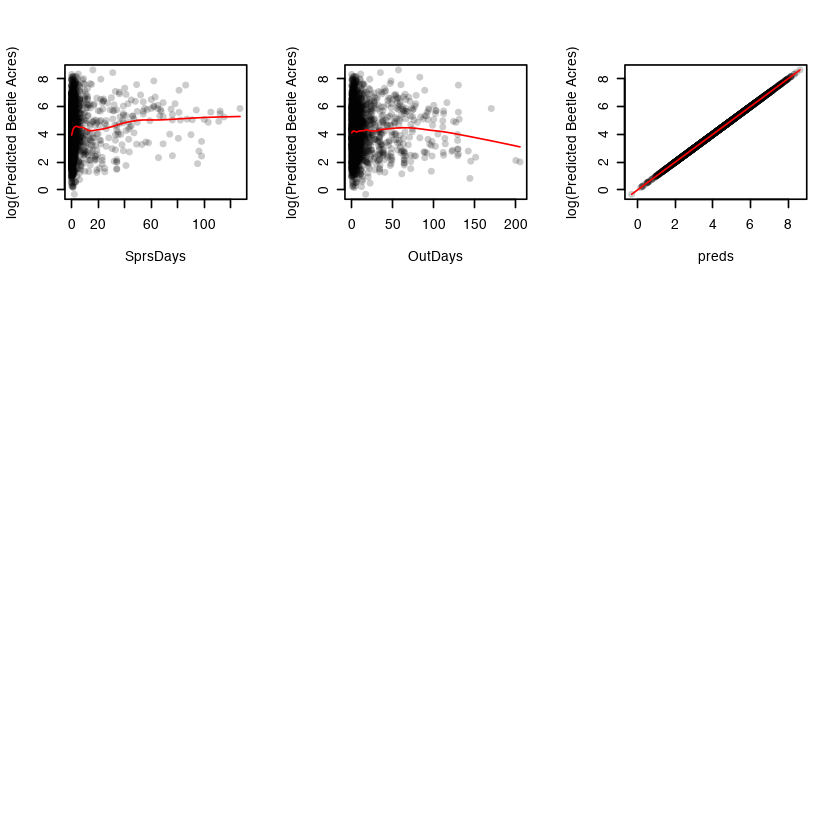

In [70]:
par(mfrow=c(3, 3))
for (field in names(data)) {
  if (field != 'beetleAcres') {
    plot(data$preds ~ data[, field], 
         pch=16, 
         col=rgb(0, 0, 0, 0.2), 
         xlab=field,
         ylab='log(Predicted Beetle Acres)')
    lines(lowess(data$preds ~ data[, field]), col=2)
  }
}

In [71]:
med.df <- data.frame(t(apply(data, 2, median)))
n.steps <- 100
med.df <- med.df[rep(1, n.steps), ]

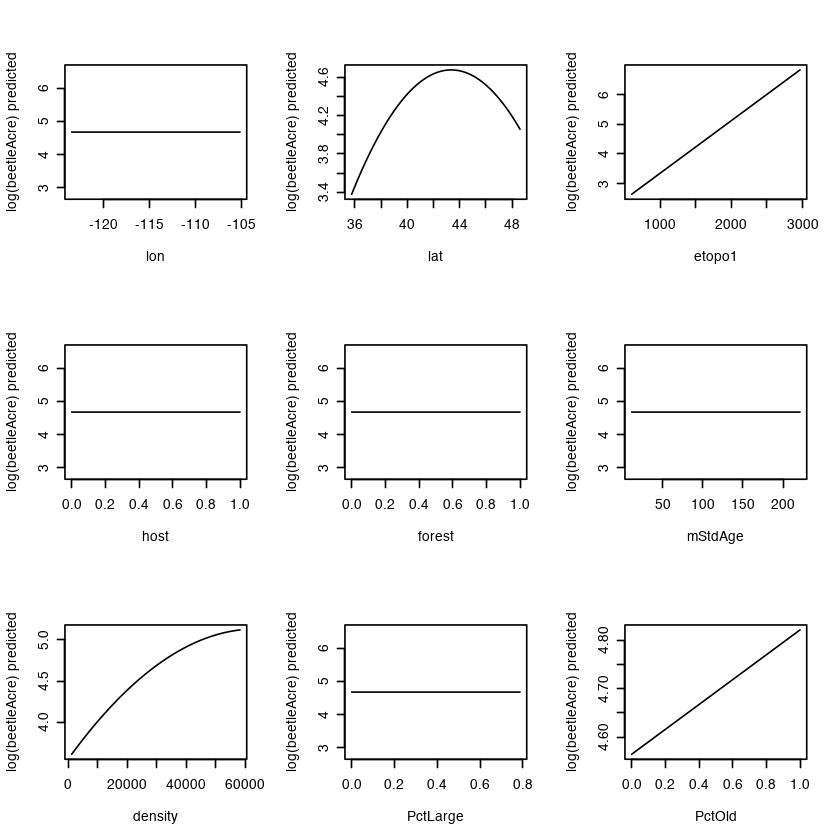

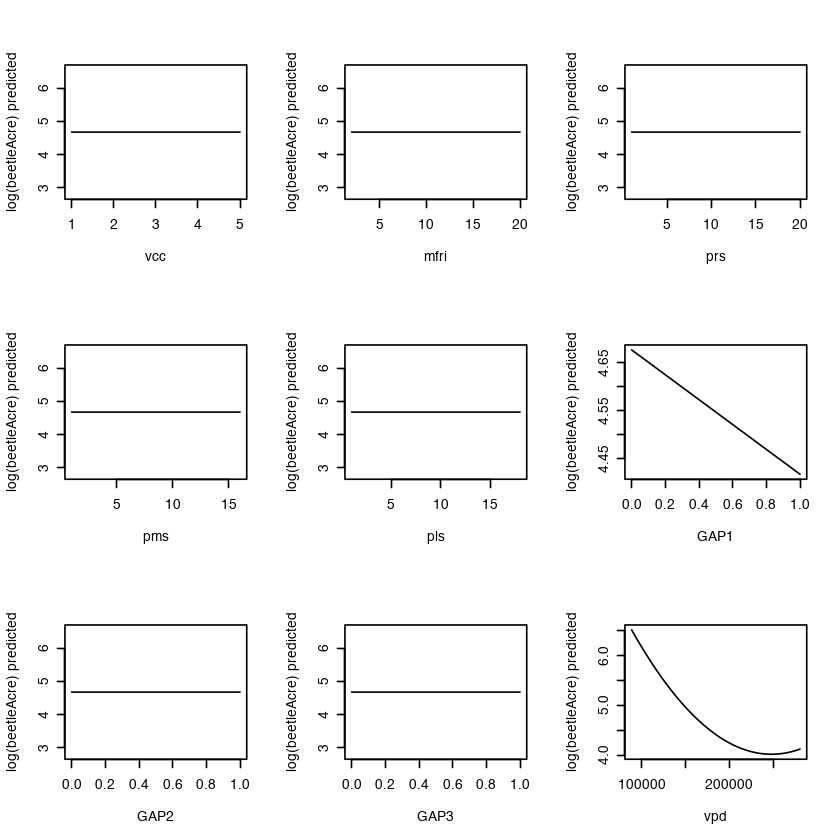

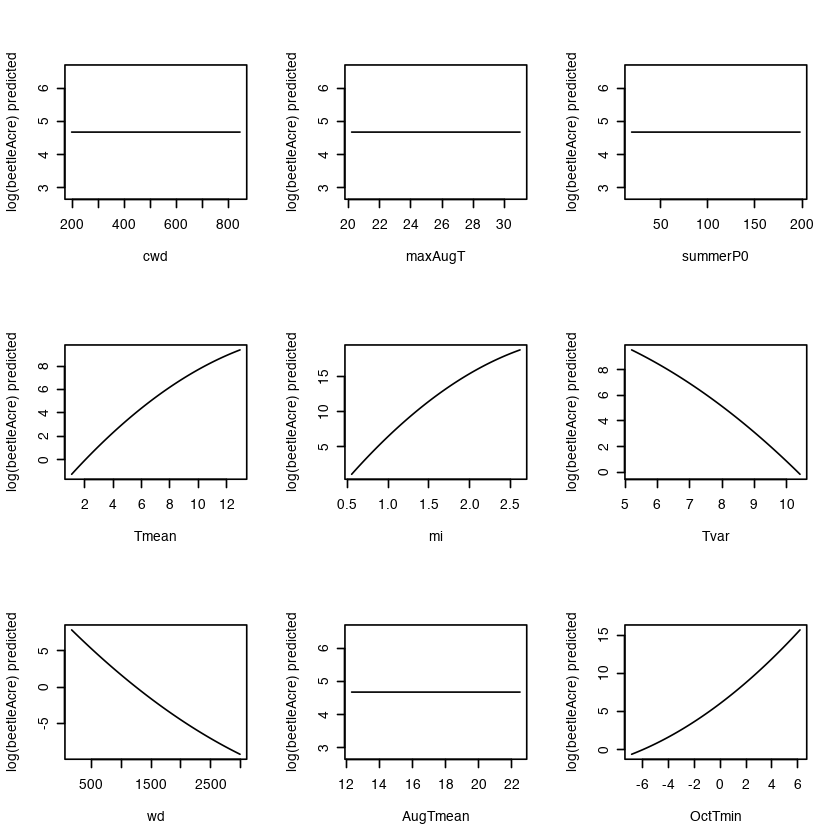

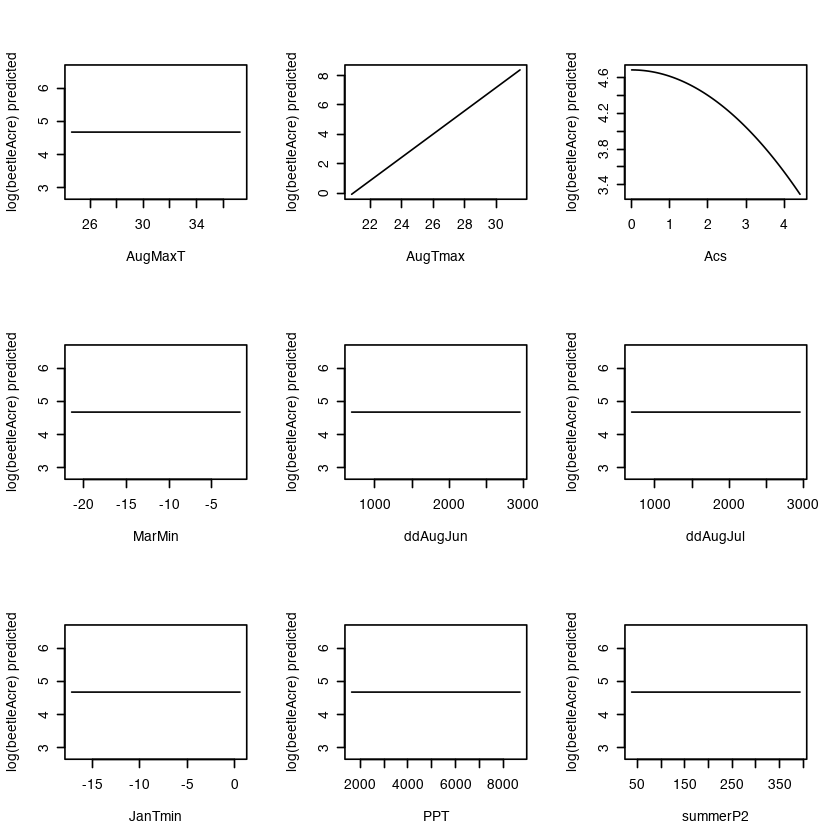

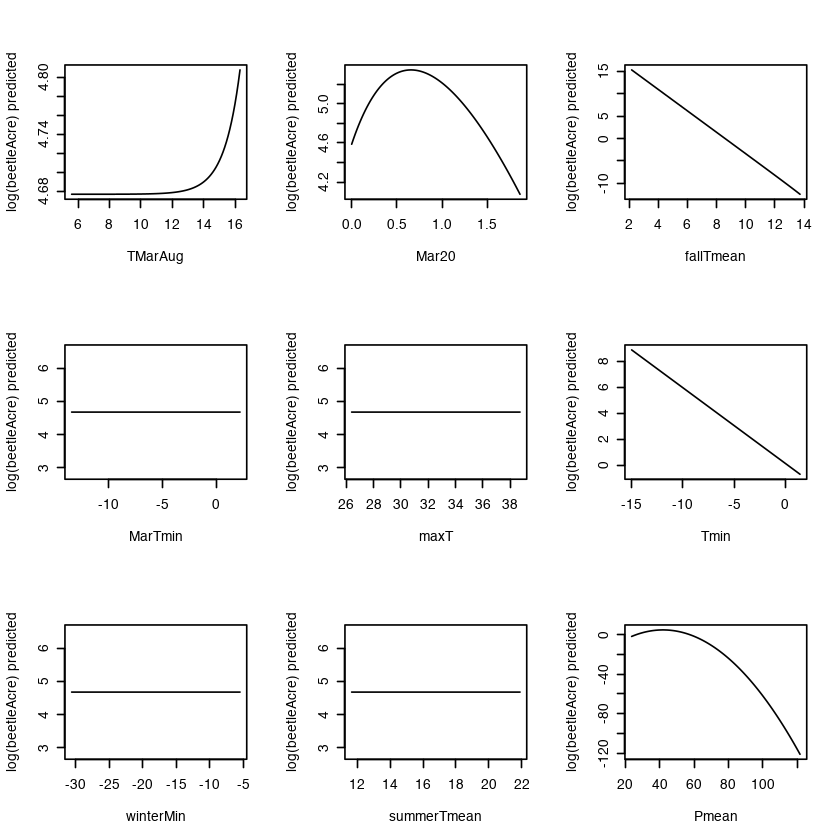

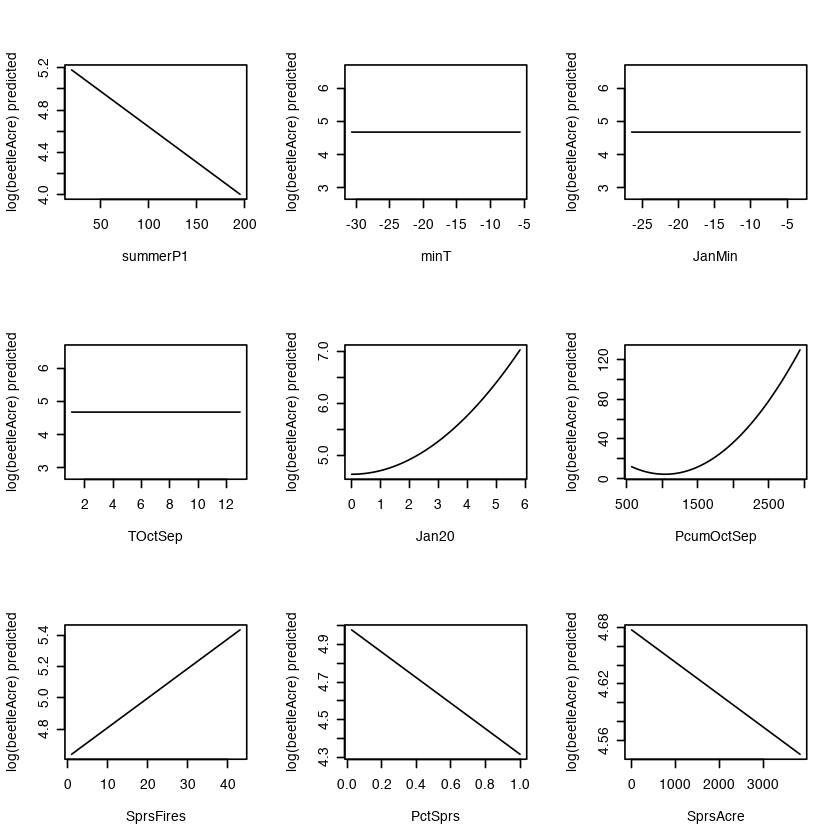

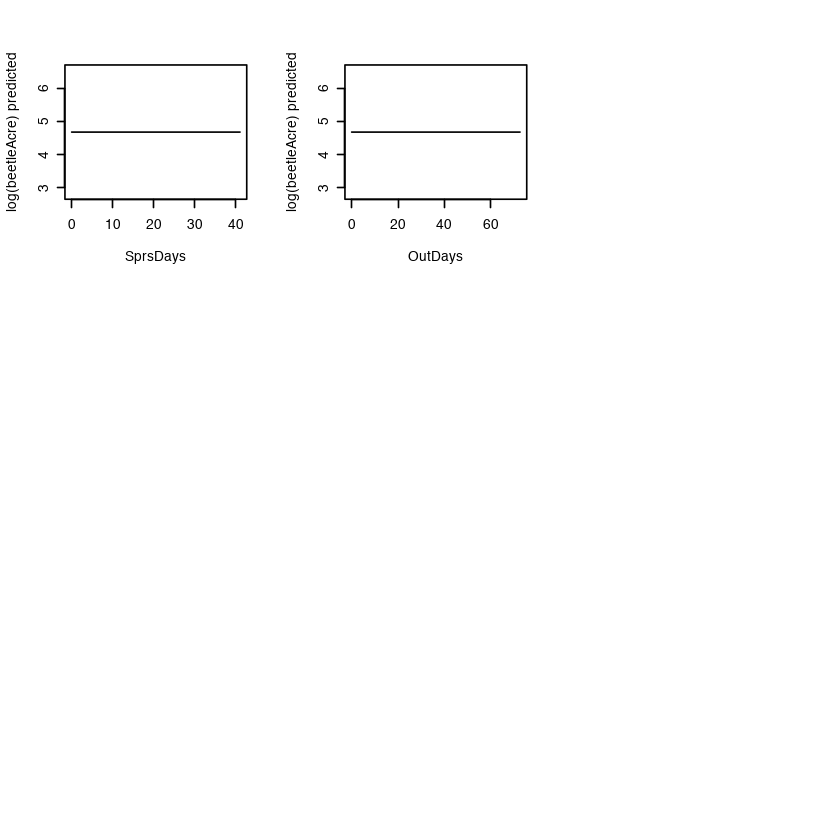

In [72]:
par(mfrow=c(3, 3))
for (field in names(med.df)) {
  if (!(field %in% c('preds', 'beetleAcres'))) {
    test.df <- med.df
    xmin <- quantile(data[, field], probs=0.025)
    xmax <- quantile(data[, field], probs=0.975)
    test.df[, field] <- seq(xmin, xmax, length=100)
    preds <- predict(mod2.r, newdata=test.df)
    plot(preds ~ test.df[, field], 
         type='l', 
         xlab=field, 
         ylab='log(beetleAcre) predicted')
  }
}

In [76]:
head(med.df)

,lon,lat,etopo1,beetleAcres,host,forest,mStdAge,density,PctLarge,PctOld,⋯,JanMin,TOctSep,Jan20,PcumOctSep,SprsFires,PctSprs,SprsAcre,SprsDays,OutDays,preds
1,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445
1.1,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445
1.2,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445
1.3,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445
1.4,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445
1.5,-114.0112,43.41054,1749.273,76.72308,1,1,86.30887,29398.58,0.25,0.4375,⋯,-17.97767,6.289097,0.7389721,945.216,3,0.4677083,0.8,1,3,4.25445


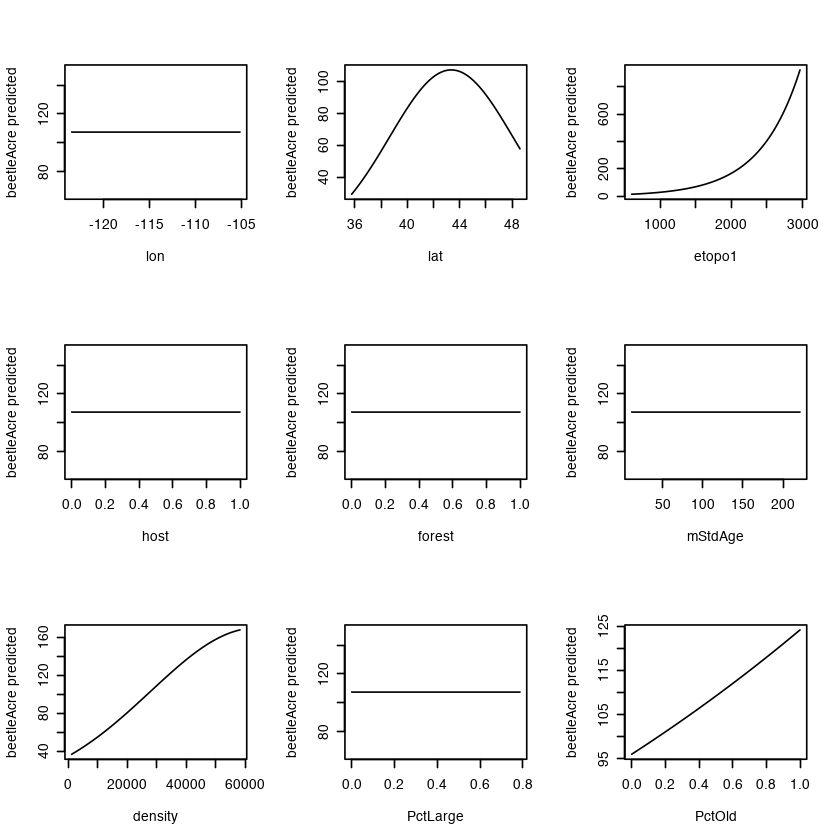

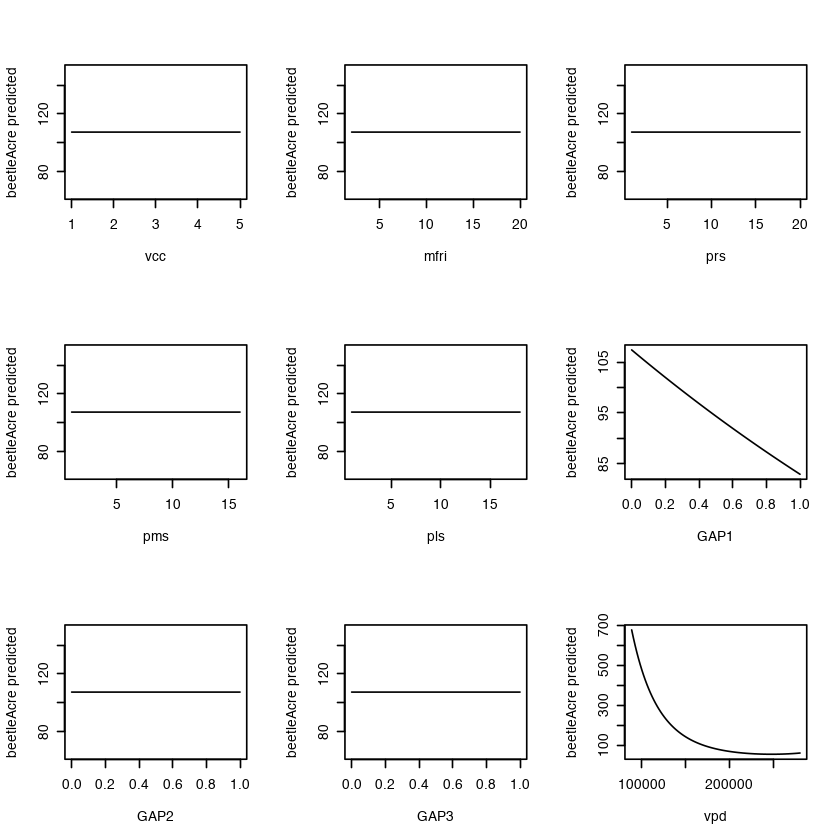

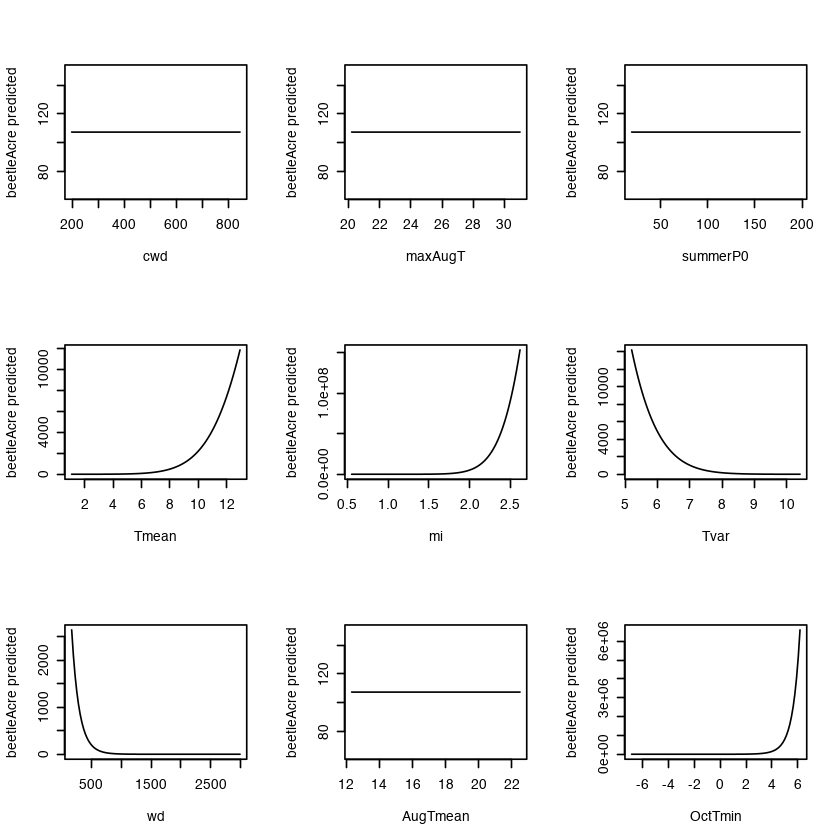

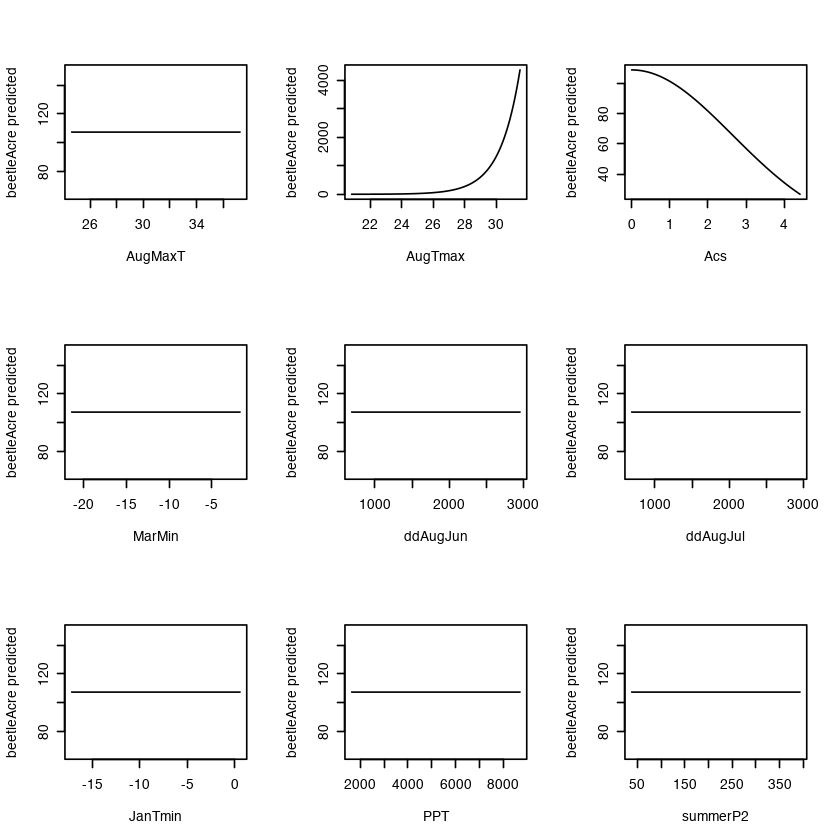

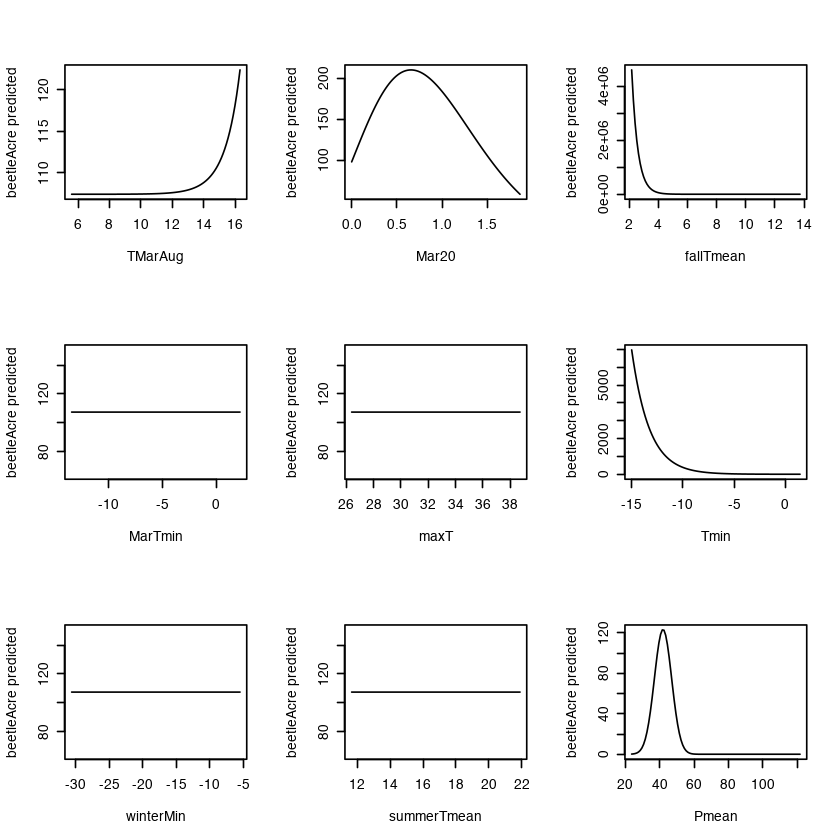

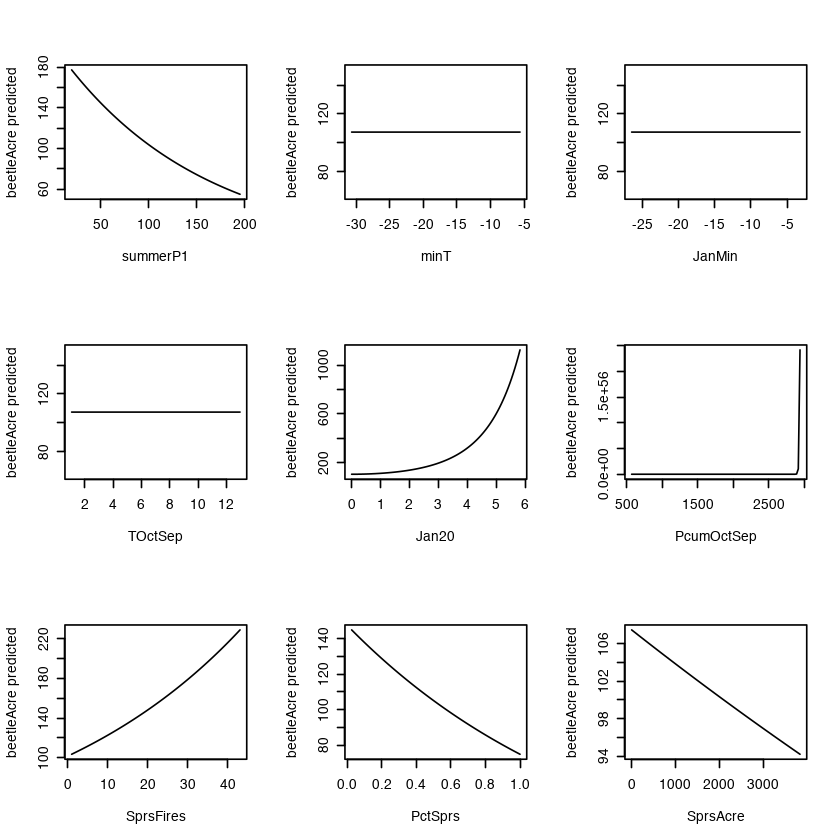

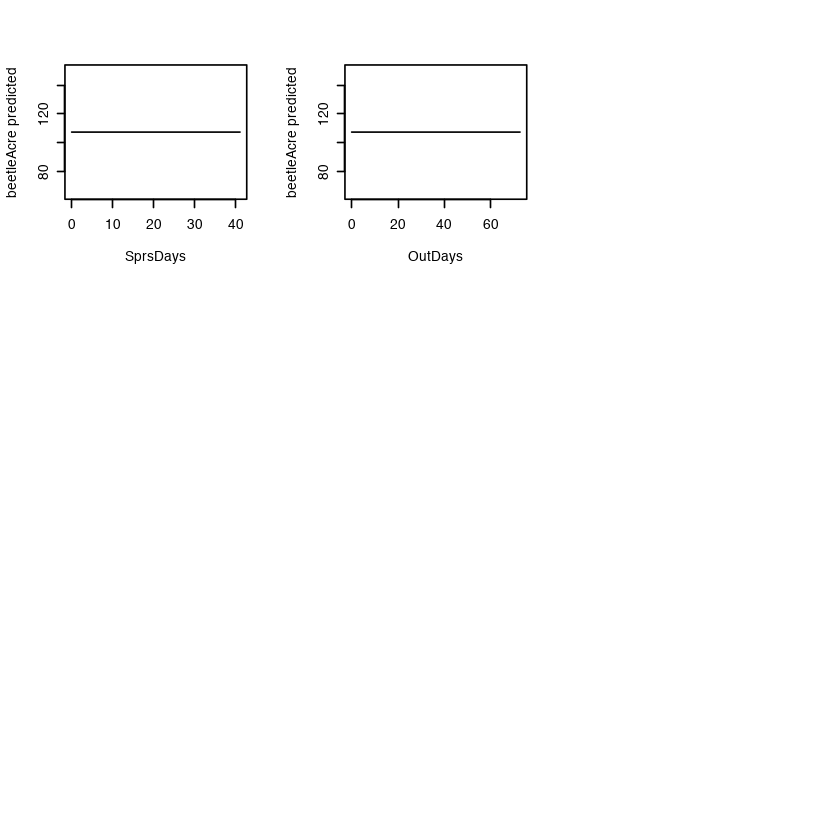

In [92]:
m <- data.frame(matrix(, nrow = 100, ncol = 6))
colnames(m) <- c('SprsFires', 'SprsFires.y', 'PctSprs', 'PctSprs.y', 'SprsAcre', 'SprsAcre.y')
par(mfrow=c(3, 3))
for (field in names(med.df)) {
  if (!(field %in% c('preds', 'beetleAcres'))) {
    test.df <- med.df
    xmin <- quantile(data[, field], probs=0.025)
    xmax <- quantile(data[, field], probs=0.975)
    test.df[, field] <- seq(xmin, xmax, length=100)
    preds <- exp(predict(mod2.r, newdata=test.df))
    i <- 1
    if(field %in% c('SprsFires', 'PctSprs', 'SprsAcre')){
        m[,field] <- test.df[, field]
        m[,paste0(field,'.y')] <- preds
        i <- i + 1
    }
    plot(preds ~ test.df[, field], 
         type='l', 
         xlab=field, 
         ylab='beetleAcre predicted')
  }
}
write.csv(m, sprintf('%s/plot_2D_firedata.csv', DATA), row.names=FALSE)

In [11]:
summary(mod2.r)


Call:
lm(formula = log(beetleAcres) ~ I(lon^2) + lat + I(lat^2) + etopo1 + 
    density + I(density^2) + PctOld + prs + I(prs^2) + GAP1 + 
    vpd + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + 
    Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) + 
    wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + 
    I(AugMaxT^2) + AugTmax + Acs + I(Acs^2) + I(ddAugJul^2) + 
    PPT + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + 
    Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean) + MarTmin + 
    I(maxT^2) + Tmin + Pmean + I(Pmean^2) + minT + JanMin + TOctSep + 
    exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + 
    SprsFires + PctSprs + SprsAcre + OutDays, data = data[-2188, 
    ])

Residuals:
    Min      1Q  Median      3Q     Max 
-5.2596 -1.0088  0.1016  1.0961  8.0324 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -5.896e+01  1.060e+01  -5.564 2.89e-08 ***
I(lon^2)     

In [15]:
library(rcompanion)

In [13]:
y <- data[-2188,'beetleAcres']

In [14]:
length(y)

[1] 2818

In [17]:
y.tuk <- transformTukey(y, plotit=FALSE)


    lambda      W Shapiro.p.value
402  0.025 0.9858       3.633e-16

if (lambda >  0){TRANS = x ^ lambda} 
if (lambda == 0){TRANS = log(x)} 
if (lambda <  0){TRANS = -1 * x ^ lambda} 



In [18]:
data <- read.csv(sprintf('%s/mpb10km_data_wo_costs.csv', DATA))

In [19]:
mod <- lm(beetleAcres^0.025 ~ I(lon^2) + lat + I(lat^2) + etopo1 + 
    density + I(density^2) + PctOld + prs + I(prs^2) + GAP1 + 
    vpd + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + 
    Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) + 
    wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + 
    I(AugMaxT^2) + AugTmax + Acs + I(Acs^2) + I(ddAugJul^2) + 
    PPT + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + 
    Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean) + MarTmin + 
    I(maxT^2) + Tmin + Pmean + I(Pmean^2) + minT + JanMin + TOctSep + 
    exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + 
    SprsFires + PctSprs + SprsAcre + OutDays, data = data[-2188,])
summary(mod)


Call:
lm(formula = beetleAcres^0.025 ~ I(lon^2) + lat + I(lat^2) + 
    etopo1 + density + I(density^2) + PctOld + prs + I(prs^2) + 
    GAP1 + vpd + I(vpd^2) + I(cwd^2) + I(maxAugT^2) + I(summerP0^2) + 
    Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) + 
    wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + 
    I(AugMaxT^2) + AugTmax + Acs + I(Acs^2) + I(ddAugJul^2) + 
    PPT + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + 
    Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean) + MarTmin + 
    I(maxT^2) + Tmin + Pmean + I(Pmean^2) + minT + JanMin + TOctSep + 
    exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + 
    SprsFires + PctSprs + SprsAcre + OutDays, data = data[-2188, 
    ])

Residuals:
      Min        1Q    Median        3Q       Max 
-0.146267 -0.028475  0.002157  0.029907  0.225866 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -6.534e-01  2.927e-01  -2.232 0.025

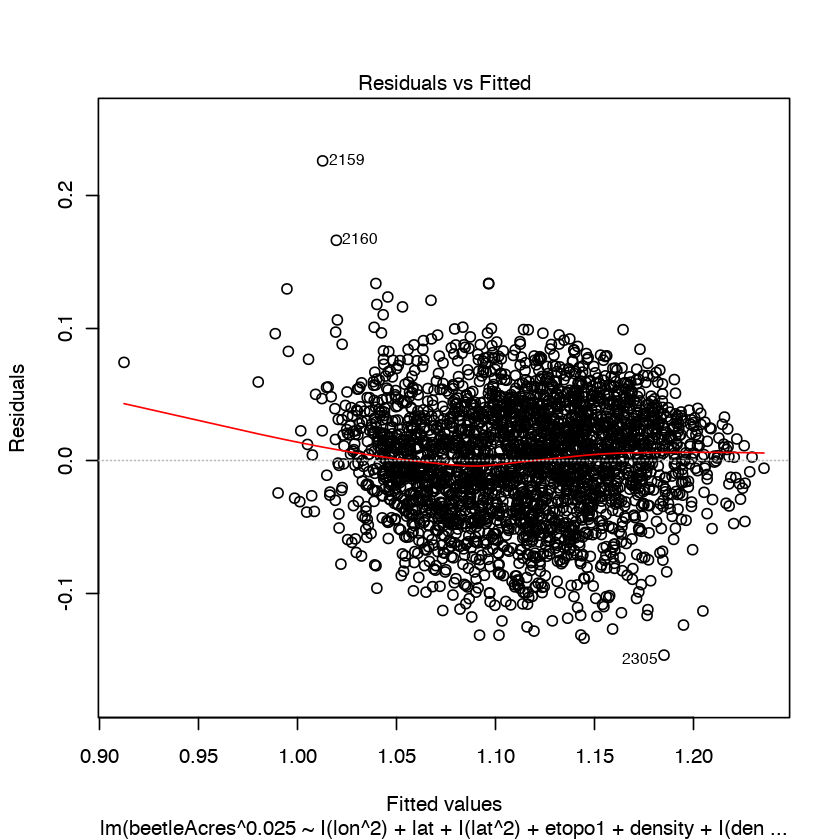

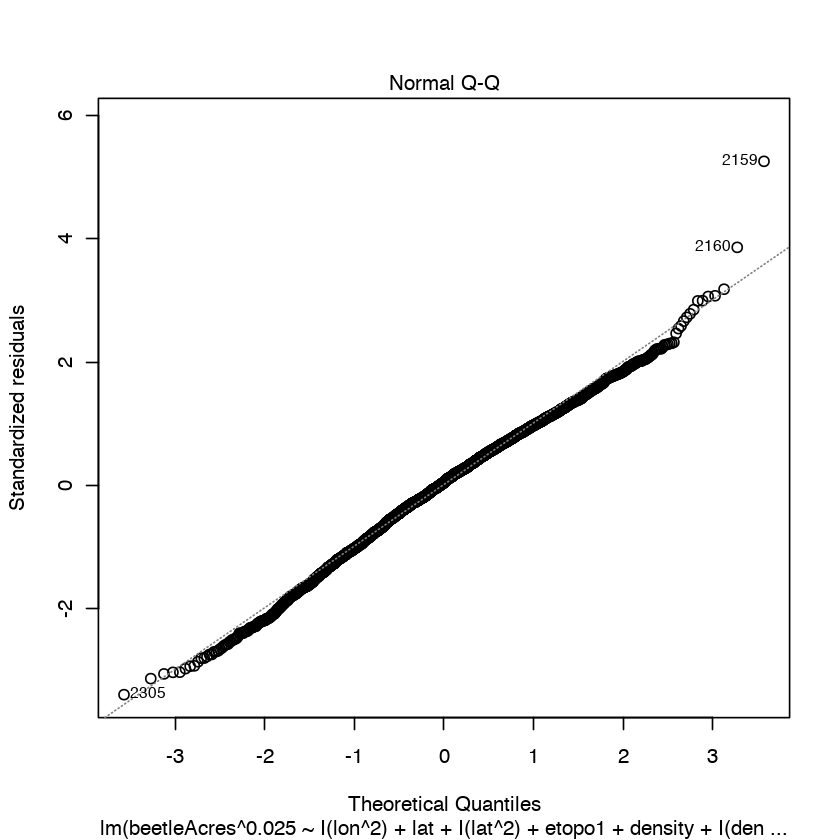

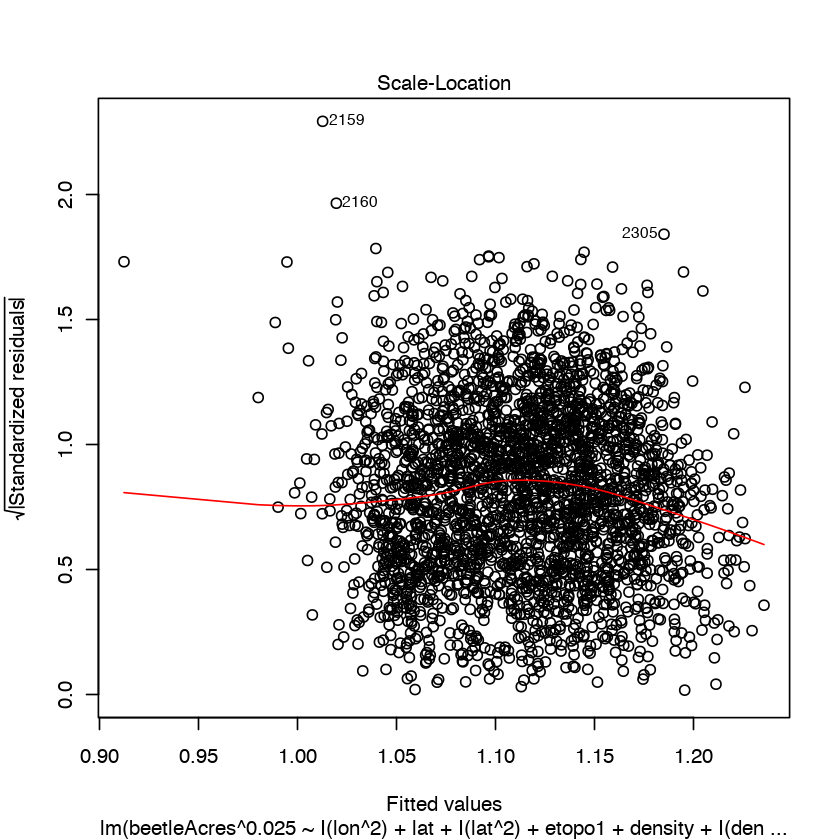

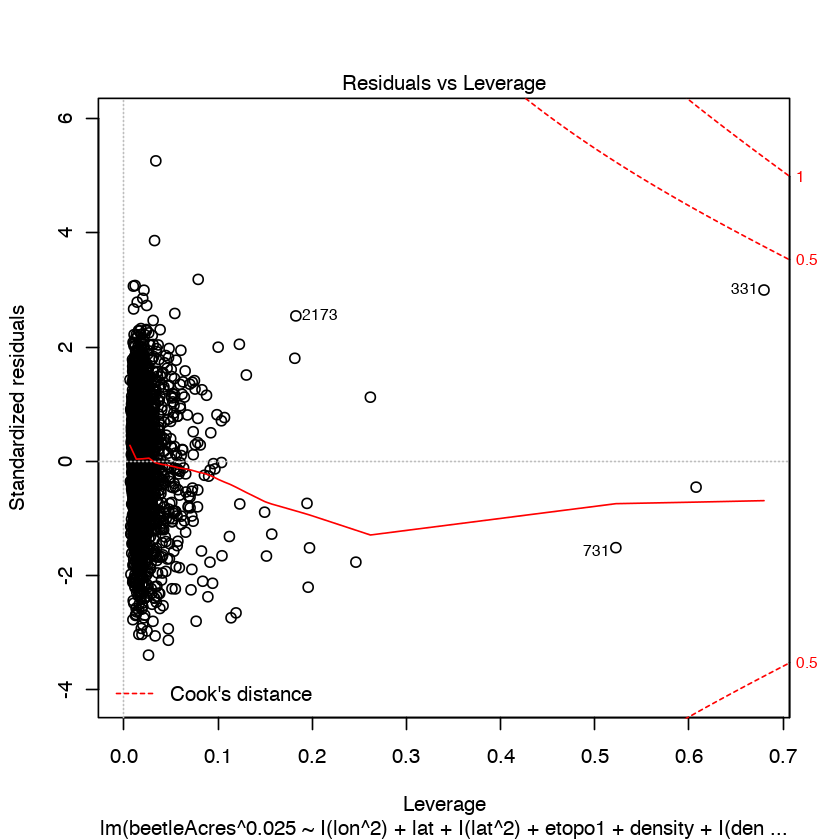

In [20]:
plot(mod)

In [22]:
sq_terms <- c('lon', 'lat', 'density', 'prs', 'vpd', 'cwd', 'maxAugT', 'summerP0', 'Tmean',
              'mi', 'Tvar', 'wd', 'AugTmean', 'OctTmin', 'AugMaxT', 
              'Acs', 'ddAugJul','summerP2', 'maxT', 'Pmean', 'Jan20', 'PcumOctSep')
exp_terms <- c('Tmean', 'TMarAug', 'fallTmean')
logp1_terms <- 'Mar20'

for(var in sq_terms){
    varnm <- paste0(var, '_sq')
    data[,varnm] <- (data[,var])^2
    cat(sprintf('Calculated %s in a squared term...\n', var))
}

for(var in exp_terms){
    varnm <- paste0(var, '_exp')
    data[,varnm] <- exp(data[,var])
    cat(sprintf('Calculated %s in a exponential term...\n', var))
}

for(var in logp1_terms){
    varnm <- paste0(var, '_logp1')
    data[,varnm] <- log(data[,var]+1)
    cat(sprintf('Calculated %s in a logarithm term...\n', var))
}

Calculated lon in a squared term...
Calculated lat in a squared term...
Calculated density in a squared term...
Calculated prs in a squared term...
Calculated vpd in a squared term...
Calculated cwd in a squared term...
Calculated maxAugT in a squared term...
Calculated summerP0 in a squared term...
Calculated Tmean in a squared term...
Calculated mi in a squared term...
Calculated Tvar in a squared term...
Calculated wd in a squared term...
Calculated AugTmean in a squared term...
Calculated OctTmin in a squared term...
Calculated AugMaxT in a squared term...
Calculated Acs in a squared term...
Calculated ddAugJul in a squared term...
Calculated summerP2 in a squared term...
Calculated maxT in a squared term...
Calculated Pmean in a squared term...
Calculated Jan20 in a squared term...
Calculated PcumOctSep in a squared term...
Calculated Tmean in a exponential term...
Calculated TMarAug in a exponential term...
Calculated fallTmean in a exponential term...
Calculated Mar20 in a logar

In [23]:
selected.vars <- c('lat', 'etopo1', 'density', 'PctOld', 'prs', 'GAP1', 'vpd', 'Tmean',
                   'mi', 'Tvar', 'wd', 'AugTmean', 'OctTmin', 'AugTmax', 'Acs', 'PPT', 'TMarAug',
                   'summerP2', 'Mar20', 'fallTmean', 'MarTmin', 'Tmin', 'Pmean', 'minT','JanMin', 'TOctSep', 
                   'Jan20','PcumOctSep','SprsFires', 'PctSprs', 'SprsAcre', 'OutDays',
                   paste0(sq_terms, '_sq'), paste0(exp_terms, '_exp'), paste0(logp1_terms, '_logp1'))
predictors <- data[ , (names(data) %in% selected.vars)]
predictors <- scale(predictors)
df <- data.frame(beetleAcres=data[,'beetleAcres'], predictors)
df$beetleAcres <- log(df$beetleAcres)

In [24]:
mod <- lm(beetleAcres ~ ., data=df)

In [25]:
mod.r <- step(mod, trace=0)

In [26]:
summary(mod.r)


Call:
lm(formula = beetleAcres ~ lat + etopo1 + density + PctOld + 
    prs + GAP1 + vpd + Tmean + mi + Tvar + wd + AugTmean + OctTmin + 
    AugTmax + Acs + PPT + summerP2 + TMarAug + Mar20 + fallTmean + 
    MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + Jan20 + 
    PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + lon_sq + 
    lat_sq + density_sq + prs_sq + vpd_sq + cwd_sq + maxAugT_sq + 
    summerP0_sq + Tmean_sq + mi_sq + Tvar_sq + wd_sq + AugTmean_sq + 
    OctTmin_sq + AugMaxT_sq + Acs_sq + ddAugJul_sq + summerP2_sq + 
    maxT_sq + Pmean_sq + Jan20_sq + PcumOctSep_sq + Tmean_exp + 
    TMarAug_exp + fallTmean_exp + Mar20_logp1, data = df)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.3002 -1.0082  0.1087  1.0921  7.9779 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)      4.23700    0.02985 141.935  < 2e-16 ***
lat              7.85441    1.66116   4.728 2.38e-06 ***
etopo1           1.17265    0.15365   7.632 3.16e-1

In [27]:
sort(abs(mod.r$coefficients))

OutDays        PctOld      SprsAcre          GAP1       PctSprs 
   0.05746914    0.08693596    0.09366905    0.10372393    0.21720484 
    SprsFires           prs        prs_sq    density_sq    OctTmin_sq 
   0.26629057    0.40913900    0.45635092    0.48066123    0.56296517 
          Acs   TMarAug_exp    maxAugT_sq   ddAugJul_sq         Jan20 
   0.57079102    0.58604738    0.63249721    0.68943495    0.70625094 
       cwd_sq        Acs_sq        lon_sq       density      Jan20_sq 
   0.74238671    0.79238601    0.82766434    0.84803180    1.05473363 
        wd_sq        etopo1       MarTmin fallTmean_exp      summerP2 
   1.09471074    1.17264991    1.22933374    1.33708173    1.35270383 
      AugTmax        vpd_sq         Mar20   Mar20_logp1   AugTmean_sq 
   1.47100909    1.77220975    1.79082964    1.82388858    1.88597854 
       JanMin      Tmean_sq     Tmean_exp         mi_sq    AugMaxT_sq 
   1.88994299    1.89982397    1.90194581    2.08765155    2.29402339 
         minT           vpd       maxT_sq       Tvar_sq       OctTmin 
   2.32825215    2.33469769    2.71952661    3.19356209    3.56751821 
         Tmin      AugTmean   (Intercept)          Tvar            wd 
   3.78614313    3.79889351    4.23699987    4.95415715    6.06726947 
      TMarAug            mi   summerP0_sq           lat   summerP2_sq 
   6.63859981    7.17077661    7.28988535    7.85440843    8.19618796 
       lat_sq     fallTmean           PPT         Pmean    PcumOctSep 
   8.37095527    9.17239920   10.55302859  122.39731776  135.30888659 
     Pmean_sq PcumOctSep_sq       TOctSep         Tmean 
 143.89526069  145.88155303  225.08648908  241.94250431

In [28]:
library(rcompanion)
y <- data[,'beetleAcres']
# length(y)
y.tuk <- transformTukey(y,plotit=FALSE)


    lambda      W Shapiro.p.value
402  0.025 0.9858       3.633e-16

if (lambda >  0){TRANS = x ^ lambda} 
if (lambda == 0){TRANS = log(x)} 
if (lambda <  0){TRANS = -1 * x ^ lambda} 



In [29]:
df <- data.frame(beetleAcres=data[,'beetleAcres'], predictors)
df$beetleAcres <- (df$beetleAcres)^0.025
mod <- lm(beetleAcres ~ ., data=df)
mod.r <- step(mod, trace=0)
summary(mod.r)


Call:
lm(formula = beetleAcres ~ lat + etopo1 + density + PctOld + 
    prs + GAP1 + vpd + Tmean + mi + Tvar + wd + AugTmean + OctTmin + 
    AugTmax + Acs + PPT + summerP2 + TMarAug + Mar20 + fallTmean + 
    MarTmin + Tmin + Pmean + minT + JanMin + TOctSep + Jan20 + 
    PcumOctSep + SprsFires + PctSprs + SprsAcre + OutDays + lon_sq + 
    lat_sq + density_sq + prs_sq + vpd_sq + cwd_sq + maxAugT_sq + 
    summerP0_sq + Tmean_sq + mi_sq + Tvar_sq + wd_sq + AugTmean_sq + 
    OctTmin_sq + AugMaxT_sq + Acs_sq + ddAugJul_sq + summerP2_sq + 
    maxT_sq + Pmean_sq + Jan20_sq + PcumOctSep_sq + Tmean_exp + 
    TMarAug_exp + fallTmean_exp + Mar20_logp1, data = df)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.147357 -0.027996  0.002223  0.030180  0.224401 

Coefficients:
                Estimate Std. Error  t value Pr(>|t|)    
(Intercept)    1.1135257  0.0008245 1350.568  < 2e-16 ***
lat            0.2196135  0.0458802    4.787 1.79e-06 ***
etopo1         0.0330905  0.

In [30]:
sort(abs(mod.r$coefficients))

OutDays        PctOld      SprsAcre          GAP1       PctSprs 
  0.001610201   0.002480690   0.002605740   0.003065525   0.005919373 
    SprsFires           prs        prs_sq    density_sq    OctTmin_sq 
  0.007416300   0.011310931   0.012628725   0.013389854   0.015303037 
  TMarAug_exp           Acs    maxAugT_sq   ddAugJul_sq        cwd_sq 
  0.015748398   0.017238903   0.017622987   0.019726590   0.021570662 
        Jan20        Acs_sq       density        lon_sq      Jan20_sq 
  0.022031888   0.023137504   0.023660350   0.024139523   0.030918099 
        wd_sq        etopo1 fallTmean_exp       MarTmin      summerP2 
  0.031090808   0.033090528   0.035836382   0.036050447   0.036713724 
      AugTmax   AugTmean_sq      Tmean_sq        vpd_sq     Tmean_exp 
  0.043121135   0.048863282   0.050030169   0.050105097   0.050908423 
        Mar20        JanMin   Mar20_logp1         mi_sq    AugMaxT_sq 
  0.051274276   0.052611152   0.052745270   0.058765061   0.061802386 
          vpd          minT       maxT_sq       Tvar_sq       OctTmin 
  0.065579531   0.065812073   0.073837938   0.086924415   0.101108070 
     AugTmean          Tmin          Tvar            wd       TMarAug 
  0.104913429   0.105263157   0.136888845   0.170490095   0.184573155 
  summerP0_sq            mi           lat   summerP2_sq        lat_sq 
  0.200804585   0.201302041   0.219613530   0.225630697   0.235980410 
    fallTmean           PPT   (Intercept)         Pmean    PcumOctSep 
  0.256997072   0.299677063   1.113525666   3.456059565   3.821704991 
     Pmean_sq PcumOctSep_sq       TOctSep         Tmean 
  4.021175529   4.076703431   6.317905298   6.783873088

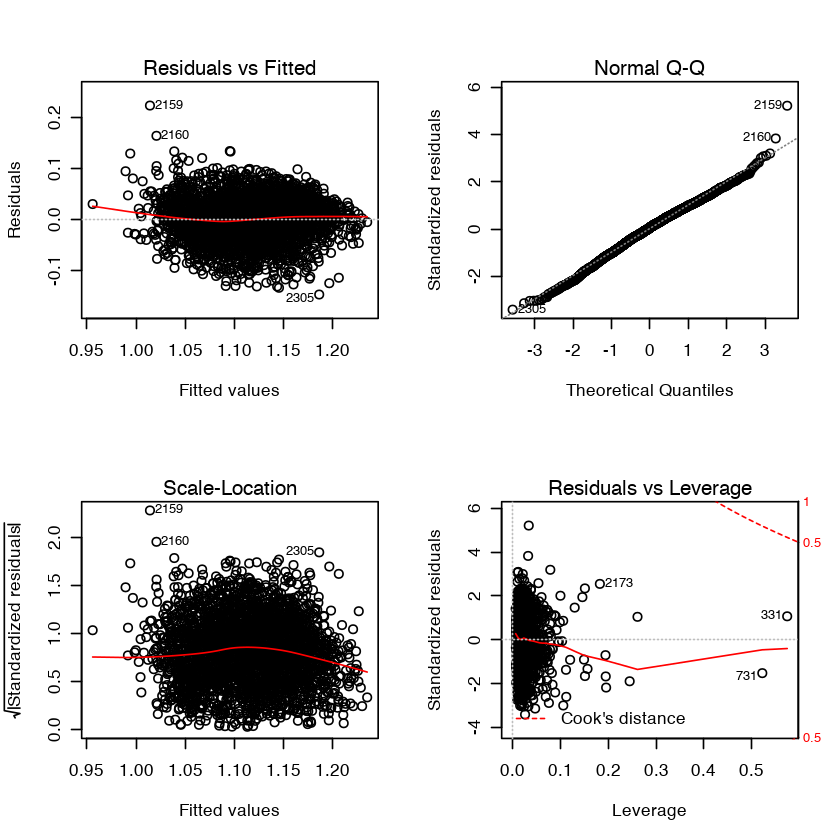

In [31]:
par(mfrow=c(2, 2))
plot(mod.r)

In [32]:
length(data$beetleAcres)

[1] 2818

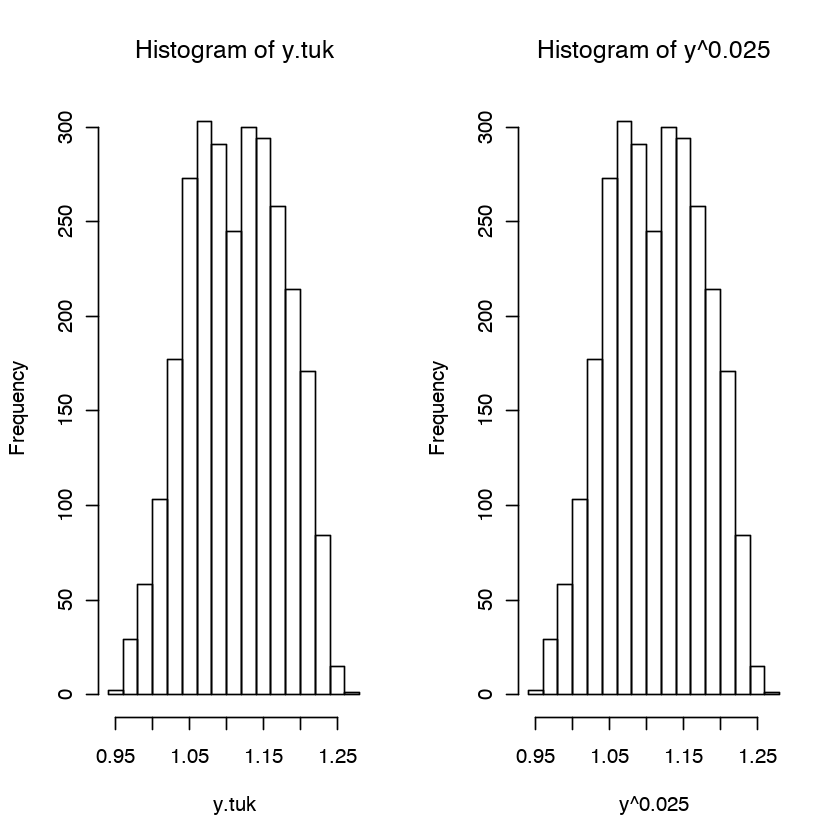

In [33]:
par(mfrow=c(1, 2))
hist(y.tuk)
hist(y ^ 0.025)

In [34]:
bstar = NULL # Rows of bstar will be bootstrap vectors of regression coefficients.
n = dim(data)[1] 
B = 1000
ptm <- proc.time()
for(draw in 1:B){
  # Randomly sample from the rows, with replacement
  Dstar = data[sample(1:n,size=n,replace=T),]
  model <- lm(
    beetleAcres^0.025 ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) + mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) + prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax 
    + Acs + I(Acs^2) + MarMin + ddAugJun + I(ddAugJun^2) + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) 
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,
    data=Dstar)
  bstar = rbind( bstar,coef(model) )
  # print(draw)
} # Next draw
proc.time() - ptm

   user  system elapsed 
 81.654   2.568  98.478 

In [35]:
bstar <- as.data.frame(bstar)

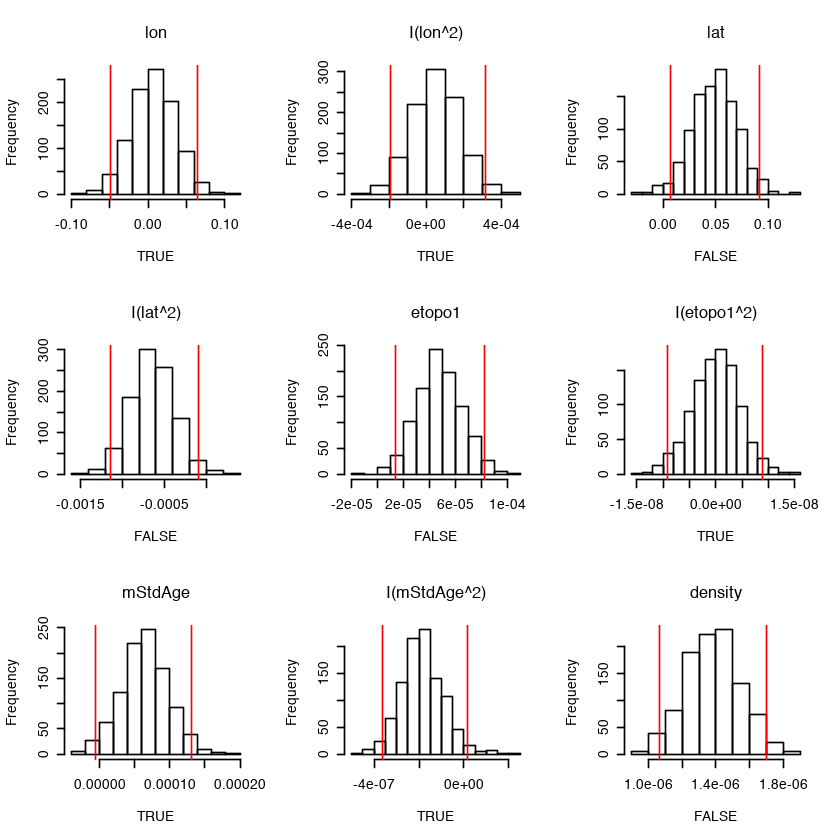

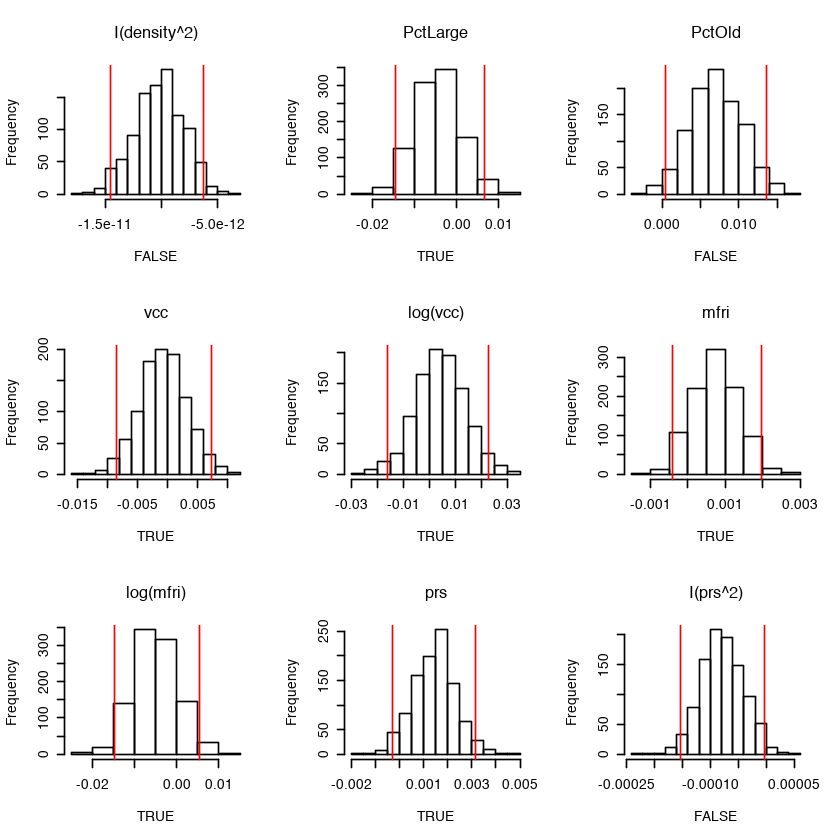

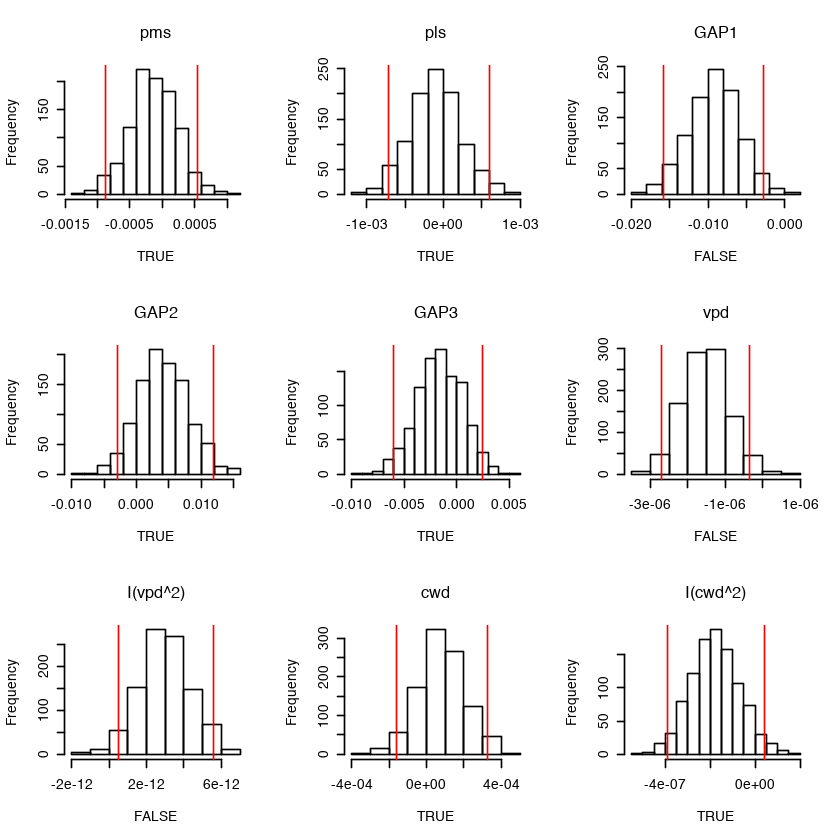

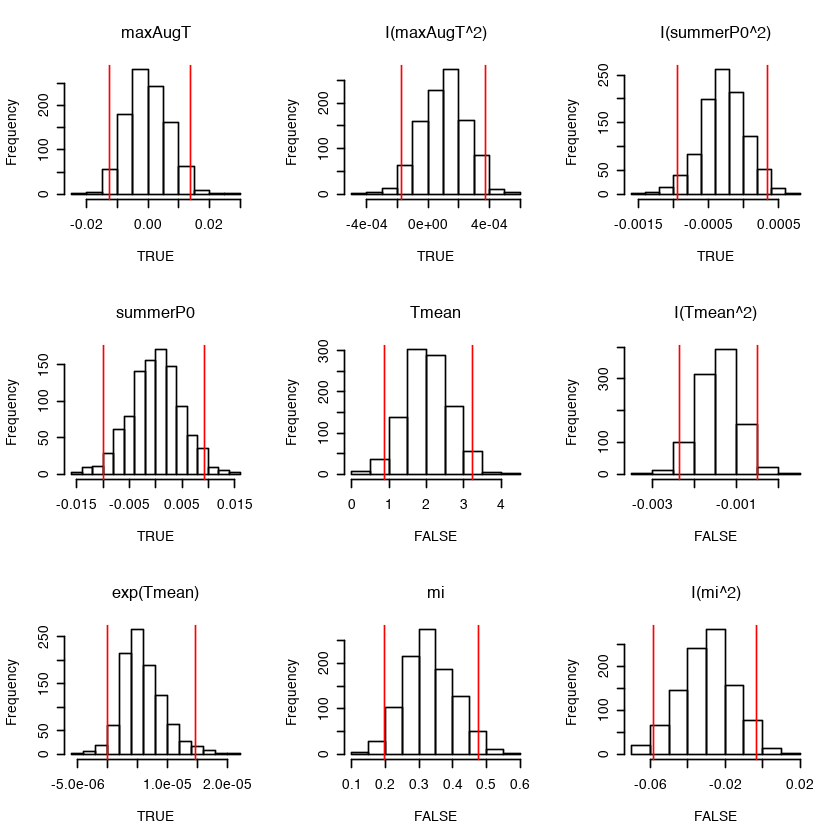

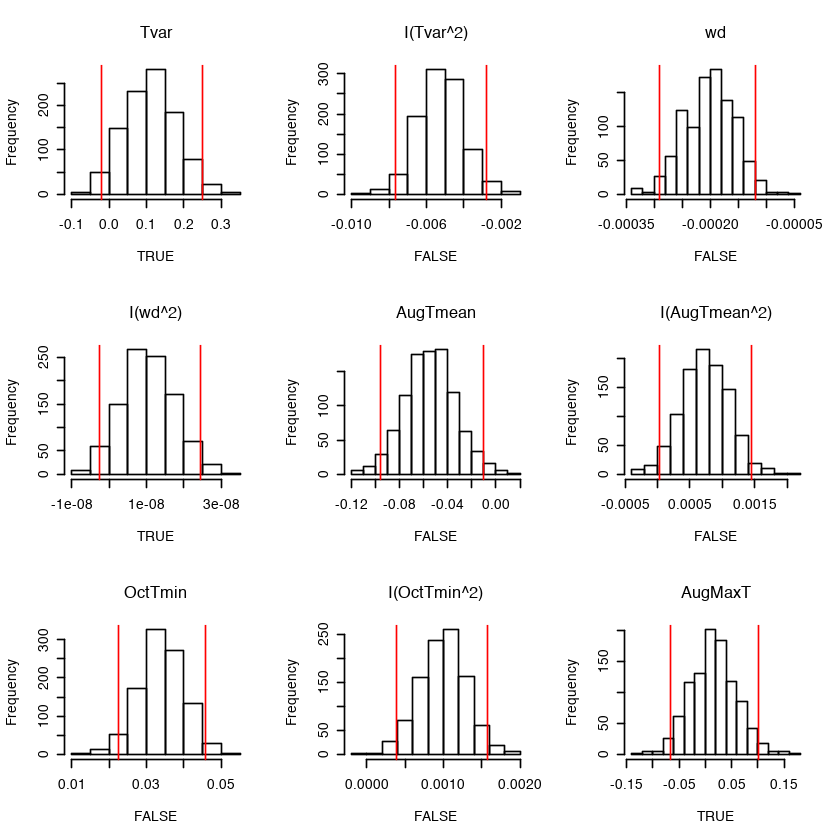

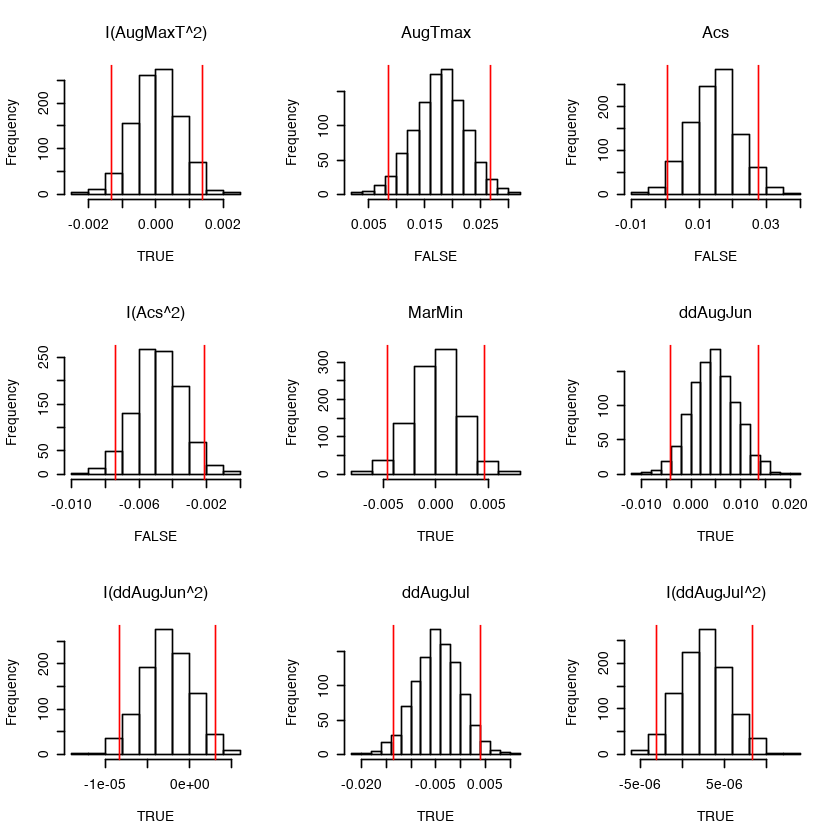

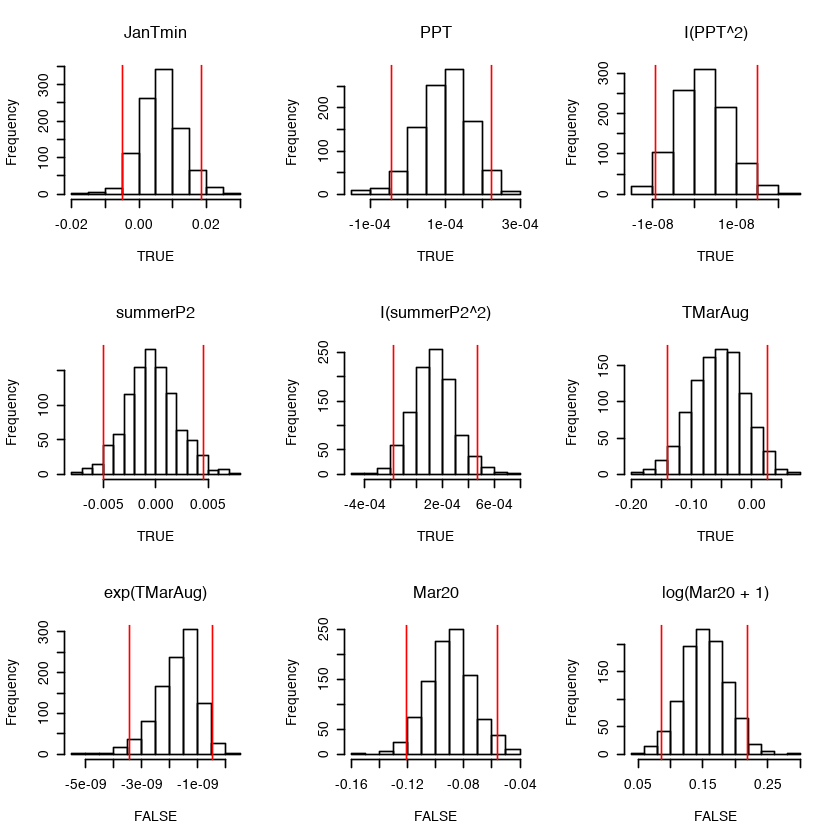

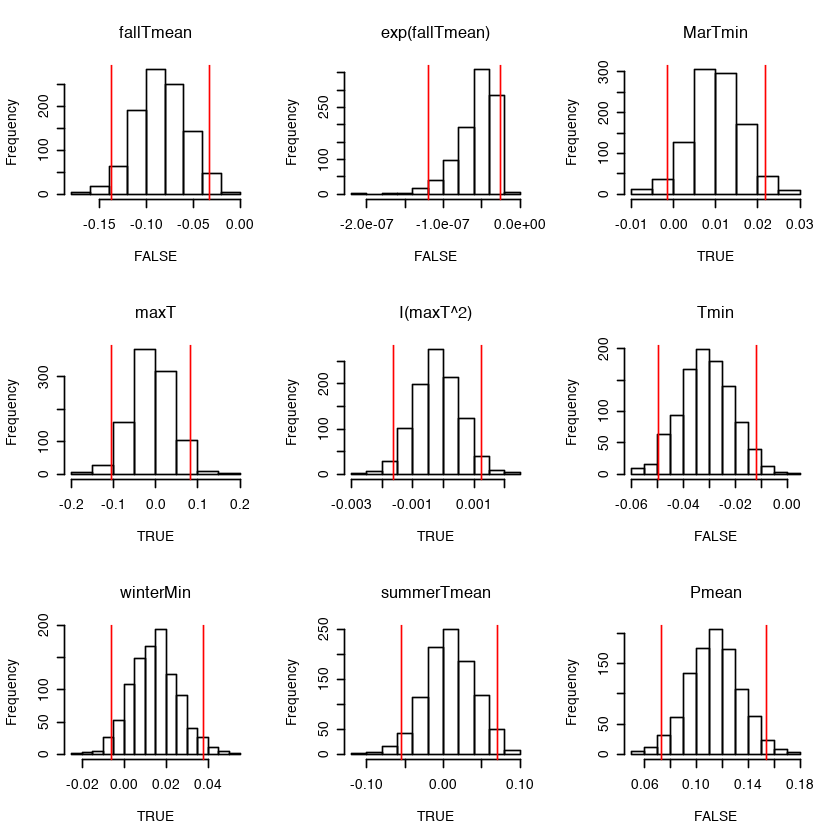

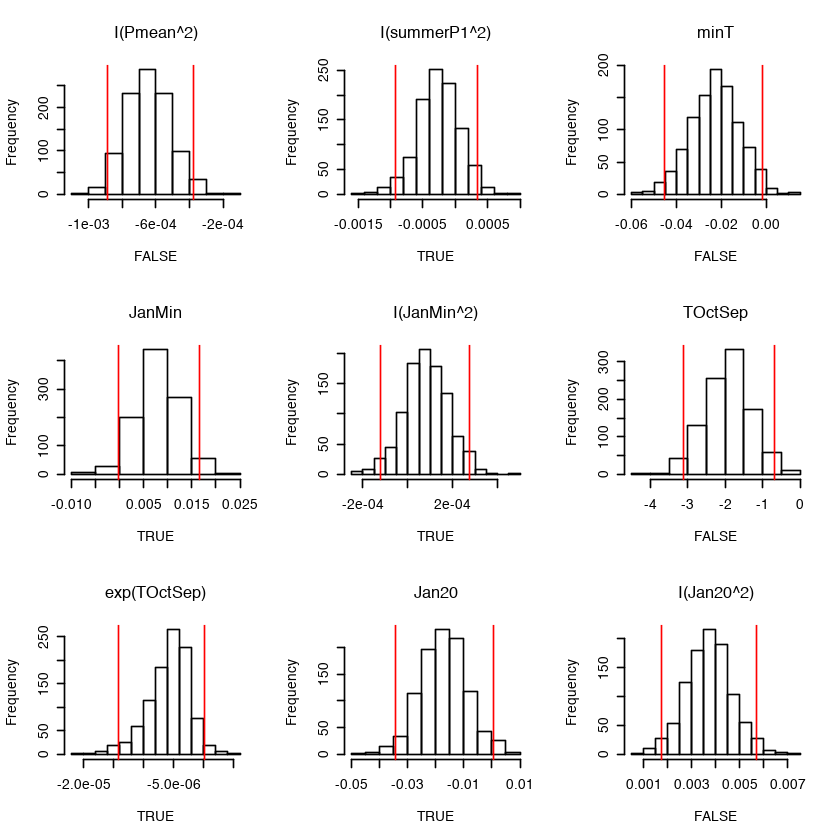

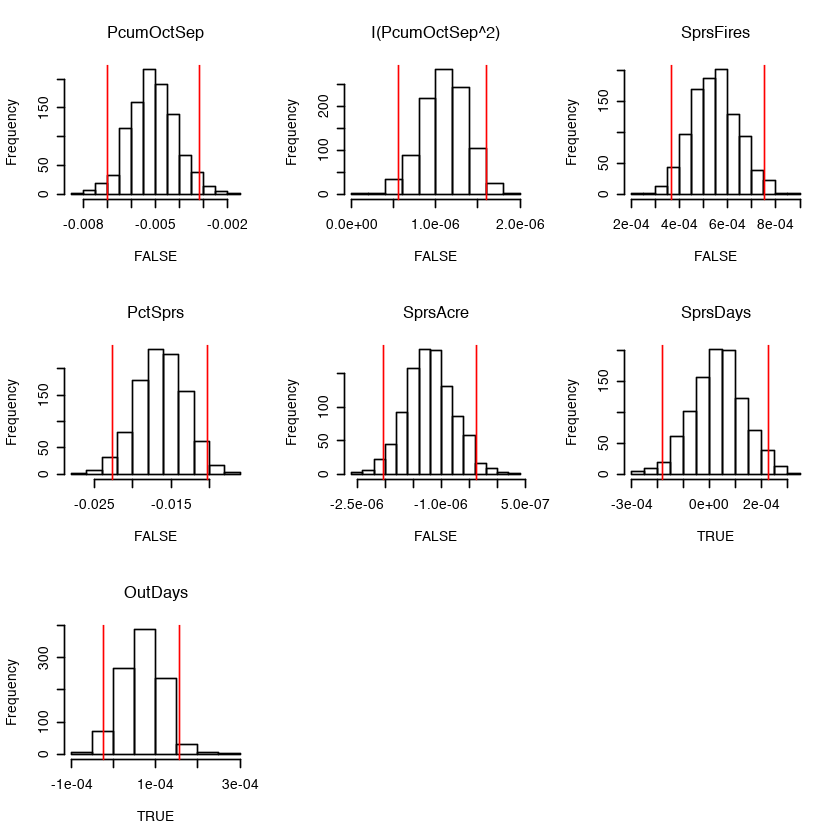

In [46]:
par(mfrow=c(3, 3))
removable <- c()
for (field in names(bstar)) {
    if(!(field %in% c('(Intercept)', 'summerP1'))){
        qs <- quantile(bstar[,field], prob=c(0.025, 0.975))
        remove <- 0 >= qs[1] & 0 <= qs[2]
        hist(bstar[,field], main=field, xlab=remove)
        abline(v=qs,col="red")
        if(remove){removable <- c(removable, field)}
    }
}

In [57]:
colnames(bstar)

[1] "(Intercept)"     "lon"             "I(lon^2)"        "lat"            
 [5] "I(lat^2)"        "etopo1"          "I(etopo1^2)"     "mStdAge"        
 [9] "I(mStdAge^2)"    "density"         "I(density^2)"    "PctLarge"       
[13] "PctOld"          "vcc"             "log(vcc)"        "mfri"           
[17] "log(mfri)"       "prs"             "I(prs^2)"        "pms"            
[21] "pls"             "GAP1"            "GAP2"            "GAP3"           
[25] "vpd"             "I(vpd^2)"        "cwd"             "I(cwd^2)"       
[29] "maxAugT"         "I(maxAugT^2)"    "I(summerP0^2)"   "summerP0"       
[33] "Tmean"           "I(Tmean^2)"      "exp(Tmean)"      "mi"             
[37] "I(mi^2)"         "Tvar"            "I(Tvar^2)"       "wd"             
[41] "I(wd^2)"         "AugTmean"        "I(AugTmean^2)"   "OctTmin"        
[45] "I(OctTmin^2)"    "AugMaxT"         "I(AugMaxT^2)"    "AugTmax"        
[49] "Acs"             "I(Acs^2)"        "MarMin"          "ddAugJun"       
[53] "I(ddAugJun^2)"   "ddAugJul"        "I(ddAugJul^2)"   "JanTmin"        
[57] "PPT"             "I(PPT^2)"        "summerP2"        "I(summerP2^2)"  
[61] "TMarAug"         "exp(TMarAug)"    "Mar20"           "log(Mar20 + 1)" 
[65] "fallTmean"       "exp(fallTmean)"  "MarTmin"         "maxT"           
[69] "I(maxT^2)"       "Tmin"            "winterMin"       "summerTmean"    
[73] "Pmean"           "I(Pmean^2)"      "summerP1"        "I(summerP1^2)"  
[77] "minT"            "JanMin"          "I(JanMin^2)"     "TOctSep"        
[81] "exp(TOctSep)"    "Jan20"           "I(Jan20^2)"      "PcumOctSep"     
[85] "I(PcumOctSep^2)" "SprsFires"       "PctSprs"         "SprsAcre"       
[89] "SprsDays"        "OutDays"

In [45]:
removable

[1] "lon"           "I(lon^2)"      "I(etopo1^2)"   "mStdAge"      
 [5] "I(mStdAge^2)"  "PctLarge"      "vcc"           "log(vcc)"     
 [9] "mfri"          "log(mfri)"     "prs"           "pms"          
[13] "pls"           "GAP2"          "GAP3"          "cwd"          
[17] "I(cwd^2)"      "maxAugT"       "I(maxAugT^2)"  "I(summerP0^2)"
[21] "summerP0"      "exp(Tmean)"    "Tvar"          "I(wd^2)"      
[25] "AugMaxT"       "I(AugMaxT^2)"  "MarMin"        "ddAugJun"     
[29] "I(ddAugJun^2)" "ddAugJul"      "I(ddAugJul^2)" "JanTmin"      
[33] "PPT"           "I(PPT^2)"      "summerP2"      "I(summerP2^2)"
[37] "TMarAug"       "MarTmin"       "maxT"          "I(maxT^2)"    
[41] "winterMin"     "summerTmean"   "I(summerP1^2)" "JanMin"       
[45] "I(JanMin^2)"   "exp(TOctSep)"  "Jan20"         "SprsDays"     
[49] "OutDays"

mod <- lm(
    beetleAcres^0.025 ~ lat + I(lat^2) + etopo1 + density + I(density^2) + PctOld + I(prs^2) 
    + GAP1 + vpd + I(vpd^2) + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + I(Tvar^2) 
    + wd + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugTmax + Acs + I(Acs^2) 
    + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + Tmin + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + OutDays,
    data=data)

In [37]:
mod <- lm(
    beetleAcres^0.025 ~ lon + I(lon^2) + lat + I(lat^2) + etopo1 + I(etopo1^2) + mStdAge + I(mStdAge^2) 
    + density + I(density^2) + PctLarge + PctOld + vcc + log(vcc) + mfri + log(mfri) + prs + I(prs^2) 
    + pms + pls + GAP1 + GAP2 + GAP3 + vpd + I(vpd^2) + cwd + I(cwd^2) + maxAugT + I(maxAugT^2)
    + I(summerP0^2) + summerP0 + Tmean + I(Tmean^2) + exp(Tmean) + mi + I(mi^2) + Tvar + I(Tvar^2) 
    + wd + I(wd^2) + AugTmean + I(AugTmean^2) + OctTmin + I(OctTmin^2) + AugMaxT + I(AugMaxT^2)+ AugTmax 
    + Acs + I(Acs^2) + MarMin + ddAugJun + I(ddAugJun^2) + ddAugJul + I(ddAugJul^2) + JanTmin + PPT + I(PPT^2) 
    + summerP2 + I(summerP2^2) + TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + exp(fallTmean)
    + MarTmin + maxT + I(maxT^2) + Tmin + winterMin + summerTmean + Pmean + I(Pmean^2) + summerP1 + I(summerP1^2)
    + minT + JanMin + I(JanMin^2) + TOctSep + exp(TOctSep) + Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) 
    + SprsFires + PctSprs + SprsAcre + SprsDays + OutDays,
    data=data)

In [38]:
mod.r <- step(mod, trace=0)
summary(mod.r)


Call:
lm(formula = beetleAcres^0.025 ~ I(lon^2) + lat + I(lat^2) + 
    etopo1 + mStdAge + I(mStdAge^2) + density + I(density^2) + 
    PctOld + prs + I(prs^2) + GAP1 + vpd + I(vpd^2) + I(cwd^2) + 
    I(maxAugT^2) + I(summerP0^2) + Tmean + I(Tmean^2) + exp(Tmean) + 
    mi + I(mi^2) + Tvar + I(Tvar^2) + wd + I(wd^2) + AugTmean + 
    I(AugTmean^2) + OctTmin + I(OctTmin^2) + I(AugMaxT^2) + AugTmax + 
    Acs + I(Acs^2) + I(ddAugJul^2) + PPT + summerP2 + I(summerP2^2) + 
    TMarAug + exp(TMarAug) + Mar20 + log(Mar20 + 1) + fallTmean + 
    exp(fallTmean) + MarTmin + I(maxT^2) + Tmin + winterMin + 
    Pmean + I(Pmean^2) + minT + JanMin + TOctSep + exp(TOctSep) + 
    Jan20 + I(Jan20^2) + PcumOctSep + I(PcumOctSep^2) + SprsFires + 
    PctSprs + SprsAcre + OutDays, data = data)

Residuals:
      Min        1Q    Median        3Q       Max 
-0.146215 -0.027977  0.002247  0.030101  0.226201 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -7.481e

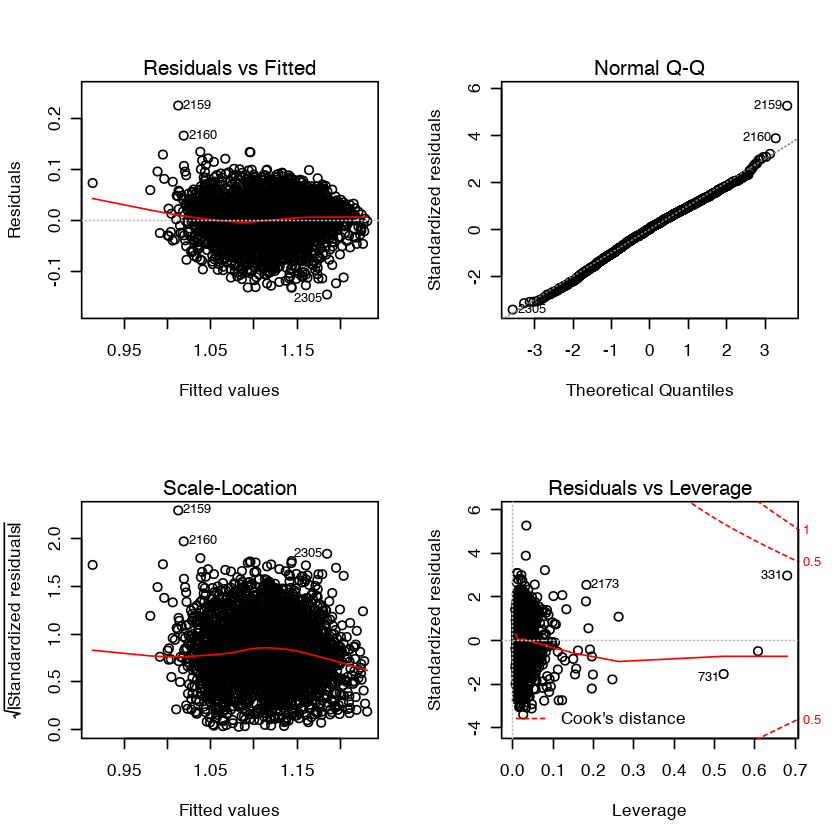

In [39]:
par(mfrow=c(2, 2))
plot(mod.r)

In [40]:
sort(abs(mod.r$coefficients))

I(vpd^2)    I(density^2)    exp(TMarAug)         I(wd^2)   I(ddAugJul^2) 
   2.414169e-12    1.001010e-11    1.297302e-09    9.863395e-09    1.192608e-08 
 exp(fallTmean)        I(cwd^2)    I(mStdAge^2) I(PcumOctSep^2)        SprsAcre 
   4.151863e-08    1.205647e-07    1.596935e-07    1.135720e-06    1.157269e-06 
            vpd         density    exp(TOctSep)      exp(Tmean)   I(summerP2^2) 
   1.244583e-06    1.387260e-06    4.818002e-06    4.994165e-06    5.074521e-06 
  I(summerP0^2)        I(lon^2)          etopo1         mStdAge        I(prs^2) 
   1.792386e-05    2.112260e-05    4.809244e-05    5.797118e-05    7.389250e-05 
        OutDays    I(maxAugT^2)             PPT              wd    I(AugMaxT^2) 
   8.513501e-05    1.248044e-04    1.291589e-04    2.062885e-04    2.531582e-04 
      I(maxT^2)        summerP2       SprsFires   I(AugTmean^2)      I(Pmean^2) 
   3.182103e-04    3.653229e-04    5.493858e-04    5.609220e-04    6.509272e-04 
       I(lat^2)    I(OctTmin^2)      I(Tmean^2)             prs      I(Jan20^2) 
   8.393097e-04    9.805424e-04    1.226077e-03    1.479469e-03    3.419844e-03 
       I(Acs^2)       I(Tvar^2)      PcumOctSep          PctOld          JanMin 
   4.164879e-03    4.743765e-03    5.218106e-03    7.079765e-03    7.684681e-03 
        MarTmin            GAP1             Acs           Jan20       winterMin 
   9.150291e-03    9.296692e-03    1.204742e-02    1.280179e-02    1.410102e-02 
        PctSprs         AugTmax            minT            Tmin         I(mi^2) 
   1.488828e-02    1.715455e-02    2.356043e-02    2.474761e-02    2.903194e-02 
        OctTmin        AugTmean             lat         TMarAug           Mar20 
   3.465169e-02    4.453162e-02    6.660614e-02    7.206853e-02    9.380059e-02 
      fallTmean           Pmean            Tvar  log(Mar20 + 1)              mi 
   9.790961e-02    1.147495e-01    1.193585e-01    1.586347e-01    3.426274e-01 
    (Intercept)         TOctSep           Tmean 
   7.480572e-01    2.202879e+00    2.375328e+00